In [120]:
import numpy as np
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
from dateutil.relativedelta import relativedelta
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, classification_report, roc_curve, auc
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, plot_roc_curve, plot_precision_recall_curve

from sklearn.linear_model import LogisticRegression
import xgboost as xgb
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from lightgbm import LGBMClassifier
from xgboost import plot_importance
import lightgbm as lgb
from sklearn.ensemble import GradientBoostingClassifier

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek, SMOTEENN
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.over_sampling import SVMSMOTE
from imblearn.over_sampling import ADASYN
from imblearn.pipeline import Pipeline as imbpipeline
from imblearn.pipeline import make_pipeline

from sklearn.preprocessing import scale, StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score

random_state = 99

In [121]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [122]:
df_raw_ma = pd.read_csv('/content/drive/My Drive/Supplychain/ai4i2020.csv')
print('Number of Rows : ',df_raw_ma.shape)
print('Count Products : ',df_raw_ma['Product ID'].nunique())

Number of Rows :  (10000, 14)
Count Products :  10000


In [123]:
df_raw_ma.head()

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0


In [124]:
# Get one hot encoding of columns B
one_hot = pd.get_dummies(df_raw_ma['Type'])
df_raw_ma = df_raw_ma.drop('Type',axis = 1)
df_raw_ma = df_raw_ma.join(one_hot)
df_raw_ma.head(10)  

,UDI,Product ID,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF,H,L,M
0,1,M14860,298.1,308.6,1551,42.8,0,0,0,0,0,0,0,0,0,1
1,2,L47181,298.2,308.7,1408,46.3,3,0,0,0,0,0,0,0,1,0
2,3,L47182,298.1,308.5,1498,49.4,5,0,0,0,0,0,0,0,1,0
3,4,L47183,298.2,308.6,1433,39.5,7,0,0,0,0,0,0,0,1,0
4,5,L47184,298.2,308.7,1408,40.0,9,0,0,0,0,0,0,0,1,0
5,6,M14865,298.1,308.6,1425,41.9,11,0,0,0,0,0,0,0,0,1
6,7,L47186,298.1,308.6,1558,42.4,14,0,0,0,0,0,0,0,1,0
7,8,L47187,298.1,308.6,1527,40.2,16,0,0,0,0,0,0,0,1,0
8,9,M14868,298.3,308.7,1667,28.6,18,0,0,0,0,0,0,0,0,1
9,10,M14869,298.5,309.0,1741,28.0,21,0,0,0,0,0,0,0,0,1


In [125]:
#df_TWF = df_MF.rename(columns={'Product ID': 'product_id'})
df_TWF = df_raw_ma[['Product ID','TWF']]
df_HDF = df_raw_ma[['Product ID','HDF']]
df_PWF = df_raw_ma[['Product ID','PWF']]
df_OSF = df_raw_ma[['Product ID','OSF']]
df_RNF = df_raw_ma[['Product ID','RNF']]
df_MF = df_raw_ma[['Product ID','Machine failure']]

df_TWF=df_TWF.set_index('Product ID')
df_HDF=df_HDF.set_index('Product ID')
df_PWF=df_PWF.set_index('Product ID')
df_OSF=df_OSF.set_index('Product ID')
df_RNF=df_RNF.set_index('Product ID')
df_MF=df_MF.set_index('Product ID')
df_MF.head()

,Machine failure
Product ID,
M14860,0
L47181,0
L47182,0
L47183,0
L47184,0


In [126]:
#df_features=df_raw_ma[['Air temperature [K]','Process temperature [K]','Rotational speed [rpm]','Torque [Nm]','Tool wear [min]']]

In [127]:
#X = df_raw_ma.iloc[:,:-1] #features
#y = df_raw_ma.iloc[:,-1] #MF

In [128]:
X = df_raw_ma.drop(columns=['UDI', 'Machine failure','TWF','HDF','PWF','OSF','RNF'])

In [129]:
X.head()

,Product ID,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],H,L,M
0,M14860,298.1,308.6,1551,42.8,0,0,0,1
1,L47181,298.2,308.7,1408,46.3,3,0,1,0
2,L47182,298.1,308.5,1498,49.4,5,0,1,0
3,L47183,298.2,308.6,1433,39.5,7,0,1,0
4,L47184,298.2,308.7,1408,40.0,9,0,1,0


In [130]:
df_TWF = df_raw_ma[['Product ID','TWF']]
df_HDF = df_raw_ma[['Product ID','HDF']]
df_PWF = df_raw_ma[['Product ID','PWF']]
df_OSF = df_raw_ma[['Product ID','OSF']]
df_RNF = df_raw_ma[['Product ID','RNF']]
df_MF = df_raw_ma[['Product ID','Machine failure']]

In [131]:
X = X.rename(columns={'Process temperature [K]': 'process_temperature_k'
                      , 'Rotational speed [rpm]': 'rotational_speed_rpm'
                      , 'Torque [Nm]': 'torque_nm'
                      , 'Tool wear [min]' : 'tool_wear_min'
                      , 'Air temperature [K]' : 'air_temperature_k'
                     }
            )
X=X.set_index('Product ID')
X.head()

,air_temperature_k,process_temperature_k,rotational_speed_rpm,torque_nm,tool_wear_min,H,L,M
Product ID,,,,,,,,
M14860,298.1,308.6,1551,42.8,0,0,0,1
L47181,298.2,308.7,1408,46.3,3,0,1,0
L47182,298.1,308.5,1498,49.4,5,0,1,0
L47183,298.2,308.6,1433,39.5,7,0,1,0
L47184,298.2,308.7,1408,40.0,9,0,1,0


In [132]:
y = df_MF

In [133]:
y.head()

,Product ID,Machine failure
0,M14860,0
1,L47181,0
2,L47182,0
3,L47183,0
4,L47184,0


## Feature Engineering

In [134]:
X['air_temperature_k_X_process_temperature_k'] = X.air_temperature_k * X.process_temperature_k
X['air_temperature_k_X_rotational_speed_rpm'] = X.air_temperature_k * X.rotational_speed_rpm
X['air_temperature_k_X_torque_nm'] = X.air_temperature_k * X.torque_nm
X['air_temperature_k_X_tool_wear_min'] = X.air_temperature_k * X.tool_wear_min


X['process_temperature_k_X_rotational_speed_rpm'] = X.process_temperature_k * X.rotational_speed_rpm
X['process_temperature_k_X_torque_nm'] = X.process_temperature_k * X.torque_nm
X['process_temperature_k_X_tool_wear_min'] = X.process_temperature_k * X.tool_wear_min

 
X['rotational_speed_rpm_X_torque_nm'] = X.rotational_speed_rpm * X.torque_nm
X['rotational_speed_rpm_X_tool_wear_min'] = X.rotational_speed_rpm * X.tool_wear_min


X['torque_nm_X_tool_wear_min'] = X.torque_nm * X.tool_wear_min

X['diff_temperature'] = X.air_temperature_k - X.process_temperature_k

X['diff_temperature_X_rotational_speed_rpm'] = X.diff_temperature * X.rotational_speed_rpm
X['diff_temperature_X_torque_nm'] = X.diff_temperature * X.torque_nm
X['diff_temperature_X_tool_wear_min'] = X.diff_temperature * X.tool_wear_min

#31

In [135]:
X.head()

,air_temperature_k,process_temperature_k,rotational_speed_rpm,torque_nm,tool_wear_min,H,L,M,air_temperature_k_X_process_temperature_k,air_temperature_k_X_rotational_speed_rpm,air_temperature_k_X_torque_nm,air_temperature_k_X_tool_wear_min,process_temperature_k_X_rotational_speed_rpm,process_temperature_k_X_torque_nm,process_temperature_k_X_tool_wear_min,rotational_speed_rpm_X_torque_nm,rotational_speed_rpm_X_tool_wear_min,torque_nm_X_tool_wear_min,diff_temperature,diff_temperature_X_rotational_speed_rpm,diff_temperature_X_torque_nm,diff_temperature_X_tool_wear_min
Product ID,,,,,,,,,,,,,,,,,,,,,,
M14860,298.1,308.6,1551,42.8,0,0,0,1,91993.66,462353.1,12758.68,0.0,478638.6,13208.08,0.0,66382.8,0,0.0,-10.5,-16285.5,-449.40,-0.0
L47181,298.2,308.7,1408,46.3,3,0,1,0,92054.34,419865.6,13806.66,894.6,434649.6,14292.81,926.1,65190.4,4224,138.9,-10.5,-14784.0,-486.15,-31.5
L47182,298.1,308.5,1498,49.4,5,0,1,0,91963.85,446553.8,14726.14,1490.5,462133.0,15239.90,1542.5,74001.2,7490,247.0,-10.4,-15579.2,-513.76,-52.0
L47183,298.2,308.6,1433,39.5,7,0,1,0,92024.52,427320.6,11778.90,2087.4,442223.8,12189.70,2160.2,56603.5,10031,276.5,-10.4,-14903.2,-410.80,-72.8
L47184,298.2,308.7,1408,40.0,9,0,1,0,92054.34,419865.6,11928.00,2683.8,434649.6,12348.00,2778.3,56320.0,12672,360.0,-10.5,-14784.0,-420.00,-94.5


In [136]:
y=y.set_index('Product ID')
y.head()

,Machine failure
Product ID,
M14860,0
L47181,0
L47182,0
L47183,0
L47184,0


In [137]:
y=y['Machine failure']
y.head()

Product ID
M14860    0
L47181    0
L47182    0
L47183    0
L47184    0
Name: Machine failure, dtype: int64

In [138]:
'''
xgb_selector = SelectFromModel(xgb.XGBClassifier(objective ='binary:logistic'
                                                 , random_state=random_state
                                                 , n_estimators=500
                                                 , metric='auc')
                                                 , max_features=20)
xgb_selector.fit(X, y)
xgb_support = xgb_selector.get_support()
xgb_feature = X.loc[:,xgb_support].columns.tolist()
xgb_feature
'''

"\nxgb_selector = SelectFromModel(xgb.XGBClassifier(objective ='binary:logistic'\n                                                 , random_state=random_state\n                                                 , n_estimators=500\n                                                 , metric='auc')\n                                                 , max_features=20)\nxgb_selector.fit(X, y)\nxgb_support = xgb_selector.get_support()\nxgb_feature = X.loc[:,xgb_support].columns.tolist()\nxgb_feature\n"

## Feature Selection

In [139]:
from sklearn.feature_selection import RFE
from lightgbm import LGBMClassifier
from sklearn.preprocessing import scale

from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import  ExtraTreesClassifier
from sklearn.ensemble import  GradientBoostingClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression


def all_feature_selection(X,y,num_features):
    X_std = scale(X)
    scale_pos_weight = (len(y) - sum(y)) / sum(y)
    #num_features = 20

    ## Recursive Feature Elimination

    rfe_xgb_selector = RFE(estimator=xgb.XGBClassifier(objective ='binary:logistic'
                                                       , random_state=random_state
                                                       , scale_pos_weight=scale_pos_weight
                                                       , n_estimators=500, metric='auc')
                                                       ,n_features_to_select=num_features
                                                       , step=1
                                                       , verbose=5)
    rfe_lgb_selector = RFE(estimator=LGBMClassifier(is_unbalance=True
                                                    , metric='auc'
                                                    , random_state=random_state)
                                                    , n_features_to_select=num_features
                                                    , step=1
                                                    , verbose=5)

    rfe_xgb_selector.fit(X, y)
    rfe_lgb_selector.fit(X, y)

    rfe_support = rfe_xgb_selector.get_support()
    rfe_xgb_feature = X.loc[:,rfe_support].columns.tolist()

    rfe_lgb_support = rfe_lgb_selector.get_support()
    rfe_lgb_feature = X.loc[:,rfe_lgb_support].columns.tolist()

    ## Tree Based
    adb_selector = SelectFromModel(AdaBoostClassifier(n_estimators=500
                                                      , random_state=random_state)
                                                      , max_features=num_features)
    et_selector = SelectFromModel(ExtraTreesClassifier(n_estimators=500
                                                       , random_state=random_state)
                                                       , max_features=num_features)
    gb_selector = SelectFromModel(GradientBoostingClassifier(n_estimators=500
                                                             , random_state=random_state)
                                                             , max_features=num_features)
    rf_selector = SelectFromModel(RandomForestClassifier(n_estimators=500
                                                         , random_state=random_state)
                                                         , max_features=num_features)
    xgb_selector = SelectFromModel(xgb.XGBClassifier(objective ='binary:logistic'
                                                     , random_state=random_state
                                                     ,scale_pos_weight=scale_pos_weight
                                                     , n_estimators=500
                                                     , metric='auc')
                                                     , max_features=num_features)
    lgb_selector = SelectFromModel(LGBMClassifier(is_unbalance=True, metric='auc'
                                                  , random_state=random_state)
                                                  , max_features=num_features)
    lasso_selector = SelectFromModel(LogisticRegression(solver='liblinear'
                                                        , class_weight='balanced'
                                                        , penalty="l1"
                                                        , random_state=random_state)
                                                        , max_features=num_features)

    adb_selector.fit(X, y)
    et_selector.fit(X, y)
    gb_selector.fit(X, y)
    rf_selector.fit(X, y)
    xgb_selector.fit(X, y)
    lgb_selector.fit(X, y)
    lasso_selector.fit(X_std, y)

    adb_support = adb_selector.get_support()
    adb_feature = X.loc[:,adb_support].columns.tolist()

    et_support = et_selector.get_support()
    et_feature = X.loc[:,et_support].columns.tolist()

    gb_support = gb_selector.get_support()
    gb_feature = X.loc[:,gb_support].columns.tolist()

    rf_support = rf_selector.get_support()
    rf_feature = X.loc[:,rf_support].columns.tolist()

    xgb_support = xgb_selector.get_support()
    xgb_feature = X.loc[:,xgb_support].columns.tolist()

    lgb_support = lgb_selector.get_support()
    lgb_feature = X.loc[:,lgb_support].columns.tolist()

    lasso_support = lasso_selector.get_support()
    lasso_feature = X.loc[:,lasso_support].columns.tolist()

    print('RFE-XGBoost : ',str(len(rfe_xgb_feature)), 'features')
    print('RFE-LightGBM',str(len(rfe_lgb_feature)), 'features')

    print('TreeBased-AdaBoost : ',str(len(adb_feature)), 'features')
    print('TreeBased-ExtraTrees : ',str(len(et_feature)), 'features')
    print('TreeBased-GradientBoosting : ',str(len(gb_feature)), 'features')
    print('TreeBased-RandomForest : ',str(len(rf_feature)), 'features')
    print('TreeBased-XGBoost : ',str(len(xgb_feature)), 'features')
    print('TreeBased-LightGBM : ',str(len(lgb_feature)), 'features')
    print('Lasso : ',str(len(lasso_feature)), 'features')
    
    ## Feature Voting
    feature_df = pd.DataFrame({ 'feature': X.columns})

    feature_df['RFE-XGB'] = feature_df['feature'].isin(rfe_xgb_feature)
    feature_df['RFE-LGB'] = feature_df['feature'].isin(rfe_lgb_feature)
    feature_df['Lasso'] = feature_df['feature'].isin(lasso_feature)
    feature_df['RandomForest'] = feature_df['feature'].isin(rf_feature)
    feature_df['AdaBoost'] = feature_df['feature'].isin(adb_feature)
    feature_df['ExtraTrees'] = feature_df['feature'].isin(et_feature)
    feature_df['GradientBoosting'] = feature_df['feature'].isin(gb_feature)
    feature_df['XGBoost'] = feature_df['feature'].isin(xgb_feature)
    feature_df['LightGBM'] = feature_df['feature'].isin(lgb_feature)
    feature_df['Total'] = feature_df.sum(axis=1)
    return feature_df #,feature_df[feature_df['Total']>0].sort_values('Total', ascending=False)    

In [140]:
## X Feature Engineer
feature_df=all_feature_selection(X,y,20)
feature_df[feature_df['Total']>0].sort_values('Total', ascending=False)   

Fitting estimator with 22 features.
Fitting estimator with 21 features.
Fitting estimator with 22 features.
Fitting estimator with 21 features.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


RFE-XGBoost :  20 features
RFE-LightGBM 20 features
TreeBased-AdaBoost :  14 features
TreeBased-ExtraTrees :  11 features
TreeBased-GradientBoosting :  5 features
TreeBased-RandomForest :  10 features
TreeBased-XGBoost :  6 features
TreeBased-LightGBM :  12 features
Lasso :  17 features


,feature,RFE-XGB,RFE-LGB,Lasso,RandomForest,AdaBoost,ExtraTrees,GradientBoosting,XGBoost,LightGBM,Total
2,rotational_speed_rpm,True,True,True,True,True,True,True,True,True,9
19,diff_temperature_X_rotational_speed_rpm,True,True,True,True,True,True,True,True,True,9
15,rotational_speed_rpm_X_torque_nm,True,True,True,True,True,True,True,True,True,9
18,diff_temperature,True,True,True,True,True,True,True,False,True,8
10,air_temperature_k_X_torque_nm,True,True,True,True,True,True,False,True,True,8
12,process_temperature_k_X_rotational_speed_rpm,True,True,True,True,True,True,False,True,True,8
17,torque_nm_X_tool_wear_min,True,True,True,True,True,True,True,False,True,8
9,air_temperature_k_X_rotational_speed_rpm,True,True,True,True,True,True,False,False,True,7
20,diff_temperature_X_torque_nm,True,True,True,False,True,True,False,False,True,6
13,process_temperature_k_X_torque_nm,True,True,True,True,True,True,False,False,False,6


In [141]:
fieldset = feature_df[feature_df.Total > 4].feature.values
fieldset

array(['rotational_speed_rpm', 'torque_nm',
       'air_temperature_k_X_rotational_speed_rpm',
       'air_temperature_k_X_torque_nm',
       'process_temperature_k_X_rotational_speed_rpm',
       'process_temperature_k_X_torque_nm',
       'rotational_speed_rpm_X_torque_nm', 'torque_nm_X_tool_wear_min',
       'diff_temperature', 'diff_temperature_X_rotational_speed_rpm',
       'diff_temperature_X_torque_nm', 'diff_temperature_X_tool_wear_min'],
      dtype=object)

In [142]:
#air_temperature_k	process_temperature_k	rotational_speed_rpm	torque_nm	tool_wear_min	H	L	M

In [143]:
X_all=X[['air_temperature_k'
         ,'process_temperature_k'
         ,'rotational_speed_rpm'
         ,'torque_nm','tool_wear_min'
         ,'H'
         ,'L'
         ,'M']]

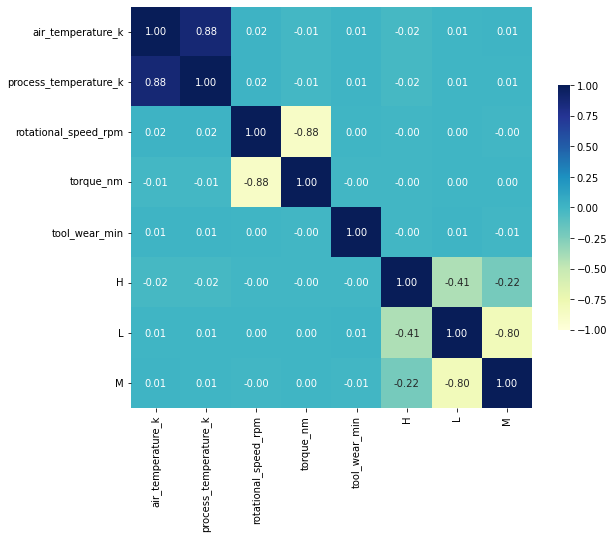

In [144]:
plt.figure(figsize=(9,9))
sns.heatmap(X_all.corr(), cmap='YlGnBu', vmin=-1, vmax=1, annot=True, fmt='.2f', square=True, cbar_kws = {'shrink':.5},annot_kws={"size": 10});

In [145]:
## X_all=X[['air_temperature_k','process_temperature_k','rotational_speed_rpm','torque_nm','tool_wear_min','H','L','M']]
all_feature_selection(X_all,y,8)

RFE-XGBoost :  8 features
RFE-LightGBM 8 features
TreeBased-AdaBoost :  3 features
TreeBased-ExtraTrees :  5 features
TreeBased-GradientBoosting :  5 features
TreeBased-RandomForest :  4 features
TreeBased-XGBoost :  3 features
TreeBased-LightGBM :  5 features
Lasso :  7 features


,feature,RFE-XGB,RFE-LGB,Lasso,RandomForest,AdaBoost,ExtraTrees,GradientBoosting,XGBoost,LightGBM,Total
0,air_temperature_k,True,True,True,True,False,True,True,False,True,7
1,process_temperature_k,True,True,True,False,False,True,True,False,True,6
2,rotational_speed_rpm,True,True,True,True,True,True,True,True,True,9
3,torque_nm,True,True,True,True,True,True,True,True,True,9
4,tool_wear_min,True,True,True,True,True,True,True,True,True,9
5,H,True,True,True,False,False,False,False,False,False,3
6,L,True,True,True,False,False,False,False,False,False,3
7,M,True,True,False,False,False,False,False,False,False,2


In [146]:
X_old_sub=X_all[['air_temperature_k'
                 ,'process_temperature_k'
                 ,'rotational_speed_rpm'
                 ,'torque_nm'
                 ,'tool_wear_min'
                ]]

In [147]:
'''
X_fe_sub=X[['rotational_speed_rpm'
         ,'torque_nm'
         ,'tool_wear_min'
         ,'air_temperature_k_X_rotational_speed_rpm'
         ,'air_temperature_k_X_torque_nm'
         ,'process_temperature_k_X_rotational_speed_rpm'
         ,'process_temperature_k_X_torque_nm'
         ,'rotational_speed_rpm_X_torque_nm'
         ,'rotational_speed_rpm_X_tool_wear_min'
         ,'torque_nm_X_tool_wear_min'
         ,'rotational_speed_rpm_2'
         ,'air_temperature_k_diff_process_temperature_k'
        ]]
'''

X_fe_sub=X[['rotational_speed_rpm_X_torque_nm'
            , 'rotational_speed_rpm'
            ,'diff_temperature_X_rotational_speed_rpm'
            , 'diff_temperature'
            ,'torque_nm_X_tool_wear_min'
            , 'air_temperature_k_X_torque_nm'
            ,'process_temperature_k_X_rotational_speed_rpm'
            , 'torque_nm'
            ,'diff_temperature_X_torque_nm'
            ,'air_temperature_k_X_rotational_speed_rpm'
            ,'process_temperature_k_X_torque_nm'
            ,'diff_temperature_X_tool_wear_min'
            , 'tool_wear_min'
           ]]


In [148]:
X_old_sub.head()
#5

,air_temperature_k,process_temperature_k,rotational_speed_rpm,torque_nm,tool_wear_min
Product ID,,,,,
M14860,298.1,308.6,1551,42.8,0
L47181,298.2,308.7,1408,46.3,3
L47182,298.1,308.5,1498,49.4,5
L47183,298.2,308.6,1433,39.5,7
L47184,298.2,308.7,1408,40.0,9


In [149]:
X_fe_sub.head()
#12

,rotational_speed_rpm_X_torque_nm,rotational_speed_rpm,diff_temperature_X_rotational_speed_rpm,diff_temperature,torque_nm_X_tool_wear_min,air_temperature_k_X_torque_nm,process_temperature_k_X_rotational_speed_rpm,torque_nm,diff_temperature_X_torque_nm,air_temperature_k_X_rotational_speed_rpm,process_temperature_k_X_torque_nm,diff_temperature_X_tool_wear_min,tool_wear_min
Product ID,,,,,,,,,,,,,
M14860,66382.8,1551,-16285.5,-10.5,0.0,12758.68,478638.6,42.8,-449.40,462353.1,13208.08,-0.0,0
L47181,65190.4,1408,-14784.0,-10.5,138.9,13806.66,434649.6,46.3,-486.15,419865.6,14292.81,-31.5,3
L47182,74001.2,1498,-15579.2,-10.4,247.0,14726.14,462133.0,49.4,-513.76,446553.8,15239.90,-52.0,5
L47183,56603.5,1433,-14903.2,-10.4,276.5,11778.90,442223.8,39.5,-410.80,427320.6,12189.70,-72.8,7
L47184,56320.0,1408,-14784.0,-10.5,360.0,11928.00,434649.6,40.0,-420.00,419865.6,12348.00,-94.5,9


## Define Resample & Set StratifiedKFold

In [150]:
undersampler = RandomUnderSampler(random_state=random_state)
oversampler = RandomOverSampler(random_state=random_state)
smote = SMOTE(random_state=random_state)
smote_tomek = SMOTETomek(random_state=random_state)
smote_enn = SMOTEENN(random_state=random_state)
smote_borderline = BorderlineSMOTE(random_state=random_state)
smote_svm = SVMSMOTE(random_state=random_state)
adasyn = ADASYN(random_state=random_state)

resamplers = [('no resampler', None),('undersampler', undersampler),('oversampler', oversampler),
                     ('smote', smote),('smote_tomek', smote_tomek),('smote_enn', smote_enn),        
                     ('smote_borderline', smote_borderline),('smote_svm', smote_svm),('adasyn', adasyn),
                    ] 

metric_cols = ['model'
               ,'resampler'  
               ,'accuracy_mean'
               ,'accuracy_std'
               ,'precision_mean'
               ,'precision_std'
               ,'recall_mean'
               ,'recall_std'
               ,'f1-score_mean'
               ,'f1-score_std'
               ,'auc_train_mean'
               ,'auc_train_std'
               ,'auc_test_mean'
               ,'auc_test_std'
               ,'auc_test_min'
               ,'auc_test_max'
              ] 

def get_resample(x, y, resampler=None):
    if resampler:
        x_rs, y_rs = resampler.fit_resample(x, y)
        x_rs = pd.DataFrame(x_rs, columns=x.columns) 
        y_rs = pd.Series(y_rs, name=y.name)
    else:
        x_rs, y_rs = x, y
    return x_rs, y_rs
def display_metrics(df):
    pd.set_option("max_colwidth", 1000)
    return df.style.bar(subset=['auc_train_mean'], color='lightskyblue')\
                    .bar(subset=['auc_test_mean'], color='lightgreen')\
                    .bar(subset=['recall_mean'], color='lightsalmon')\
                    .bar(subset=['auc_train_std'
                                 ,'auc_test_std'
                                 ,'accuracy_std'
                                 ,'precision_std'
                                 ,'recall_std'
                                 ,'f1-score_std'
                                ]
                         , color='lightgray')\
                    .format({'accuracy_mean':'{:.2%}'
                             ,'accuracy_std':'{:.2%}'
                             ,'precision_mean':'{:.2%}'
                             ,'precision_std':'{:.2%}'
                             ,'recall_mean':'{:.2%}'
                             ,'recall_std':'{:.2%}'
                             ,'f1-score_mean':'{:.2%}'
                             ,'f1-score_std':'{:.2%}'
                             ,'auc_train_mean':'{:.2%}'
                             ,'auc_train_std':'{:.2%}'
                             ,'auc_test_mean':'{:.2%}'
                             ,'auc_test_std':'{:.2%}' 
                             ,'auc_test_min':'{:.2%}' 
                             ,'auc_test_max':'{:.2%}' 
                                                                                     
                           })

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=random_state)

In [151]:
def plot_fix_imbalance(X,y,rs=None):
    if rs:
        rs.fit(X, y)
        X_rs, y_rs = rs.fit_resample(X, y)
    else:
        X_rs, y_rs = X, y
        
    df_rs = pd.concat([pd.DataFrame(data=X_rs),pd.DataFrame(data=y_rs )], axis=1, sort=False)
    sns.scatterplot(data=df_rs, x='torque_nm', y='rotational_speed_rpm', hue='Machine failure',palette='Set2')
    sns.despine()
    plt.title(str(rs)[:str(rs).find('(')])
    plt.show()
    rs_count =  df_rs.groupby(by='Machine failure').count().reset_index()
    #rs_count.plot.bar(x='Machine failure',y='torque_nm')
    sns.barplot(x="Machine failure", y='rotational_speed_rpm', hue="Machine failure", data=rs_count,palette='Set2')
    plt.show()

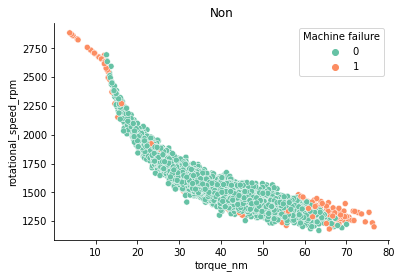

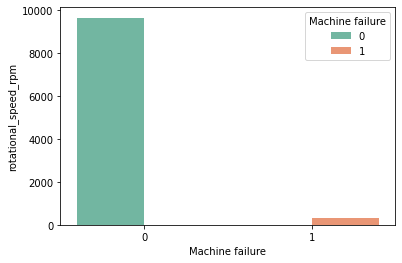

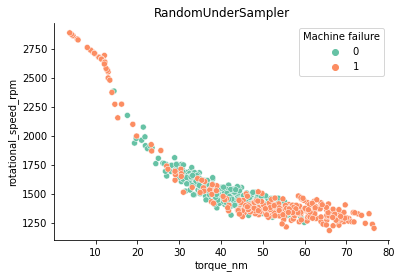

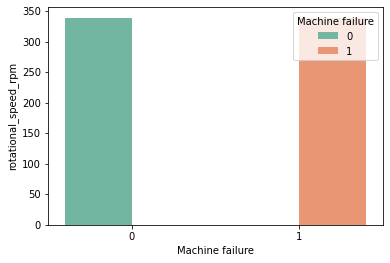

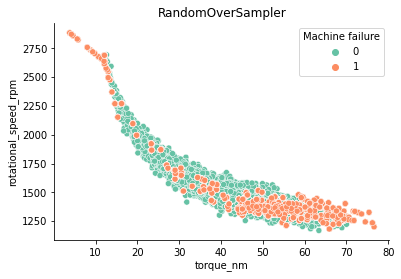

...

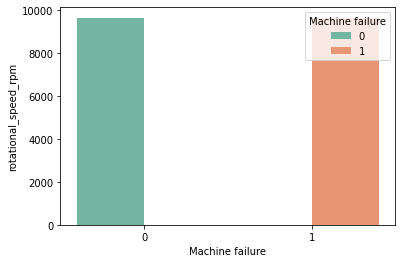

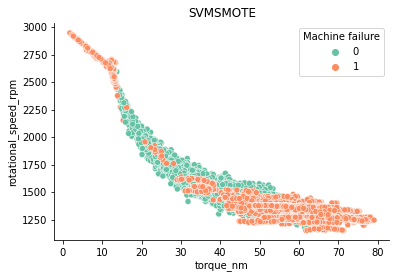

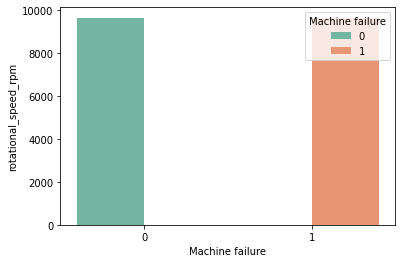

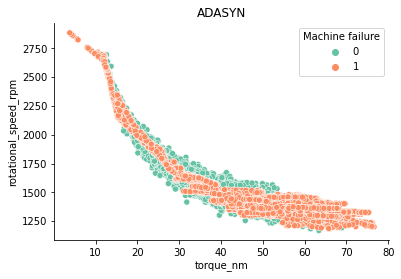

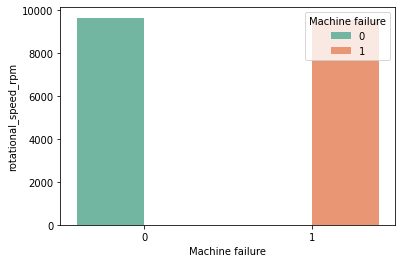

In [152]:
for rs_name, rs in resamplers:
    plot_fix_imbalance(X_all,y,rs=rs)
    #plt.show()

## Classify

### X None  Feature Engineer

#### kNN

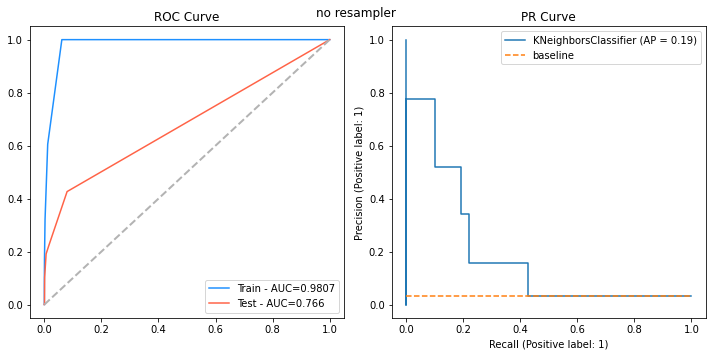

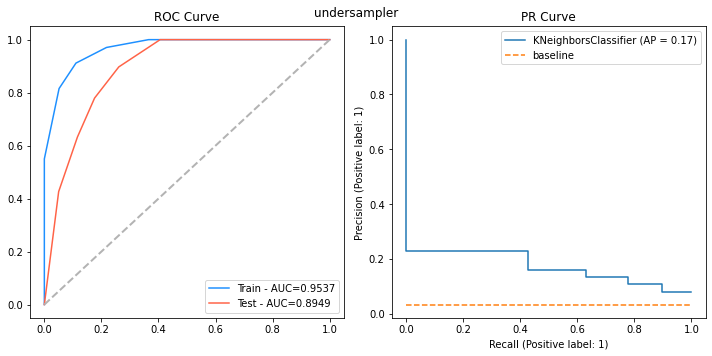

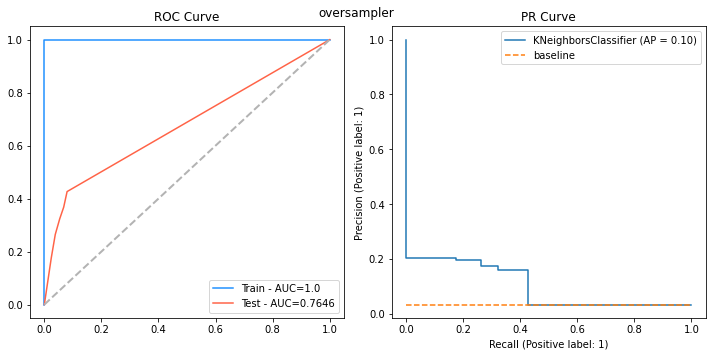

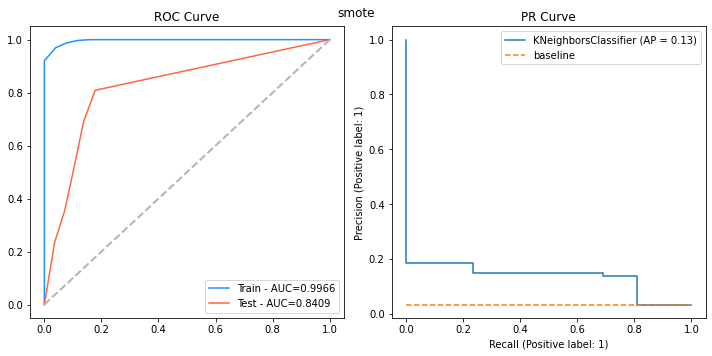

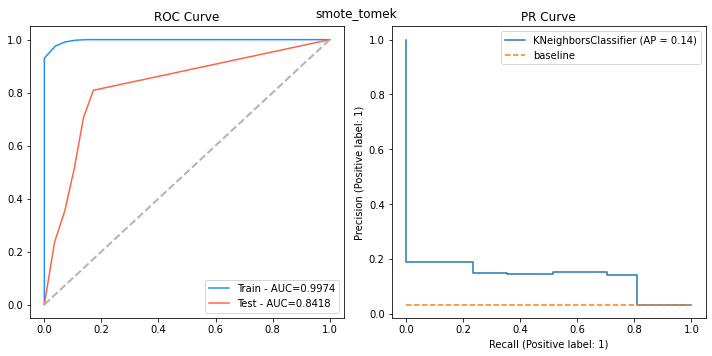

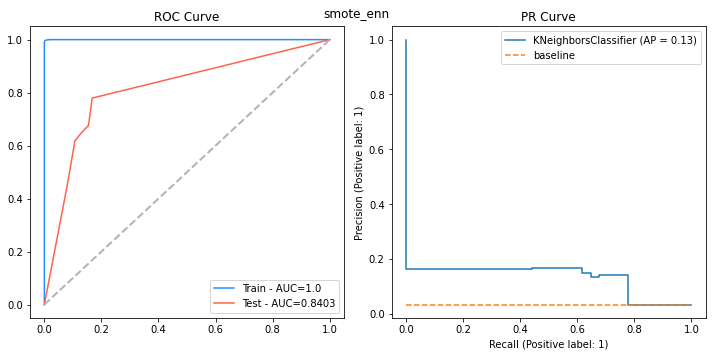

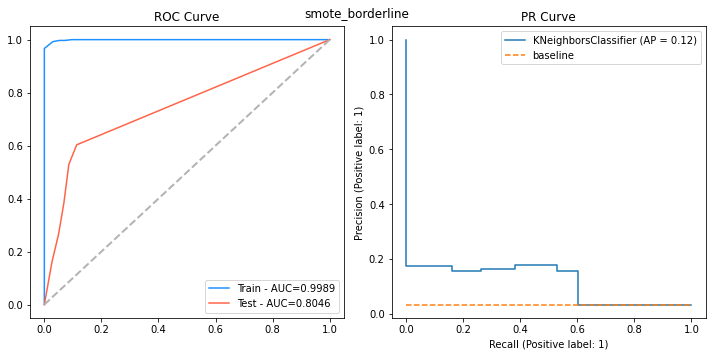

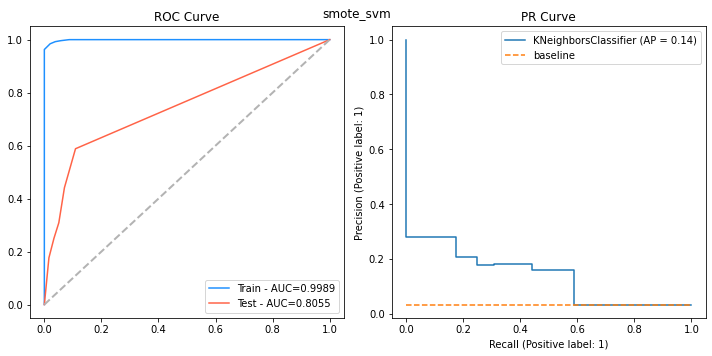

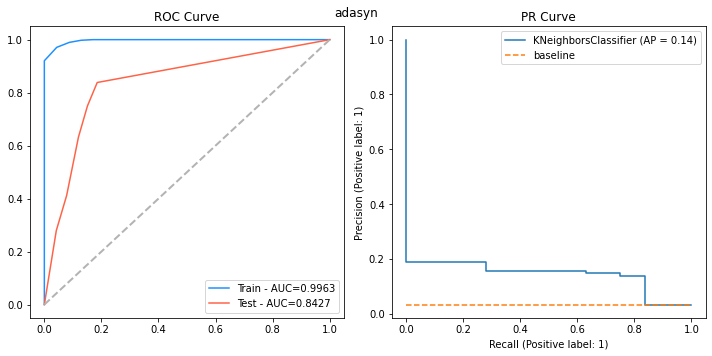

In [153]:
model_name = 'kNN'

def knn_cross_val_score(X,y,cv, resampler=None):    
    train_scores = []
    test_scores = []
    accs, precs, recs, f1s, cfmx = [], [], [], [], []
    for train_fold_index, test_fold_index in cv.split(X, y):
        
        X_train_fold, y_train_fold = X.iloc[train_fold_index], y[train_fold_index]
        X_test_fold, y_test_fold = X.iloc[test_fold_index], y[test_fold_index]
        X_train_rs, y_train_rs = get_resample(X_train_fold, y_train_fold, resampler)

        knn = KNeighborsClassifier()
        knn.fit(X_train_rs,y_train_rs)
        
        y_pred = knn.predict(X_test_fold)
        acc = accuracy_score(y_test_fold, y_pred)
        prec = precision_score(y_test_fold, y_pred)
        rec = recall_score(y_test_fold, y_pred)     
        f1 = f1_score(y_test_fold, y_pred) 
        cfm = confusion_matrix(y_test_fold, y_pred) 
        
        auc_train = roc_auc_score(y_train_rs, knn.predict_proba(X_train_rs)[:,1])
        auc_test = roc_auc_score(y_test_fold, knn.predict_proba(X_test_fold)[:,1])
        
        train_scores.append(auc_train)
        test_scores.append(auc_test)
        accs.append(acc)
        precs.append(prec)
        recs.append(rec) 
        f1s.append(f1)
        cfmx.append(cfm)

    y_train_score = knn.predict_proba(X_train_rs)[:,1]
    fpr_train, tpr_train, _ = roc_curve(y_train_rs, y_train_score)

    y_test_score = knn.predict_proba(X_test_fold)[:,1]
    fpr_test, tpr_test, _ = roc_curve(y_test_fold, y_test_score)

    fig, axs = plt.subplots(1,2, figsize=(10,5), tight_layout=True)

    ax = axs[0]
    ax.plot(fpr_train, tpr_train, color='dodgerblue', label=f'Train - AUC={round(np.mean(train_scores),4)}')
    ax.plot(fpr_test, tpr_test, color='tomato', label=f'Test - AUC={round(np.mean(test_scores),4)}')
    ax.plot([0, 1], [0, 1], color='.7', lw=2, linestyle='--')
    ax.set_title('ROC Curve')
    ax.legend(loc=4)

    ax = axs[1]
    plot_precision_recall_curve(knn, X_test_fold, y_test_fold, ax=ax)
    baseline = sum(y_test_fold == 1) / len(y_test_fold)
    ax.plot([0,1],[baseline, baseline], linestyle='--', label='baseline')
    ax.set_title('PR Curve')
    ax.legend(loc='upper right')

    plt.suptitle(rs_name)
    
    return train_scores, test_scores, accs, precs, recs,f1s, cfmx ,knn

result_kNN=[]
for rs_name, rs in resamplers:
    train_scores, test_scores,accs, precs, recs,f1s, cfmx,knn = knn_cross_val_score(X_old_sub,y,resampler=rs, cv=kf)
    result_kNN.append((model_name
                   , rs_name
                   , np.mean(accs)
                   , np.std(accs)
                   , np.mean(precs)
                   , np.std(precs)
                   , np.mean(recs)
                   , np.std(recs)
                   , np.mean(f1s)
                   , np.std(f1s)
                   , np.mean(train_scores)
                   , np.std(train_scores)
                   , np.mean(test_scores)
                   , np.std(test_scores)
                   , np.min(test_scores)
                   , np.max(test_scores)
                  )
                 )

plt.show()

In [154]:
kNN_result = pd.DataFrame(result_kNN, columns=metric_cols)
display_metrics(kNN_result.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
1,kNN,undersampler,82.47%,0.84%,14.48%,0.72%,84.94%,5.42%,24.73%,1.19%,95.37%,1.77%,89.49%,1.04%,87.64%,90.44%
8,kNN,adasyn,87.76%,0.50%,17.11%,1.34%,67.85%,5.19%,27.33%,2.12%,99.63%,0.05%,84.27%,2.04%,81.16%,86.89%
4,kNN,smote_tomek,88.60%,0.42%,17.50%,1.85%,63.73%,7.53%,27.46%,2.97%,99.74%,0.02%,84.18%,2.09%,81.24%,86.57%
3,kNN,smote,88.59%,0.30%,17.52%,1.76%,64.03%,7.87%,27.51%,2.90%,99.66%,0.02%,84.09%,2.09%,81.19%,86.44%
5,kNN,smote_enn,86.47%,0.45%,16.28%,1.08%,72.27%,5.84%,26.57%,1.81%,100.00%,0.00%,84.03%,2.10%,81.32%,86.27%
7,kNN,smote_svm,92.95%,0.33%,24.09%,3.59%,51.34%,11.52%,32.72%,5.66%,99.89%,0.02%,80.55%,3.19%,74.47%,83.11%
6,kNN,smote_borderline,91.26%,0.82%,20.66%,3.06%,55.47%,9.43%,30.03%,4.39%,99.89%,0.02%,80.46%,3.09%,74.72%,83.17%
0,kNN,no resampler,96.96%,0.17%,65.65%,7.31%,22.13%,3.16%,32.98%,4.12%,98.07%,0.15%,76.60%,4.47%,67.99%,80.82%
2,kNN,oversampler,93.21%,0.53%,24.68%,4.20%,49.28%,9.86%,32.85%,5.84%,100.00%,0.00%,76.46%,4.60%,67.57%,80.74%


#### Logistics Regression

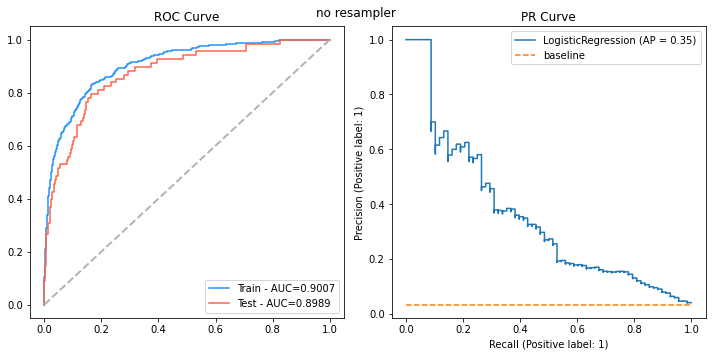

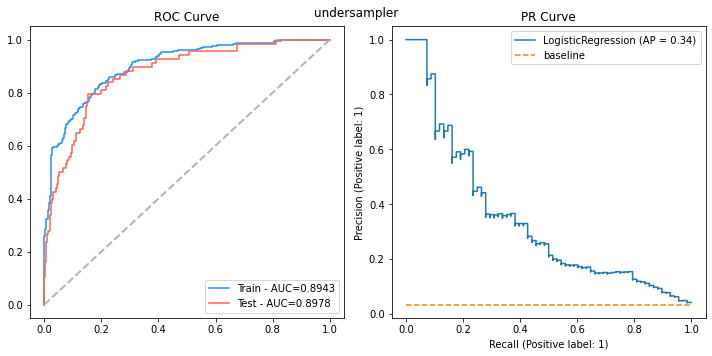

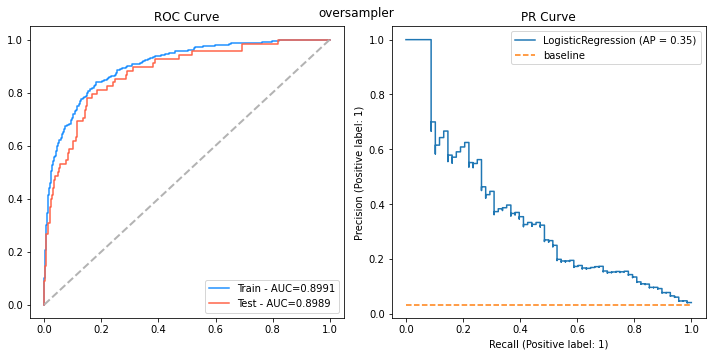

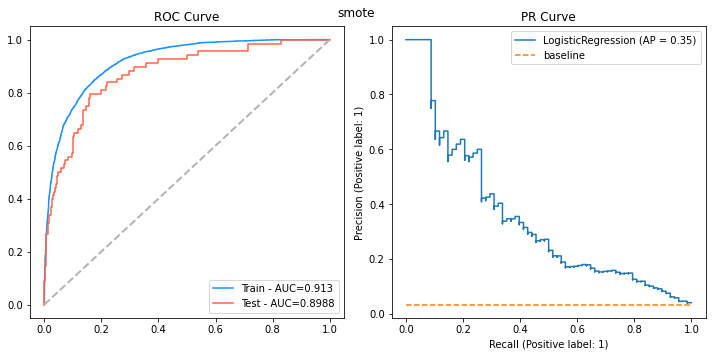

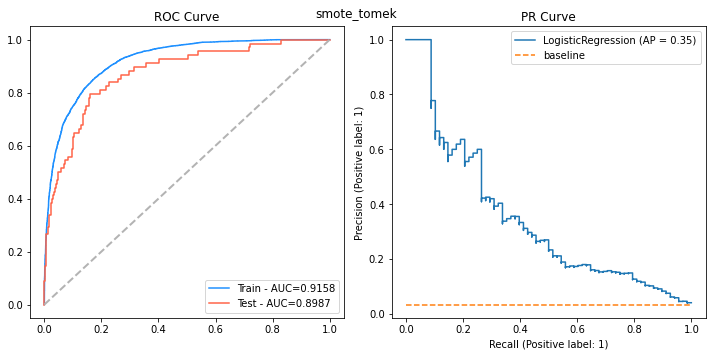

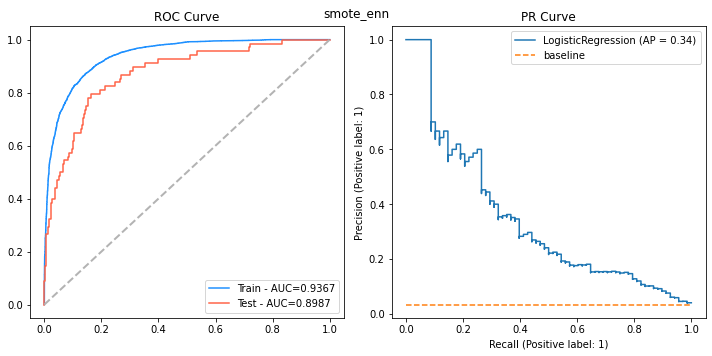

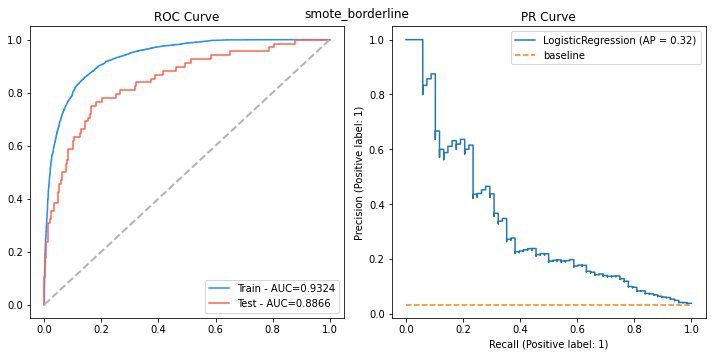

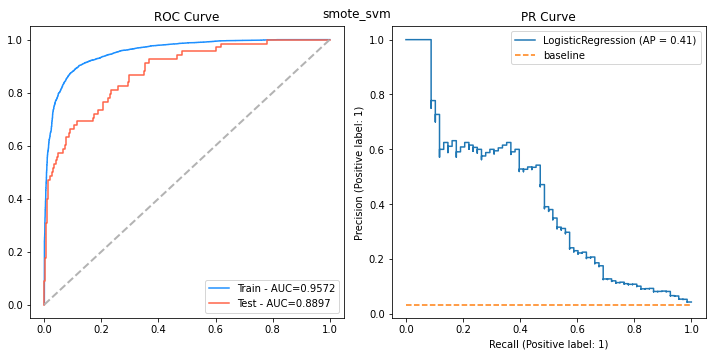

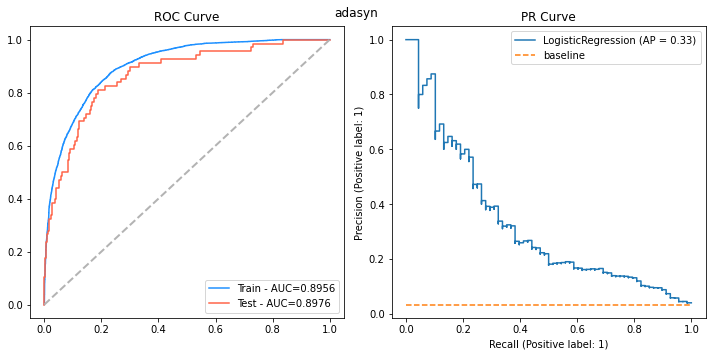

In [155]:
model_name = 'LogisticRegression'
logreg_params = {'solver': 'liblinear','class_weight': 'balanced','random_state': random_state,}
def logreg_cross_val_score(X,y,params,  cv, resampler=None):
    
    train_scores = []
    test_scores = []
    accs, precs, recs, f1s, cfmx = [], [], [], [], []
    
    for train_fold_index, test_fold_index in cv.split(X, y):
        X_train_fold, y_train_fold = X.iloc[train_fold_index], y[train_fold_index]
        X_test_fold, y_test_fold = X.iloc[test_fold_index], y[test_fold_index]
        X_train_rs, y_train_rs = get_resample(X_train_fold, y_train_fold, resampler)
        
        lg = LogisticRegression(**params)
        lg.fit(X_train_rs, y_train_rs) 

        y_pred = lg.predict(X_test_fold)
        acc = accuracy_score(y_test_fold, y_pred)
        prec = precision_score(y_test_fold, y_pred)
        rec = recall_score(y_test_fold, y_pred)     
        f1 = f1_score(y_test_fold, y_pred) 
        cfm = confusion_matrix(y_test_fold, y_pred) 
        
        auc_train = roc_auc_score(y_train_rs, lg.decision_function(X_train_rs))
        auc_test = roc_auc_score(y_test_fold, lg.decision_function(X_test_fold))
        
        train_scores.append(auc_train)
        test_scores.append(auc_test)
        accs.append(acc)
        precs.append(prec)
        recs.append(rec) 
        f1s.append(f1)
        cfmx.append(cfm)

    y_train_score = lg.predict_proba(X_train_rs)[:,1]
    fpr_train, tpr_train, _ = roc_curve(y_train_rs, y_train_score)

    y_test_score = lg.predict_proba(X_test_fold)[:,1]
    fpr_test, tpr_test, _ = roc_curve(y_test_fold, y_test_score)

    fig, axs = plt.subplots(1,2, figsize=(10,5), tight_layout=True)

    ax = axs[0]
    ax.plot(fpr_train, tpr_train, color='dodgerblue', label=f'Train - AUC={round(np.mean(train_scores),4)}')
    ax.plot(fpr_test, tpr_test, color='tomato', label=f'Test - AUC={round(np.mean(test_scores),4)}')
    ax.plot([0, 1], [0, 1], color='.7', lw=2, linestyle='--')
    ax.set_title('ROC Curve')
    ax.legend(loc=4)

    ax = axs[1]
    plot_precision_recall_curve(lg, X_test_fold, y_test_fold, ax=ax)
    baseline = sum(y_test_fold == 1) / len(y_test_fold)
    ax.plot([0,1],[baseline, baseline], linestyle='--', label='baseline')
    ax.set_title('PR Curve')
    ax.legend(loc='upper right')

    plt.suptitle(rs_name)
    
    return train_scores, test_scores, accs, precs, recs,f1s, cfmx ,lg

result_logreg=[]
for rs_name, rs in resamplers:
    train_scores, test_scores,accs, precs, recs,f1s, cfmx,lg = logreg_cross_val_score(X_old_sub,y,logreg_params, resampler=rs, cv=kf)
    result_logreg.append((model_name
                   , rs_name
                   , np.mean(accs)
                   , np.std(accs)
                   , np.mean(precs)
                   , np.std(precs)
                   , np.mean(recs)
                   , np.std(recs)
                   , np.mean(f1s)
                   , np.std(f1s)
                   , np.mean(train_scores)
                   , np.std(train_scores)
                   , np.mean(test_scores)
                   , np.std(test_scores)
                   , np.min(test_scores)
                   , np.max(test_scores)            
                  )
                 )
    
plt.show()

In [156]:
df_logreg_eval = pd.DataFrame(result_logreg, columns=metric_cols)
display_metrics(df_logreg_eval.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
2,LogisticRegression,oversampler,81.92%,0.84%,13.71%,0.77%,81.71%,3.45%,23.48%,1.25%,89.91%,0.34%,89.89%,1.28%,87.61%,91.16%
0,LogisticRegression,no resampler,82.06%,0.72%,13.80%,0.67%,81.71%,2.72%,23.62%,1.07%,90.07%,0.33%,89.89%,1.32%,87.51%,91.20%
3,LogisticRegression,smote,82.74%,0.99%,14.19%,0.80%,80.82%,3.25%,24.13%,1.23%,91.30%,0.37%,89.88%,1.41%,87.32%,91.24%
4,LogisticRegression,smote_tomek,82.83%,0.99%,14.26%,0.78%,80.82%,3.25%,24.23%,1.20%,91.58%,0.38%,89.87%,1.43%,87.28%,91.25%
5,LogisticRegression,smote_enn,82.02%,0.85%,13.78%,0.64%,81.71%,2.41%,23.58%,1.00%,93.67%,0.35%,89.87%,1.49%,87.22%,91.44%
1,LogisticRegression,undersampler,82.29%,0.55%,13.77%,0.60%,80.24%,3.02%,23.51%,0.97%,89.43%,1.06%,89.78%,1.34%,87.46%,91.04%
8,LogisticRegression,adasyn,81.01%,1.18%,13.39%,0.83%,83.78%,2.08%,23.08%,1.28%,89.56%,0.54%,89.76%,1.59%,86.79%,91.38%
7,LogisticRegression,smote_svm,88.27%,1.36%,18.23%,1.57%,69.60%,4.04%,28.83%,1.91%,95.72%,0.46%,88.97%,0.91%,87.86%,90.18%
6,LogisticRegression,smote_borderline,84.87%,1.21%,15.28%,1.46%,75.81%,6.61%,25.41%,2.28%,93.24%,0.57%,88.66%,2.37%,84.53%,91.71%


#### Decision Tree

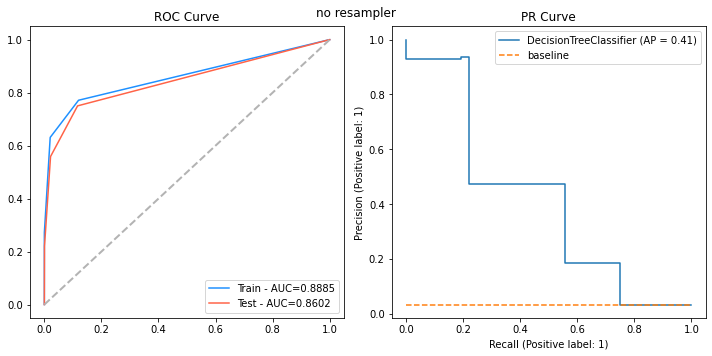

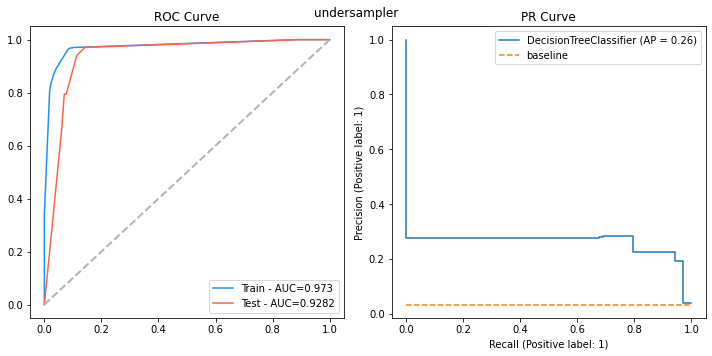

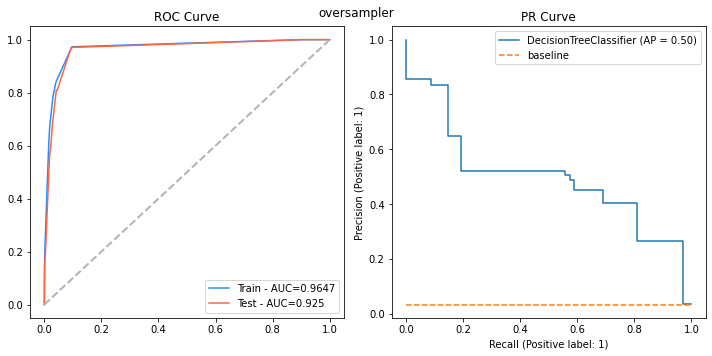

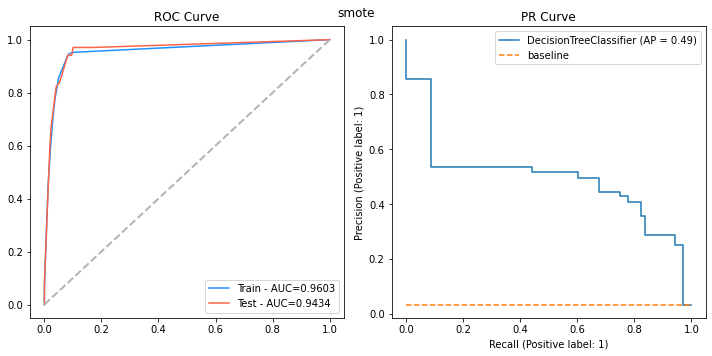

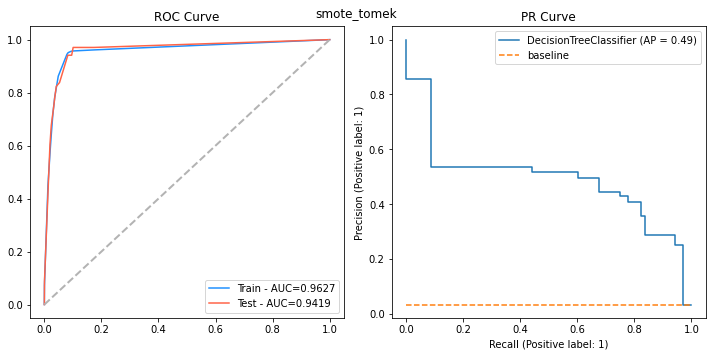

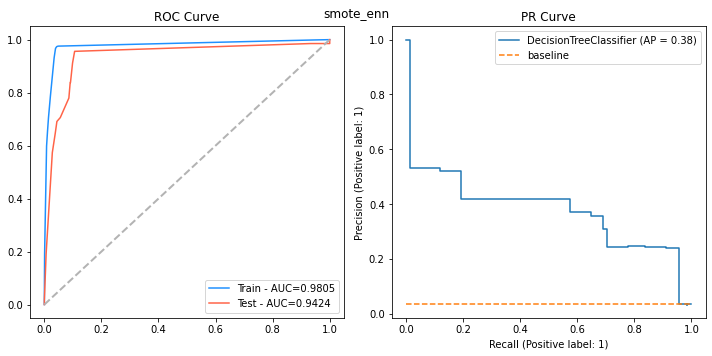

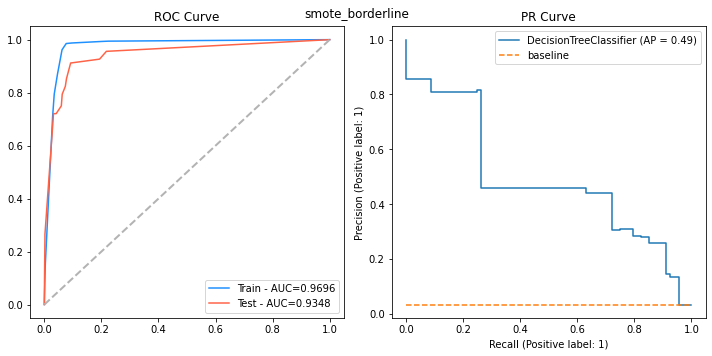

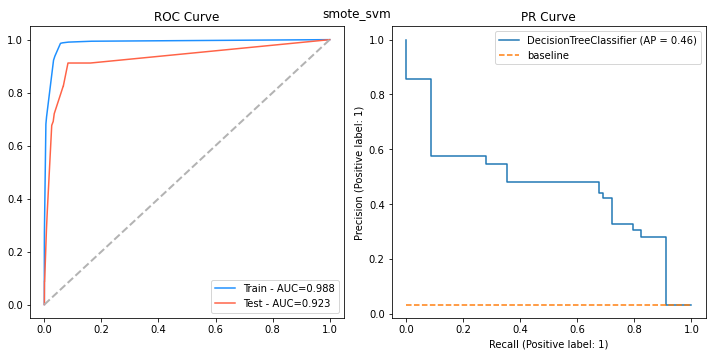

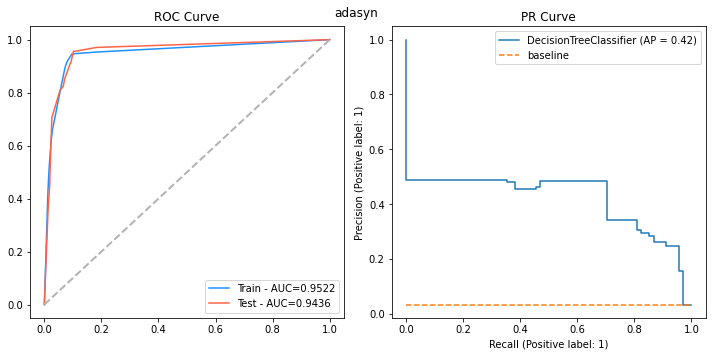

In [157]:
model_name = 'DecisionTree'
dt_params = {'max_depth':4,'random_state':random_state}
def dct_cross_val_score(X,y,params,cv,resampler=None):    
    train_scores = []
    test_scores = []
    accs, precs, recs, f1s, cfmx = [], [], [], [], []
    for train_fold_index, test_fold_index in cv.split(X, y):
        X_train_fold, y_train_fold = X.iloc[train_fold_index], y[train_fold_index]
        X_test_fold, y_test_fold = X.iloc[test_fold_index], y[test_fold_index]
        X_train_rs, y_train_rs = get_resample(X_train_fold, y_train_fold, resampler)


        dt = DecisionTreeClassifier(**params)
        dt = dt.fit(X_train_rs, y_train_rs)
        
        y_pred = dt.predict(X_test_fold)
        acc = accuracy_score(y_test_fold, y_pred)
        prec = precision_score(y_test_fold, y_pred)
        rec = recall_score(y_test_fold, y_pred)     
        f1 = f1_score(y_test_fold, y_pred) 
        cfm = confusion_matrix(y_test_fold, y_pred) 
        
        auc_train = roc_auc_score(y_train_rs, dt.predict_proba(X_train_rs)[:,1])
        auc_test = roc_auc_score(y_test_fold, dt.predict_proba(X_test_fold)[:,1])
        
        train_scores.append(auc_train)
        test_scores.append(auc_test)
        accs.append(acc)
        precs.append(prec)
        recs.append(rec) 
        f1s.append(f1)
        cfmx.append(cfm)
        
    y_train_score = dt.predict_proba(X_train_rs)[:,1]
    fpr_train, tpr_train, _ = roc_curve(y_train_rs, y_train_score)

    y_test_score = dt.predict_proba(X_test_fold)[:,1]
    fpr_test, tpr_test, _ = roc_curve(y_test_fold, y_test_score)

    fig, axs = plt.subplots(1,2, figsize=(10,5), tight_layout=True)

    ax = axs[0]
    ax.plot(fpr_train, tpr_train, color='dodgerblue', label=f'Train - AUC={round(np.mean(train_scores),4)}')
    ax.plot(fpr_test, tpr_test, color='tomato', label=f'Test - AUC={round(np.mean(test_scores),4)}')
    ax.plot([0, 1], [0, 1], color='.7', lw=2, linestyle='--')
    ax.set_title('ROC Curve')
    ax.legend(loc=4)

    ax = axs[1]
    plot_precision_recall_curve(dt, X_test_fold, y_test_fold, ax=ax)
    baseline = sum(y_test_fold == 1) / len(y_test_fold)
    ax.plot([0,1],[baseline, baseline], linestyle='--', label='baseline')
    ax.set_title('PR Curve')
    ax.legend(loc='upper right')

    plt.suptitle(rs_name)

    return train_scores, test_scores, accs, precs, recs,f1s, cfmx ,dt


result_dct=[]

for rs_name, rs in resamplers:
    train_scores, test_scores,accs, precs, recs,f1s, cfmx,dt = dct_cross_val_score(X_old_sub,y,dt_params,resampler=rs, cv=kf)
    result_dct.append((model_name
                   , rs_name
                   , np.mean(accs)
                   , np.std(accs)
                   , np.mean(precs)
                   , np.std(precs)
                   , np.mean(recs)
                   , np.std(recs)
                   , np.mean(f1s)
                   , np.std(f1s)
                   , np.mean(train_scores)
                   , np.std(train_scores)
                   , np.mean(test_scores)
                   , np.std(test_scores)
                   , np.min(test_scores)
                   , np.max(test_scores)                           
                  )
                 )
plt.show()

In [158]:
dct_result = pd.DataFrame(result_dct, columns=metric_cols)
display_metrics(dct_result.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
8,DecisionTree,adasyn,89.52%,0.91%,23.77%,1.14%,94.08%,4.11%,37.91%,1.22%,95.22%,0.24%,94.36%,2.94%,88.52%,96.38%
3,DecisionTree,smote,90.21%,1.28%,24.99%,2.33%,92.88%,6.38%,39.32%,3.18%,96.03%,0.43%,94.34%,3.93%,86.54%,96.97%
5,DecisionTree,smote_enn,88.37%,2.41%,22.31%,3.20%,93.49%,3.36%,35.86%,3.98%,98.05%,0.33%,94.24%,1.49%,91.74%,95.81%
4,DecisionTree,smote_tomek,90.24%,1.20%,24.99%,2.27%,92.59%,6.35%,39.30%,3.12%,96.27%,0.38%,94.19%,3.84%,86.61%,96.87%
6,DecisionTree,smote_borderline,87.94%,3.58%,21.46%,5.46%,86.12%,4.88%,33.96%,6.82%,96.96%,0.53%,93.48%,2.23%,89.71%,96.40%
1,DecisionTree,undersampler,88.50%,1.85%,21.79%,3.40%,89.65%,5.02%,34.99%,4.77%,97.30%,0.49%,92.82%,1.68%,89.52%,93.99%
2,DecisionTree,oversampler,89.86%,0.83%,24.18%,1.61%,92.61%,3.42%,38.32%,2.17%,96.47%,0.37%,92.50%,2.95%,87.49%,96.24%
7,DecisionTree,smote_svm,94.76%,0.49%,37.46%,2.44%,80.79%,7.30%,51.10%,3.25%,98.80%,0.13%,92.30%,3.57%,85.30%,94.74%
0,DecisionTree,no resampler,97.33%,0.15%,87.97%,4.86%,24.76%,5.71%,38.24%,6.74%,88.85%,4.00%,86.02%,5.03%,79.84%,93.11%


#### Random Forest

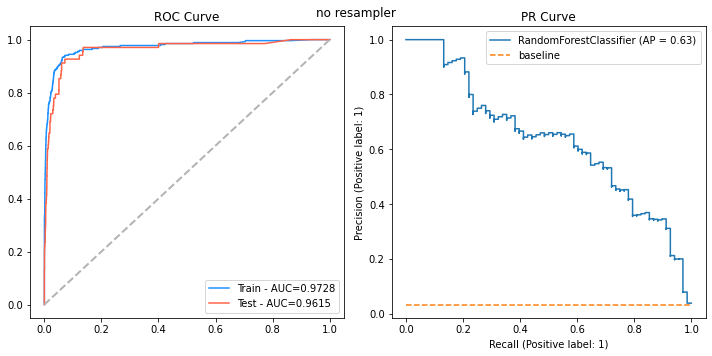

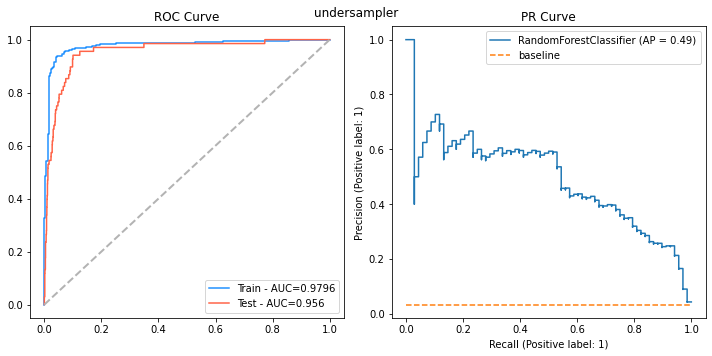

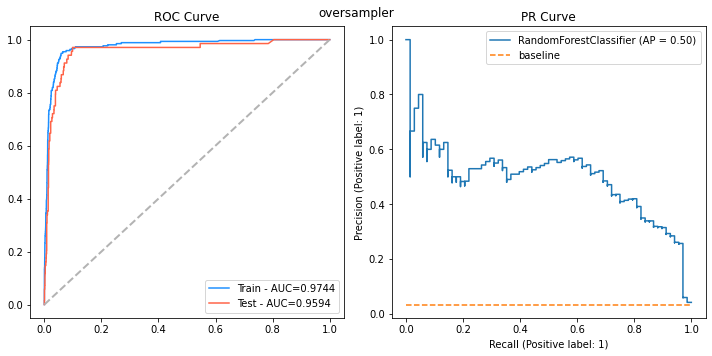

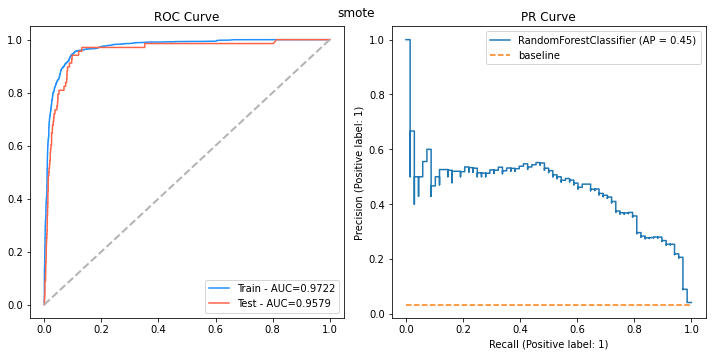

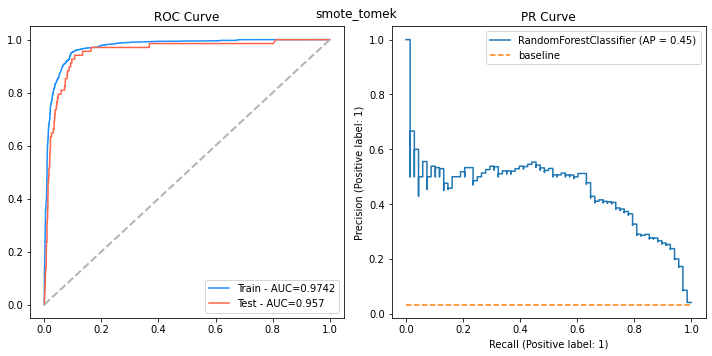

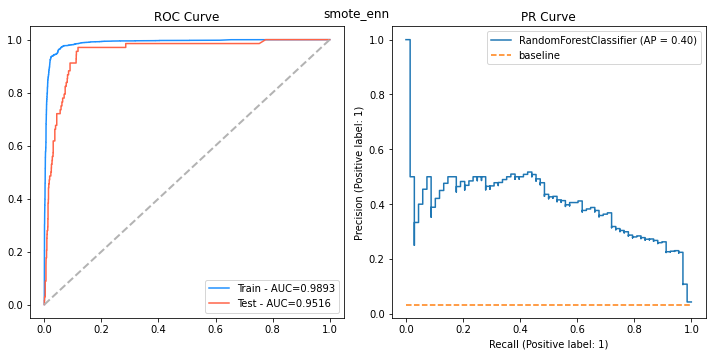

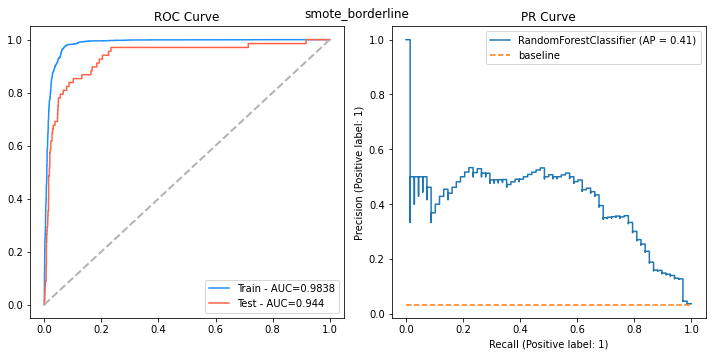

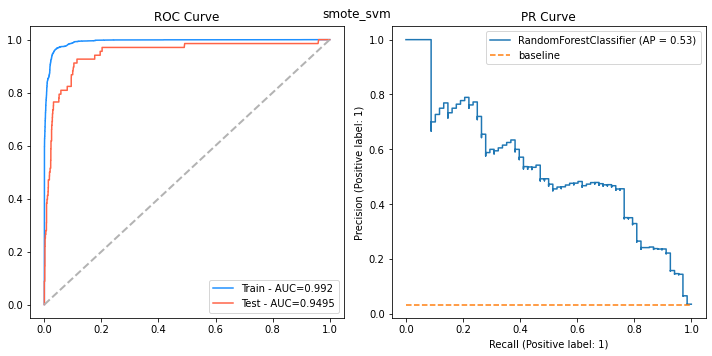

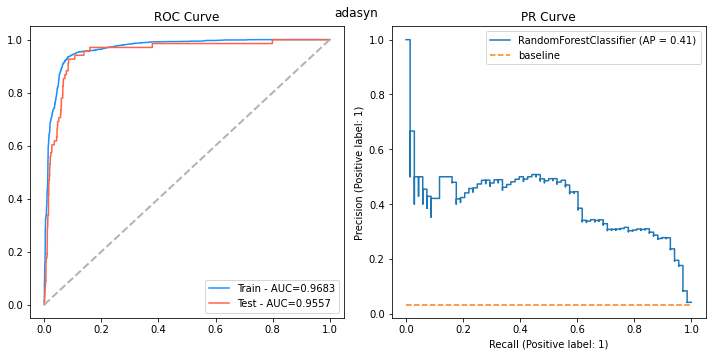

In [159]:
model_name = 'RandomForest'

def rfc_cross_val_score(X,y,cv, resampler=None):    
    train_scores = []
    test_scores = []
    accs, precs, recs, f1s, cfmx = [], [], [], [], []

    for train_fold_index, test_fold_index in cv.split(X, y):
        X_train_fold, y_train_fold = X.iloc[train_fold_index], y[train_fold_index]
        X_test_fold, y_test_fold = X.iloc[test_fold_index], y[test_fold_index]
        X_train_rs, y_train_rs = get_resample(X_train_fold, y_train_fold, resampler)


        model = RandomForestClassifier(max_depth=4,random_state=random_state)
        model = model.fit(X_train_rs, y_train_rs)
        
        y_pred = model.predict(X_test_fold)
        acc = accuracy_score(y_test_fold, y_pred)
        prec = precision_score(y_test_fold, y_pred)
        rec = recall_score(y_test_fold, y_pred)     
        f1 = f1_score(y_test_fold, y_pred) 
        cfm = confusion_matrix(y_test_fold, y_pred) 
        
        auc_train = roc_auc_score(y_train_rs, model.predict_proba(X_train_rs)[:,1])
        auc_test = roc_auc_score(y_test_fold, model.predict_proba(X_test_fold)[:,1])
        
        train_scores.append(auc_train)
        test_scores.append(auc_test)
        
        accs.append(acc)
        precs.append(prec)
        recs.append(rec) 
        f1s.append(f1)
        cfmx.append(cfm)

        
    y_train_score = model.predict_proba(X_train_rs)[:,1]
    fpr_train, tpr_train, _ = roc_curve(y_train_rs, y_train_score)

    y_test_score = model.predict_proba(X_test_fold)[:,1]
    fpr_test, tpr_test, _ = roc_curve(y_test_fold, y_test_score)

    fig, axs = plt.subplots(1,2, figsize=(10,5), tight_layout=True)

    ax = axs[0]
    ax.plot(fpr_train, tpr_train, color='dodgerblue', label=f'Train - AUC={round(np.mean(train_scores),4)}')
    ax.plot(fpr_test, tpr_test, color='tomato', label=f'Test - AUC={round(np.mean(test_scores),4)}')
    ax.plot([0, 1], [0, 1], color='.7', lw=2, linestyle='--')
    ax.set_title('ROC Curve')
    ax.legend(loc=4)

    ax = axs[1]
    plot_precision_recall_curve(model, X_test_fold, y_test_fold, ax=ax)
    baseline = sum(y_test_fold == 1) / len(y_test_fold)
    ax.plot([0,1],[baseline, baseline], linestyle='--', label='baseline')
    ax.set_title('PR Curve')
    ax.legend(loc='upper right')

    plt.suptitle(rs_name)

    return train_scores, test_scores, accs, precs, recs,f1s, cfmx ,model


result_rfc=[]

for rs_name, rs in resamplers:
    train_scores,test_scores,accs,precs,recs,f1s,cfmx,model = rfc_cross_val_score(X_old_sub,y,resampler=rs, cv=kf)
    result_rfc.append((model_name
                   , rs_name
                   , np.mean(accs)
                   , np.std(accs)
                   , np.mean(precs)
                   , np.std(precs)
                   , np.mean(recs)
                   , np.std(recs)
                   , np.mean(f1s)
                   , np.std(f1s)
                   , np.mean(train_scores)
                   , np.std(train_scores)
                   , np.mean(test_scores)
                   , np.std(test_scores)
                   , np.min(test_scores)
                   , np.max(test_scores)                        
                  )
                 )

plt.show()

In [160]:
rfc_result = pd.DataFrame(result_rfc, columns=metric_cols)
display_metrics(rfc_result.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
0,RandomForest,no resampler,97.36%,0.20%,89.74%,8.62%,25.07%,5.14%,38.94%,6.35%,97.28%,0.23%,96.15%,1.17%,94.18%,97.42%
2,RandomForest,oversampler,89.92%,0.37%,24.26%,0.37%,92.91%,2.91%,38.46%,0.45%,97.44%,0.21%,95.94%,0.89%,94.69%,97.23%
3,RandomForest,smote,89.39%,0.47%,23.44%,0.66%,93.79%,2.22%,37.49%,0.85%,97.22%,0.13%,95.79%,1.02%,94.15%,97.27%
4,RandomForest,smote_tomek,89.34%,0.55%,23.28%,0.80%,93.20%,2.94%,37.24%,1.01%,97.42%,0.10%,95.70%,1.11%,93.88%,97.26%
1,RandomForest,undersampler,87.47%,1.91%,20.59%,2.78%,92.01%,3.52%,33.59%,3.90%,97.96%,0.51%,95.60%,1.04%,93.78%,96.91%
8,RandomForest,adasyn,88.05%,0.62%,21.46%,1.12%,94.68%,2.78%,34.98%,1.59%,96.83%,0.20%,95.57%,1.04%,94.00%,97.07%
5,RandomForest,smote_enn,85.94%,1.08%,18.82%,1.51%,94.38%,3.34%,31.37%,2.19%,98.93%,0.06%,95.16%,1.13%,93.29%,96.85%
7,RandomForest,smote_svm,94.80%,0.17%,37.22%,1.05%,77.85%,4.88%,50.34%,1.84%,99.20%,0.07%,94.95%,1.37%,92.46%,96.30%
6,RandomForest,smote_borderline,89.06%,1.01%,21.77%,2.16%,85.21%,7.47%,34.64%,3.13%,98.38%,0.16%,94.40%,1.97%,90.95%,96.28%


#### XGBoost

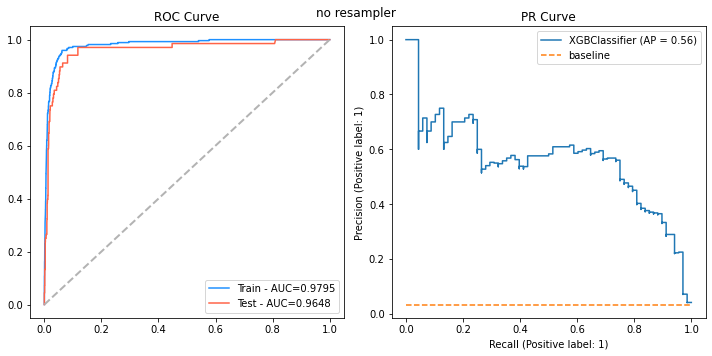

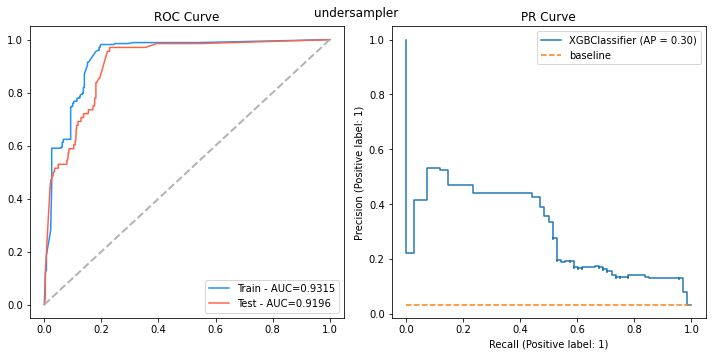

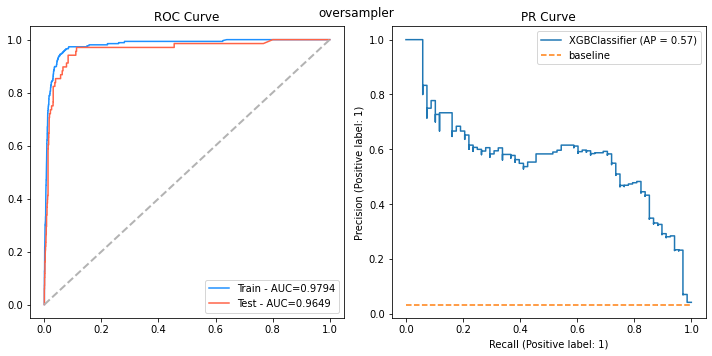

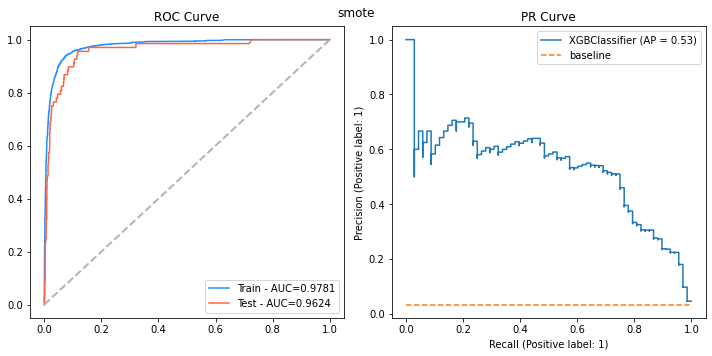

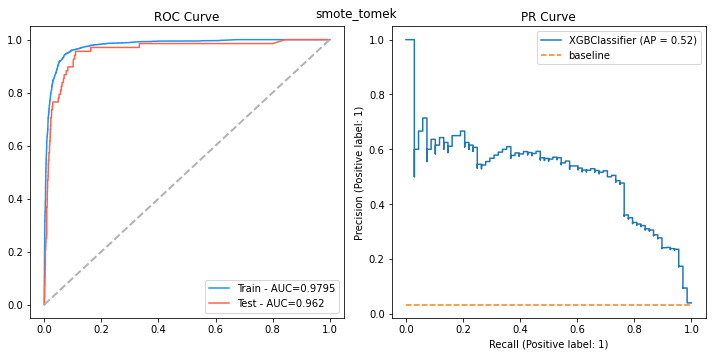

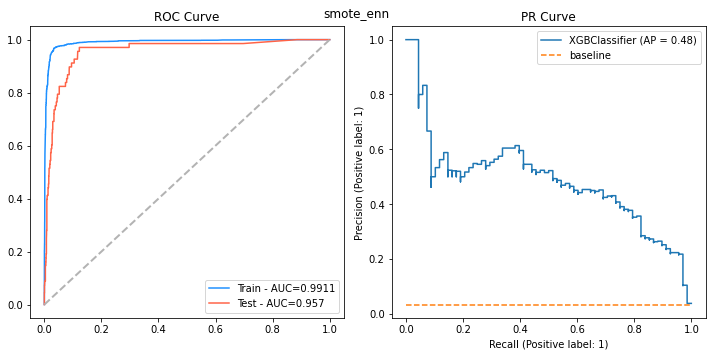

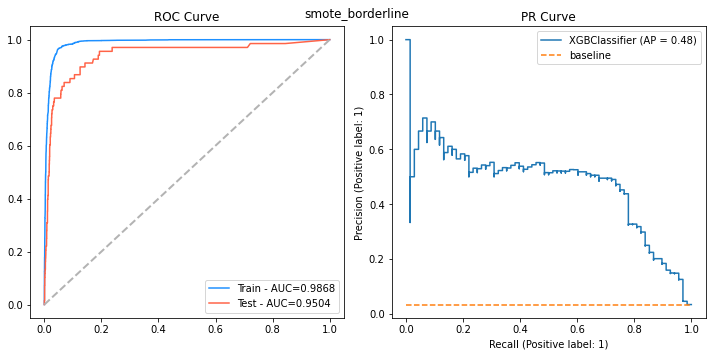

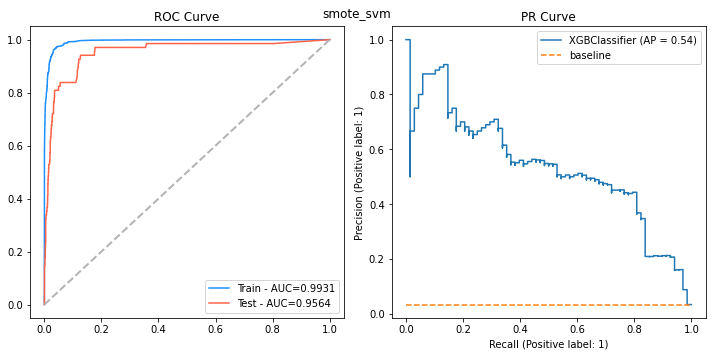

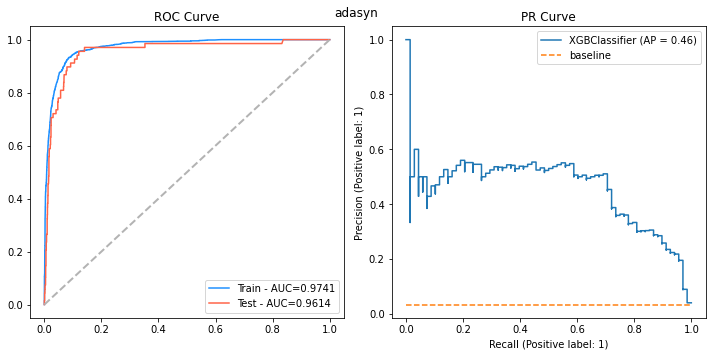

In [161]:
model_name = 'XGBoost'

xgb_params = {'objective':'binary:logistic'
                , 'random_state':random_state, 
              'eval_metric':'auc',
              'colsample_bytree': 0.65, 'learning_rate': 0.03,
              'max_depth': 4, 'reg_alpha': 21, 'reg_lambda':12,'gamma':1,
              'n_estomators':500, }
'''
xgb_params = {'objective':'binary:logistic', 'random_state':random_state, 
              'eval_metric':'auc',
              'max_depth': 4}
fit_params={'early_stopping_rounds': 10, 
        'eval_metric': 'auc',
    'verbose': False, }
'''
def xgb_cross_val_score(X,y,params, cv, resampler=None):    
    train_scores = []
    test_scores = []
    accs, precs, recs, f1s, cfmx = [], [], [], [], []
    for train_fold_index, test_fold_index in cv.split(X, y):
        X_train_fold, y_train_fold = X.iloc[train_fold_index], y[train_fold_index]
        X_test_fold, y_test_fold = X.iloc[test_fold_index], y[test_fold_index]
        X_train_rs, y_train_rs = get_resample(X_train_fold, y_train_fold, resampler)

        scale_pos_weight = (len(y_train_rs) - sum(y_train_rs)) / sum(y_train_rs)
        eval_set=[(X_train_rs, y_train_rs), (X_test_fold, y_test_fold)]

        model = xgb.XGBClassifier(scale_pos_weight=scale_pos_weight, **params)
        model = model.fit(X_train_rs, y_train_rs, eval_set=eval_set,
                          early_stopping_rounds=50, eval_metric='auc', verbose=False)
        
        y_pred = model.predict(X_test_fold)
        acc = accuracy_score(y_test_fold, y_pred)
        prec = precision_score(y_test_fold, y_pred)
        rec = recall_score(y_test_fold, y_pred)     
        f1 = f1_score(y_test_fold, y_pred) 
        cfm = confusion_matrix(y_test_fold, y_pred) 
        
        auc_train = roc_auc_score(y_train_rs, model.predict_proba(X_train_rs)[:,1])
        auc_test = roc_auc_score(y_test_fold, model.predict_proba(X_test_fold)[:,1])
        
        train_scores.append(auc_train)
        test_scores.append(auc_test)
        accs.append(acc)
        precs.append(prec)
        recs.append(rec) 
        f1s.append(f1)
        cfmx.append(cfm)
        
    y_train_score = model.predict_proba(X_train_rs)[:,1]
    fpr_train, tpr_train, _ = roc_curve(y_train_rs, y_train_score)

    y_test_score = model.predict_proba(X_test_fold)[:,1]
    fpr_test, tpr_test, _ = roc_curve(y_test_fold, y_test_score)

    fig, axs = plt.subplots(1,2, figsize=(10,5), tight_layout=True)

    ax = axs[0]
    ax.plot(fpr_train, tpr_train, color='dodgerblue', label=f'Train - AUC={round(np.mean(train_scores),4)}')
    ax.plot(fpr_test, tpr_test, color='tomato', label=f'Test - AUC={round(np.mean(test_scores),4)}')
    ax.plot([0, 1], [0, 1], color='.7', lw=2, linestyle='--')
    ax.set_title('ROC Curve')
    ax.legend(loc=4)

    ax = axs[1]
    plot_precision_recall_curve(model, X_test_fold, y_test_fold, ax=ax)
    baseline = sum(y_test_fold == 1) / len(y_test_fold)
    ax.plot([0,1],[baseline, baseline], linestyle='--', label='baseline')
    ax.set_title('PR Curve')
    ax.legend(loc='upper right')

    plt.suptitle(rs_name)

    return train_scores, test_scores, accs, precs, recs,f1s, cfmx ,model


result_xgb=[]
for rs_name, rs in resamplers:
    train_scores, test_scores,accs, precs, recs,f1s, cfmx,model = xgb_cross_val_score(X_old_sub,y,xgb_params,resampler=rs, cv=kf)
    result_xgb.append((model_name
                   , rs_name
                   , np.mean(accs)
                   , np.std(accs)
                   , np.mean(precs)
                   , np.std(precs)
                   , np.mean(recs)
                   , np.std(recs)
                   , np.mean(f1s)
                   , np.std(f1s)
                   , np.mean(train_scores)
                   , np.std(train_scores)
                   , np.mean(test_scores)
                   , np.std(test_scores)
                   , np.min(test_scores)
                   , np.max(test_scores)                        
                  )
                 )

plt.show()

In [162]:
xgb_result = pd.DataFrame(result_xgb, columns=metric_cols)
display_metrics(xgb_result.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
2,XGBoost,oversampler,90.18%,0.46%,24.85%,1.03%,93.50%,2.05%,39.26%,1.37%,97.94%,0.08%,96.49%,0.86%,95.41%,97.73%
0,XGBoost,no resampler,90.20%,0.57%,24.83%,1.37%,92.90%,3.22%,39.17%,1.87%,97.95%,0.10%,96.48%,0.85%,95.31%,97.65%
3,XGBoost,smote,89.50%,0.64%,23.45%,0.63%,92.31%,3.59%,37.37%,0.61%,97.81%,0.13%,96.24%,0.93%,94.78%,97.45%
4,XGBoost,smote_tomek,89.47%,0.62%,23.59%,0.57%,93.79%,3.46%,37.68%,0.48%,97.95%,0.11%,96.20%,0.98%,94.73%,97.51%
8,XGBoost,adasyn,88.47%,0.41%,22.01%,0.64%,94.38%,3.34%,35.69%,0.98%,97.41%,0.16%,96.14%,0.97%,94.84%,97.57%
5,XGBoost,smote_enn,86.87%,0.94%,20.07%,1.11%,95.86%,2.74%,33.17%,1.48%,99.11%,0.07%,95.70%,1.09%,93.95%,97.33%
7,XGBoost,smote_svm,94.49%,0.31%,36.05%,1.52%,80.51%,4.90%,49.76%,1.97%,99.31%,0.07%,95.64%,1.16%,93.65%,96.88%
6,XGBoost,smote_borderline,90.49%,0.77%,24.44%,0.69%,85.81%,5.89%,37.98%,0.34%,98.68%,0.18%,95.04%,1.41%,92.72%,96.50%
1,XGBoost,undersampler,85.75%,1.82%,16.24%,1.76%,75.80%,2.80%,26.72%,2.52%,93.15%,1.40%,91.96%,1.30%,90.18%,93.51%


#### LightGBM

Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[99]	training's auc: 0.971655	valid_1's auc: 0.943159
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's auc: 0.972182	valid_1's auc: 0.951665
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's auc: 0.972445	valid_1's auc: 0.962177
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's auc: 0.972628	valid_1's auc: 0.950432
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's auc: 0.972418	valid_1's auc: 0.955837
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[32]	training's auc: 0.839249	valid_1's auc: 0.775204
Traini

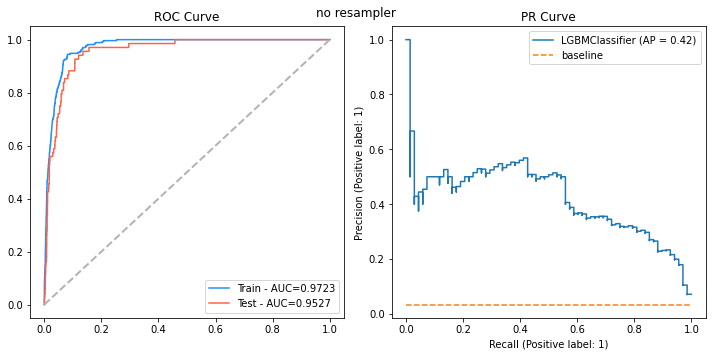

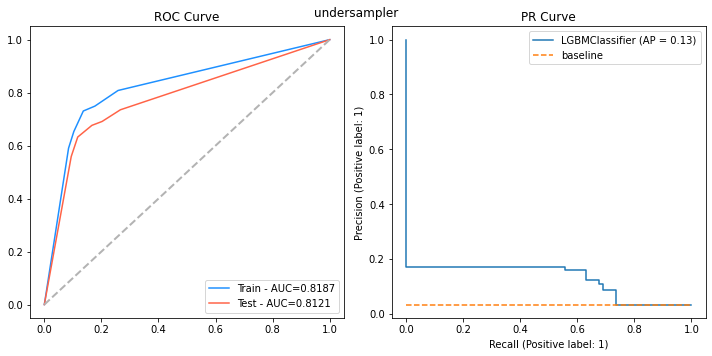

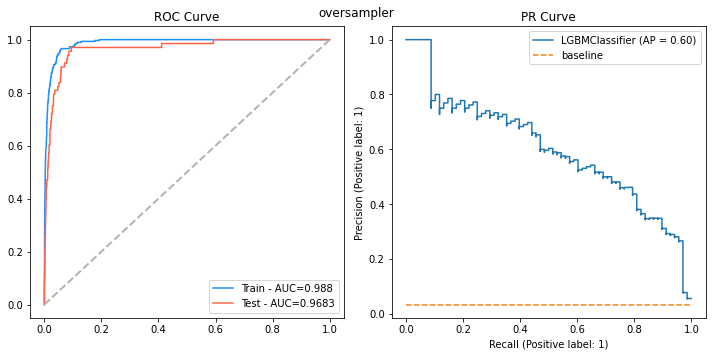

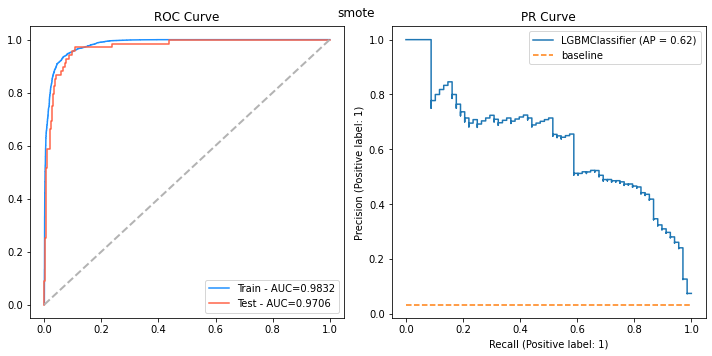

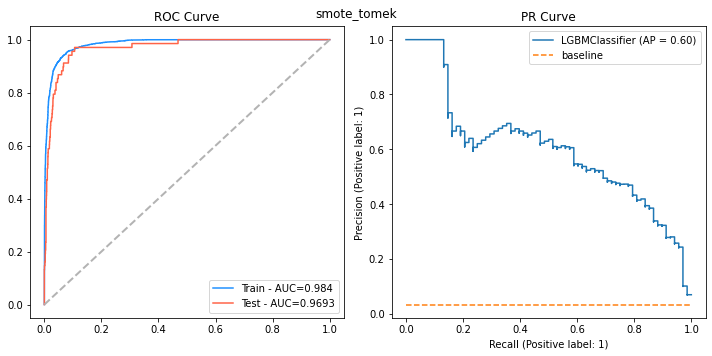

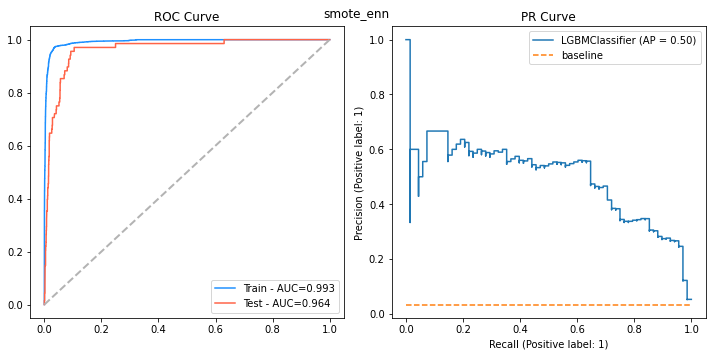

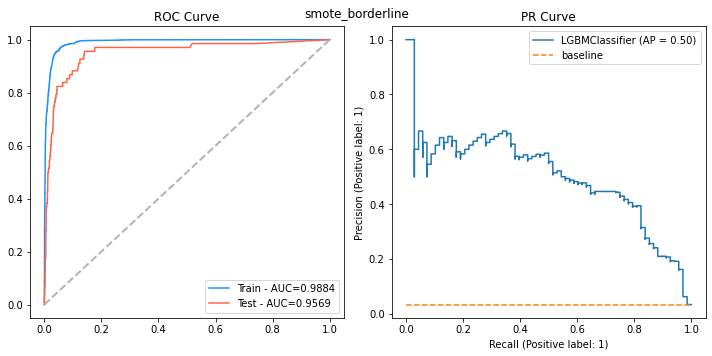

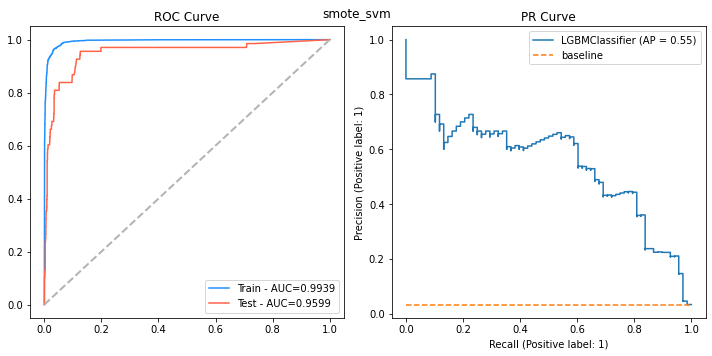

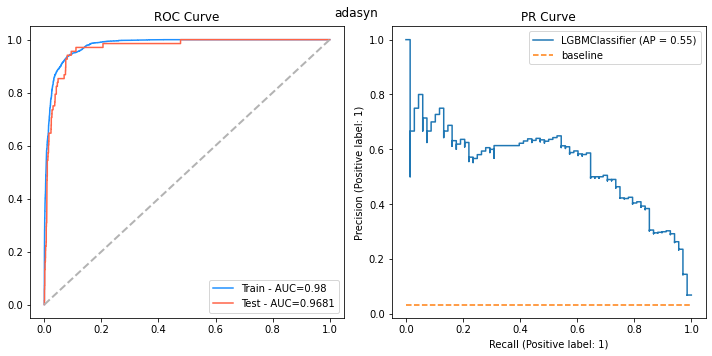

In [163]:
import lightgbm as lgb
model_name = 'LightGBM'

lgb_params = {
    'objective': 'binary', 
    'random_state':  random_state, 
    'is_unbalance': 'true',
    'metric': 'auc',
    'lambda_l1': 0.0010653894836762862, 
    'lambda_l2': 1.5642139864332834, 
    'num_leaves': 111, 
    'feature_fraction': 0.8170433061856316, 
    'bagging_fraction': 0.4759610775176239, 
    'bagging_freq': 6, 
    'min_child_samples': 96, 
    'learning_rate': 0.006499690038601971,
    'verbose': -1,
}
'''

lgb_params = {
                'nthread': 4,
                'is_unbalance': 'true',
                'n_estimators': 500,
                'learning_rate':0.02,
                'num_leaves':32,
                'colsample_bytree':0.9497036,
                'subsample':0.8715623,
                'max_depth':8,
                'reg_alpha':0.04,
                'reg_lambda':0.073,
                'min_split_gain':0.0222415,
                'min_child_weight':40,
                'silent':-1,
                'verbose':-1,
                #scale_pos_weight=11
            }
'''

#lgb_params = {'objective':'binary', 'random_state':random_state, 'max_depth': 4}

def lgb_cross_val_score(X,y,params, cv, resampler=None):    
    train_scores = []
    test_scores = []
    accs, precs, recs, f1s, cfmx = [], [], [], [], []
    for train_fold_index, test_fold_index in cv.split(X, y):
        X_train_fold, y_train_fold = X.iloc[train_fold_index], y[train_fold_index]
        X_test_fold, y_test_fold = X.iloc[test_fold_index], y[test_fold_index]
        X_train_rs, y_train_rs = get_resample(X_train_fold, y_train_fold, resampler)

        model = lgb.LGBMClassifier(**params) #LGBMClassifier(**params)

        model.fit(X_train_rs, y_train_rs, eval_set=[(X_train_rs, y_train_rs), (X_test_fold, y_test_fold)], 
            eval_metric= 'auc', verbose= 1000, early_stopping_rounds= 200)
        
        
        y_pred = model.predict(X_test_fold)
        acc = accuracy_score(y_test_fold, y_pred)
        prec = precision_score(y_test_fold, y_pred)
        rec = recall_score(y_test_fold, y_pred)     
        f1 = f1_score(y_test_fold, y_pred) 
        cfm = confusion_matrix(y_test_fold, y_pred) 
        
        auc_train = roc_auc_score(y_train_rs, model.predict_proba(X_train_rs)[:,1])
        auc_test = roc_auc_score(y_test_fold, model.predict_proba(X_test_fold)[:,1])
        
        train_scores.append(auc_train)
        test_scores.append(auc_test)
        accs.append(acc)
        precs.append(prec)
        recs.append(rec) 
        f1s.append(f1)
        cfmx.append(cfm)

    y_train_score = model.predict_proba(X_train_rs)[:,1]
    fpr_train, tpr_train, _ = roc_curve(y_train_rs, y_train_score)

    y_test_score = model.predict_proba(X_test_fold)[:,1]
    fpr_test, tpr_test, _ = roc_curve(y_test_fold, y_test_score)

    fig, axs = plt.subplots(1,2, figsize=(10,5), tight_layout=True)

    ax = axs[0]
    ax.plot(fpr_train, tpr_train, color='dodgerblue', label=f'Train - AUC={round(np.mean(train_scores),4)}')
    ax.plot(fpr_test, tpr_test, color='tomato', label=f'Test - AUC={round(np.mean(test_scores),4)}')
    ax.plot([0, 1], [0, 1], color='.7', lw=2, linestyle='--')
    ax.set_title('ROC Curve')
    ax.legend(loc=4)

    ax = axs[1]
    plot_precision_recall_curve(model, X_test_fold, y_test_fold, ax=ax)
    baseline = sum(y_test_fold == 1) / len(y_test_fold)
    ax.plot([0,1],[baseline, baseline], linestyle='--', label='baseline')
    ax.set_title('PR Curve')
    ax.legend(loc='upper right')

    plt.suptitle(rs_name)
  
    return train_scores, test_scores, accs, precs, recs,f1s, cfmx ,model        

result_lgb=[]
for rs_name, rs in resamplers:
    train_scores, test_scores,accs, precs, recs,f1s, cfmx,model = lgb_cross_val_score(X_old_sub,y,lgb_params, resampler=rs, cv=kf)
    result_lgb.append((model_name
                   , rs_name
                   , np.mean(accs)
                   , np.std(accs)
                   , np.mean(precs)
                   , np.std(precs)
                   , np.mean(recs)
                   , np.std(recs)
                   , np.mean(f1s)
                   , np.std(f1s)
                   , np.mean(train_scores)
                   , np.std(train_scores)
                   , np.mean(test_scores)
                   , np.std(test_scores)
                   , np.min(test_scores)
                   , np.max(test_scores)                         
                  )
                 ) 

plt.show()

In [164]:
lgb_result = pd.DataFrame(result_lgb, columns=metric_cols)
display_metrics(lgb_result.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
3,LightGBM,smote,90.59%,0.86%,25.72%,1.42%,93.19%,4.40%,40.26%,1.61%,98.32%,0.09%,97.06%,0.61%,96.06%,97.92%
4,LightGBM,smote_tomek,90.19%,0.83%,24.89%,1.25%,93.19%,4.50%,39.24%,1.44%,98.40%,0.09%,96.93%,0.66%,95.96%,97.99%
2,LightGBM,oversampler,92.00%,0.70%,28.91%,1.48%,92.31%,2.93%,43.98%,1.44%,98.80%,0.03%,96.83%,0.86%,95.48%,98.08%
8,LightGBM,adasyn,89.58%,0.75%,23.88%,1.12%,94.37%,4.47%,38.09%,1.51%,98.00%,0.09%,96.81%,0.75%,95.70%,97.99%
5,LightGBM,smote_enn,88.02%,1.29%,21.72%,1.66%,96.15%,2.78%,35.39%,2.15%,99.30%,0.07%,96.40%,0.80%,95.40%,97.72%
7,LightGBM,smote_svm,94.80%,0.33%,37.77%,1.54%,81.98%,6.07%,51.65%,2.01%,99.39%,0.06%,95.99%,1.16%,94.25%,97.09%
6,LightGBM,smote_borderline,91.83%,1.37%,27.73%,2.60%,84.62%,7.56%,41.52%,2.11%,98.84%,0.13%,95.69%,1.14%,93.78%,96.84%
0,LightGBM,no resampler,96.78%,0.16%,83.57%,22.54%,6.77%,4.01%,12.24%,6.96%,97.23%,0.03%,95.27%,0.63%,94.32%,96.22%
1,LightGBM,undersampler,83.16%,2.41%,13.45%,1.65%,71.38%,4.85%,22.56%,2.20%,81.87%,1.80%,81.21%,3.52%,77.52%,86.57%


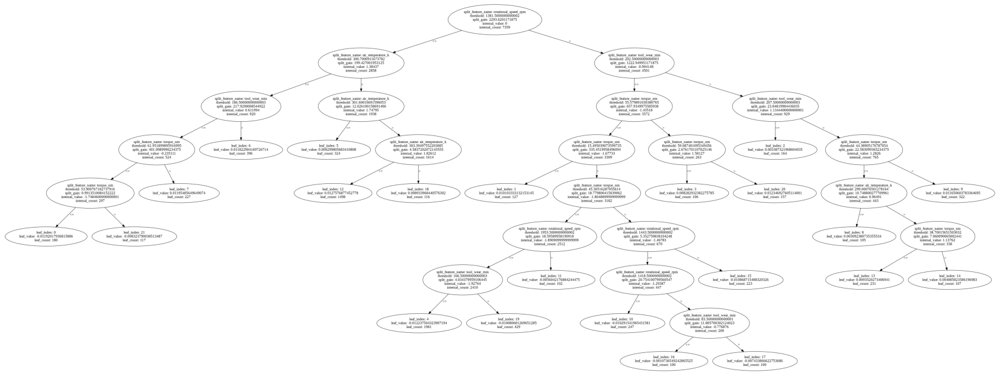

In [165]:
show_info = ['split_gain', 'internal_value', 'internal_weight', 'internal_count', 'leaf_weight', 'leaf_count', 'data_percentage']
lgb.plot_tree(model,figsize=(30,30),show_info=show_info)


In [166]:
graph = lgb.create_tree_digraph(model,show_info=show_info)
graph.render(view=True)

'Digraph.gv.pdf'

In [168]:
#lgb_dataframe_rules.to_excel('lgb_X-none_Fe_Rules.xlsx')

#### Combine Result

In [169]:
summary_old_sub = pd.concat([kNN_result, df_logreg_eval, dct_result, rfc_result, xgb_result,lgb_result]).reset_index(drop=True)
display_metrics(summary_old_sub.sort_values(['auc_test_mean','recall_mean'], ascending=False)) #svm_result

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
48,LightGBM,smote,90.59%,0.86%,25.72%,1.42%,93.19%,4.40%,40.26%,1.61%,98.32%,0.09%,97.06%,0.61%,96.06%,97.92%
49,LightGBM,smote_tomek,90.19%,0.83%,24.89%,1.25%,93.19%,4.50%,39.24%,1.44%,98.40%,0.09%,96.93%,0.66%,95.96%,97.99%
47,LightGBM,oversampler,92.00%,0.70%,28.91%,1.48%,92.31%,2.93%,43.98%,1.44%,98.80%,0.03%,96.83%,0.86%,95.48%,98.08%
53,LightGBM,adasyn,89.58%,0.75%,23.88%,1.12%,94.37%,4.47%,38.09%,1.51%,98.00%,0.09%,96.81%,0.75%,95.70%,97.99%
38,XGBoost,oversampler,90.18%,0.46%,24.85%,1.03%,93.50%,2.05%,39.26%,1.37%,97.94%,0.08%,96.49%,0.86%,95.41%,97.73%
36,XGBoost,no resampler,90.20%,0.57%,24.83%,1.37%,92.90%,3.22%,39.17%,1.87%,97.95%,0.10%,96.48%,0.85%,95.31%,97.65%
50,LightGBM,smote_enn,88.02%,1.29%,21.72%,1.66%,96.15%,2.78%,35.39%,2.15%,99.30%,0.07%,96.40%,0.80%,95.40%,97.72%
39,XGBoost,smote,89.50%,0.64%,23.45%,0.63%,92.31%,3.59%,37.37%,0.61%,97.81%,0.13%,96.24%,0.93%,94.78%,97.45%
40,XGBoost,smote_tomek,89.47%,0.62%,23.59%,0.57%,93.79%,3.46%,37.68%,0.48%,97.95%,0.11%,96.20%,0.98%,94.73%,97.51%
27,RandomForest,no resampler,97.36%,0.20%,89.74%,8.62%,25.07%,5.14%,38.94%,6.35%,97.28%,0.23%,96.15%,1.17%,94.18%,97.42%


In [170]:
#import numpy as np
#import pandas as pd
#import dataframe_image as dfi
#dfi.export(display_metrics(summary_old_sub.sort_values(['auc_test_mean','recall_mean'], ascending=False)), 'summary_old_sub.png')

ModuleNotFoundError: ignored

In [171]:
!pip install optuna

     |████████████████████████████████| 308 kB 4.3 MB/s 
     |████████████████████████████████| 80 kB 6.1 MB/s 
     |████████████████████████████████| 209 kB 10.1 MB/s 
     |████████████████████████████████| 75 kB 3.6 MB/s 
     |████████████████████████████████| 112 kB 14.4 MB/s 
     |████████████████████████████████| 49 kB 4.8 MB/s 
     |████████████████████████████████| 149 kB 10.2 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11136 sha256=d970d830082c111f31a15f29cb82ec206d649073583e9b07ed93ff07102495d5
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip


#### Model Tuning

In [172]:
import optuna
from optuna import Trial, visualization
from optuna.samplers import TPESampler
import joblib

In [173]:
resamplers

[('no resampler', None),
 ('undersampler', RandomUnderSampler(random_state=99)),
 ('oversampler', RandomOverSampler(random_state=99)),
 ('smote', SMOTE(random_state=99)),
 ('smote_tomek', SMOTETomek(random_state=99)),
 ('smote_enn', SMOTEENN(random_state=99)),
 ('smote_borderline', BorderlineSMOTE(random_state=99)),
 ('smote_svm', SVMSMOTE(random_state=99)),
 ('adasyn', ADASYN(random_state=99))]

In [179]:
model_name = 'LightGBM'

def lgb_tune_test_score(X,y,params, cv,rs_name, resampler=None):    
    train_scores = []
    test_scores = []
    for train_fold_index, test_fold_index in cv.split(X, y):
        X_train_fold, y_train_fold = X.iloc[train_fold_index], y[train_fold_index]
        X_test_fold, y_test_fold = X.iloc[test_fold_index], y[test_fold_index]
        X_train_rs, y_train_rs = get_resample(X_train_fold, y_train_fold, resampler)

        model = LGBMClassifier(**params)

        model.fit(X_train_rs, y_train_rs, eval_set=[(X_train_rs, y_train_rs), (X_test_fold, y_test_fold)], 
            eval_metric= 'auc', verbose= 1000, early_stopping_rounds= 200)
        
        
        y_pred = model.predict(X_test_fold)
        acc = accuracy_score(y_test_fold, y_pred)
        prec = precision_score(y_test_fold, y_pred)
        rec = recall_score(y_test_fold, y_pred)     
        f1 = f1_score(y_test_fold, y_pred) 
        cfm = confusion_matrix(y_test_fold, y_pred) 
        
        auc_train = roc_auc_score(y_train_rs, model.predict_proba(X_train_rs)[:,1])
        auc_test = roc_auc_score(y_test_fold, model.predict_proba(X_test_fold)[:,1])
        
        train_scores.append(auc_train)
        test_scores.append(auc_test)

    y_train_score = model.predict_proba(X_train_rs)[:,1]
    fpr_train, tpr_train, _ = roc_curve(y_train_rs, y_train_score)

    y_test_score = model.predict_proba(X_test_fold)[:,1]
    fpr_test, tpr_test, _ = roc_curve(y_test_fold, y_test_score)

    fig, axs = plt.subplots(1,2, figsize=(10,5), tight_layout=True)

    ax = axs[0]
    ax.plot(fpr_train, tpr_train, color='dodgerblue', label=f'Train - AUC={round(np.mean(train_scores),4)}')
    ax.plot(fpr_test, tpr_test, color='tomato', label=f'Test - AUC={round(np.mean(test_scores),4)}')
    ax.plot([0, 1], [0, 1], color='.7', lw=2, linestyle='--')
    ax.set_title('ROC Curve')
    ax.legend(loc=4)

    ax = axs[1]
    plot_precision_recall_curve(model, X_test_fold, y_test_fold, ax=ax)
    baseline = sum(y_test_fold == 1) / len(y_test_fold)
    ax.plot([0,1],[baseline, baseline], linestyle='--', label='baseline')
    ax.set_title('PR Curve')
    ax.legend(loc='upper right')

    plt.suptitle(rs_name)        
    return train_scores, test_scores,accs, precs, recs,f1s, cfmx,model    


[I 2021-12-25 17:15:34,838] A new study created in memory with name: no-name-b7924d35-e789-482f-8e12-527b53ed40ce


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00537314	training's auc: 0.99975	valid_1's binary_logloss: 0.0620778	valid_1's auc: 0.953263
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00478891	training's auc: 0.999998	valid_1's binary_logloss: 0.0462353	valid_1's auc: 0.977857
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00475615	training's auc: 1	valid_1's binary_logloss: 0.0437172	valid_1's auc: 0.987098
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0051451	training's auc: 0.999999	valid_1's binary_logloss: 0.0447782	valid_1's auc: 0.985188
Training until validation scores don't improve fo

[I 2021-12-25 17:15:39,766] Trial 0 finished with value: 0.9760456017167923 and parameters: {'lambda_l1': 0.07689198183909006, 'lambda_l2': 0.0020035214788701136, 'num_leaves': 147, 'feature_fraction': 0.4582534174897342, 'bagging_fraction': 0.8700607800328689, 'bagging_freq': 7, 'min_child_samples': 50}. Best is trial 0 with value: 0.9760456017167923.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00997864	training's auc: 0.999891	valid_1's binary_logloss: 0.0584467	valid_1's auc: 0.952081
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0104347	training's auc: 0.999771	valid_1's binary_logloss: 0.0474574	valid_1's auc: 0.98486
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0115272	training's auc: 0.999298	valid_1's binary_logloss: 0.0429502	valid_1's auc: 0.982562
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0131166	training's auc: 0.999159	valid_1's binary_logloss: 0.0413271	valid_1's auc: 0.984175
Training until validation scores don't impro

[I 2021-12-25 17:15:43,582] Trial 1 finished with value: 0.9747467293974268 and parameters: {'lambda_l1': 0.00016814617094092497, 'lambda_l2': 3.2283130037749626e-07, 'num_leaves': 16, 'feature_fraction': 0.862825207904391, 'bagging_fraction': 0.4292562314653613, 'bagging_freq': 5, 'min_child_samples': 22}. Best is trial 0 with value: 0.9760456017167923.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0267888	training's auc: 0.996933	valid_1's binary_logloss: 0.0621375	valid_1's auc: 0.950259
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0279877	training's auc: 0.996784	valid_1's binary_logloss: 0.0473512	valid_1's auc: 0.975353
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0288496	training's auc: 0.996064	valid_1's binary_logloss: 0.0436906	valid_1's auc: 0.981747
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0292027	training's auc: 0.994556	valid_1's binary_logloss: 0.0487208	valid_1's auc: 0.984548
Training until validation scores don't impro

[I 2021-12-25 17:15:46,805] Trial 2 finished with value: 0.9735191102344058 and parameters: {'lambda_l1': 0.0009762668189467079, 'lambda_l2': 2.7907957332584514, 'num_leaves': 78, 'feature_fraction': 0.889286105670056, 'bagging_fraction': 0.6406097978675502, 'bagging_freq': 7, 'min_child_samples': 81}. Best is trial 0 with value: 0.9760456017167923.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00151709	training's auc: 1	valid_1's binary_logloss: 0.0717191	valid_1's auc: 0.945819
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0016517	training's auc: 1	valid_1's binary_logloss: 0.0570837	valid_1's auc: 0.974029
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00159791	training's auc: 1	valid_1's binary_logloss: 0.0493507	valid_1's auc: 0.985576
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00175956	training's auc: 1	valid_1's binary_logloss: 0.0522222	valid_1's auc: 0.987996
Training until validation scores don't improve for 200 rounds.
Did no

[I 2021-12-25 17:15:50,865] Trial 3 finished with value: 0.9734303875077363 and parameters: {'lambda_l1': 0.011985673095573569, 'lambda_l2': 8.163810906225514e-07, 'num_leaves': 101, 'feature_fraction': 0.7689088893035286, 'bagging_fraction': 0.9999935742960661, 'bagging_freq': 4, 'min_child_samples': 38}. Best is trial 0 with value: 0.9760456017167923.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00848807	training's auc: 0.999998	valid_1's binary_logloss: 0.0716742	valid_1's auc: 0.942885
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00913571	training's auc: 0.999974	valid_1's binary_logloss: 0.0521796	valid_1's auc: 0.970824
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00882321	training's auc: 1	valid_1's binary_logloss: 0.0464263	valid_1's auc: 0.978809
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00925071	training's auc: 0.999997	valid_1's binary_logloss: 0.0494812	valid_1's auc: 0.984457
Training until validation scores don't improve 

[I 2021-12-25 17:15:54,507] Trial 4 finished with value: 0.9685855572159644 and parameters: {'lambda_l1': 5.018790530093468e-07, 'lambda_l2': 2.045054374738484e-05, 'num_leaves': 191, 'feature_fraction': 0.6480646445817615, 'bagging_fraction': 0.8664209094997586, 'bagging_freq': 5, 'min_child_samples': 89}. Best is trial 0 with value: 0.9760456017167923.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0142472	training's auc: 0.999522	valid_1's binary_logloss: 0.0707329	valid_1's auc: 0.948784
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0148418	training's auc: 0.999465	valid_1's binary_logloss: 0.0559501	valid_1's auc: 0.97205
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0149075	training's auc: 0.998831	valid_1's binary_logloss: 0.0494579	valid_1's auc: 0.978855
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0148829	training's auc: 0.999278	valid_1's binary_logloss: 0.0532679	valid_1's auc: 0.982424
Training until validation scores don't improv

[I 2021-12-25 17:15:57,836] Trial 5 finished with value: 0.9710395851136064 and parameters: {'lambda_l1': 0.0005865393993861031, 'lambda_l2': 0.00012390289970138225, 'num_leaves': 138, 'feature_fraction': 0.8825546791914275, 'bagging_fraction': 0.4597468538304543, 'bagging_freq': 5, 'min_child_samples': 55}. Best is trial 0 with value: 0.9760456017167923.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[99]	training's binary_logloss: 0.0423422	training's auc: 0.988694	valid_1's binary_logloss: 0.0530833	valid_1's auc: 0.954185
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0463655	training's auc: 0.981538	valid_1's binary_logloss: 0.0471267	valid_1's auc: 0.981599
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[77]	training's binary_logloss: 0.0485893	training's auc: 0.980525	valid_1's binary_logloss: 0.048125	valid_1's auc: 0.983509
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[90]	training's binary_logloss: 0.0468415	training's auc: 0.980706	valid_1's binary_logloss: 0.0486051	valid_1's auc: 0.986265
Training until validation scores don't improve f

[I 2021-12-25 17:15:59,451] Trial 6 finished with value: 0.9750982762363154 and parameters: {'lambda_l1': 7.525506387456167, 'lambda_l2': 0.0025519605847701015, 'num_leaves': 74, 'feature_fraction': 0.5641261481065762, 'bagging_fraction': 0.43775968236149815, 'bagging_freq': 6, 'min_child_samples': 31}. Best is trial 0 with value: 0.9760456017167923.


Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0447712	training's auc: 0.981552	valid_1's binary_logloss: 0.0570202	valid_1's auc: 0.969934
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0188437	training's auc: 0.999363	valid_1's binary_logloss: 0.0647452	valid_1's auc: 0.949742
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0199069	training's auc: 0.999075	valid_1's binary_logloss: 0.0504005	valid_1's auc: 0.976426
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0181312	training's auc: 0.999445	valid_1's binary_logloss: 0.0483114	valid_1's auc: 0.981199
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration 

[I 2021-12-25 17:16:02,360] Trial 7 finished with value: 0.9709129038930332 and parameters: {'lambda_l1': 6.433633046270417e-05, 'lambda_l2': 8.070920491143925e-08, 'num_leaves': 134, 'feature_fraction': 0.517091222789853, 'bagging_fraction': 0.417991119868865, 'bagging_freq': 4, 'min_child_samples': 58}. Best is trial 0 with value: 0.9760456017167923.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00259057	training's auc: 1	valid_1's binary_logloss: 0.0721496	valid_1's auc: 0.943325
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00258837	training's auc: 1	valid_1's binary_logloss: 0.0511959	valid_1's auc: 0.9782
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.002933	training's auc: 1	valid_1's binary_logloss: 0.0479046	valid_1's auc: 0.980438
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00302051	training's auc: 1	valid_1's binary_logloss: 0.048079	valid_1's auc: 0.987052
Training until validation scores don't improve for 200 rounds.
Did not me

[I 2021-12-25 17:16:07,480] Trial 8 finished with value: 0.9729422446144372 and parameters: {'lambda_l1': 1.0824151301074935e-08, 'lambda_l2': 1.4727718998931002e-08, 'num_leaves': 159, 'feature_fraction': 0.9866743557467813, 'bagging_fraction': 0.9931342662103246, 'bagging_freq': 6, 'min_child_samples': 58}. Best is trial 0 with value: 0.9760456017167923.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00282014	training's auc: 0.999893	valid_1's binary_logloss: 0.0733233	valid_1's auc: 0.948437
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00299485	training's auc: 0.999949	valid_1's binary_logloss: 0.0564066	valid_1's auc: 0.969705
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00293521	training's auc: 0.999899	valid_1's binary_logloss: 0.0470748	valid_1's auc: 0.985089
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00486652	training's auc: 0.999333	valid_1's binary_logloss: 0.054464	valid_1's auc: 0.982463
Training until validation scores don't im

[I 2021-12-25 17:16:11,345] Trial 9 finished with value: 0.9696060690765 and parameters: {'lambda_l1': 0.00047159874547795654, 'lambda_l2': 0.002963549398727263, 'num_leaves': 93, 'feature_fraction': 0.9083198741829294, 'bagging_fraction': 0.5613883267275631, 'bagging_freq': 7, 'min_child_samples': 14}. Best is trial 0 with value: 0.9760456017167923.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0280069	training's auc: 0.996797	valid_1's binary_logloss: 0.0569517	valid_1's auc: 0.9549
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0295824	training's auc: 0.996125	valid_1's binary_logloss: 0.0457402	valid_1's auc: 0.979631
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0298659	training's auc: 0.995901	valid_1's binary_logloss: 0.0422123	valid_1's auc: 0.983954
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0291114	training's auc: 0.996496	valid_1's binary_logloss: 0.0461942	valid_1's auc: 0.986664
Training until validation scores don't improve

[I 2021-12-25 17:16:13,524] Trial 10 finished with value: 0.9766317862072565 and parameters: {'lambda_l1': 1.5887707700290719, 'lambda_l2': 0.8960458369090398, 'num_leaves': 247, 'feature_fraction': 0.41372146199428267, 'bagging_fraction': 0.8000283736181434, 'bagging_freq': 1, 'min_child_samples': 76}. Best is trial 10 with value: 0.9766317862072565.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0295885	training's auc: 0.995885	valid_1's binary_logloss: 0.0564801	valid_1's auc: 0.956035
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0314658	training's auc: 0.994746	valid_1's binary_logloss: 0.0444457	valid_1's auc: 0.978855
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.031792	training's auc: 0.994385	valid_1's binary_logloss: 0.0421168	valid_1's auc: 0.983916
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.031189	training's auc: 0.995128	valid_1's binary_logloss: 0.0455377	valid_1's auc: 0.987441
Training until validation scores don't improve

[I 2021-12-25 17:16:15,609] Trial 11 finished with value: 0.9770643109411769 and parameters: {'lambda_l1': 2.108214223719104, 'lambda_l2': 0.6741466962140685, 'num_leaves': 256, 'feature_fraction': 0.41566610334048476, 'bagging_fraction': 0.8034587502089072, 'bagging_freq': 1, 'min_child_samples': 73}. Best is trial 11 with value: 0.9770643109411769.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.046187	training's auc: 0.986663	valid_1's binary_logloss: 0.0593517	valid_1's auc: 0.949711
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0496475	training's auc: 0.980764	valid_1's binary_logloss: 0.049445	valid_1's auc: 0.982554
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.049634	training's auc: 0.979516	valid_1's binary_logloss: 0.0507476	valid_1's auc: 0.978923
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0494554	training's auc: 0.978408	valid_1's binary_logloss: 0.0524375	valid_1's auc: 0.98413
Training until validation scores don't improve f

[I 2021-12-25 17:16:17,321] Trial 12 finished with value: 0.9737611294421671 and parameters: {'lambda_l1': 7.954571385536553, 'lambda_l2': 5.172300264855726, 'num_leaves': 253, 'feature_fraction': 0.40129833841730655, 'bagging_fraction': 0.7812630281818707, 'bagging_freq': 1, 'min_child_samples': 79}. Best is trial 11 with value: 0.9770643109411769.


Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0471928	training's auc: 0.981412	valid_1's binary_logloss: 0.0588876	valid_1's auc: 0.973488
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0178157	training's auc: 0.999701	valid_1's binary_logloss: 0.0649964	valid_1's auc: 0.948321
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0172889	training's auc: 0.999846	valid_1's binary_logloss: 0.0496085	valid_1's auc: 0.976244
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0178982	training's auc: 0.999773	valid_1's binary_logloss: 0.046849	valid_1's auc: 0.982988
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration i

[I 2021-12-25 17:16:19,932] Trial 13 finished with value: 0.9724860227897839 and parameters: {'lambda_l1': 0.25478046051112535, 'lambda_l2': 0.13681345877788442, 'num_leaves': 247, 'feature_fraction': 0.607051920935184, 'bagging_fraction': 0.7507342687567805, 'bagging_freq': 1, 'min_child_samples': 98}. Best is trial 11 with value: 0.9770643109411769.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0130619	training's auc: 0.999931	valid_1's binary_logloss: 0.0617064	valid_1's auc: 0.949765
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.013008	training's auc: 0.999953	valid_1's binary_logloss: 0.0466113	valid_1's auc: 0.97941
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0134618	training's auc: 0.999906	valid_1's binary_logloss: 0.0428914	valid_1's auc: 0.985736
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0136269	training's auc: 0.999949	valid_1's binary_logloss: 0.046765	valid_1's auc: 0.984381
Training until validation scores don't improve 

[I 2021-12-25 17:16:22,756] Trial 14 finished with value: 0.9751862006914799 and parameters: {'lambda_l1': 0.39582162219391, 'lambda_l2': 0.1717139023881466, 'num_leaves': 211, 'feature_fraction': 0.40449238605831495, 'bagging_fraction': 0.8640595176015932, 'bagging_freq': 2, 'min_child_samples': 71}. Best is trial 11 with value: 0.9770643109411769.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0116153	training's auc: 0.999969	valid_1's binary_logloss: 0.0655855	valid_1's auc: 0.949255
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0110707	training's auc: 0.999986	valid_1's binary_logloss: 0.0488933	valid_1's auc: 0.978748
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0118499	training's auc: 0.999988	valid_1's binary_logloss: 0.0454743	valid_1's auc: 0.983201
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0114918	training's auc: 0.99998	valid_1's binary_logloss: 0.0478741	valid_1's auc: 0.98569
Training until validation scores don't improve

[I 2021-12-25 17:16:25,686] Trial 15 finished with value: 0.9736913303632619 and parameters: {'lambda_l1': 0.012834311034903512, 'lambda_l2': 0.16587513940649354, 'num_leaves': 211, 'feature_fraction': 0.506703361556581, 'bagging_fraction': 0.6989194617846024, 'bagging_freq': 2, 'min_child_samples': 70}. Best is trial 11 with value: 0.9770643109411769.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0110687	training's auc: 0.999995	valid_1's binary_logloss: 0.0677015	valid_1's auc: 0.948707
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0111243	training's auc: 0.999986	valid_1's binary_logloss: 0.0501753	valid_1's auc: 0.97683
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0113921	training's auc: 0.999977	valid_1's binary_logloss: 0.0454997	valid_1's auc: 0.98024
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0107228	training's auc: 0.999996	valid_1's binary_logloss: 0.0495339	valid_1's auc: 0.983338
Training until validation scores don't improve

[I 2021-12-25 17:16:28,893] Trial 16 finished with value: 0.9722663784347425 and parameters: {'lambda_l1': 6.681831077787632e-06, 'lambda_l2': 0.028130776703526646, 'num_leaves': 226, 'feature_fraction': 0.710946733818975, 'bagging_fraction': 0.80046410935008, 'bagging_freq': 2, 'min_child_samples': 96}. Best is trial 11 with value: 0.9770643109411769.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0292189	training's auc: 0.99624	valid_1's binary_logloss: 0.0576967	valid_1's auc: 0.955957
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0300541	training's auc: 0.995764	valid_1's binary_logloss: 0.0448813	valid_1's auc: 0.980955
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0308325	training's auc: 0.995481	valid_1's binary_logloss: 0.0428036	valid_1's auc: 0.983437
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0298218	training's auc: 0.995771	valid_1's binary_logloss: 0.0466444	valid_1's auc: 0.985644
Training until validation scores don't improv

[I 2021-12-25 17:16:31,228] Trial 17 finished with value: 0.9755919811348013 and parameters: {'lambda_l1': 1.1585125218268078, 'lambda_l2': 1.2429669431572412, 'num_leaves': 183, 'feature_fraction': 0.48391252071126156, 'bagging_fraction': 0.6263433981760322, 'bagging_freq': 3, 'min_child_samples': 67}. Best is trial 11 with value: 0.9770643109411769.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0239182	training's auc: 0.997048	valid_1's binary_logloss: 0.0504618	valid_1's auc: 0.959007
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0253806	training's auc: 0.99607	valid_1's binary_logloss: 0.0387894	valid_1's auc: 0.980621
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0252842	training's auc: 0.99616	valid_1's binary_logloss: 0.0351692	valid_1's auc: 0.986961
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0264207	training's auc: 0.995932	valid_1's binary_logloss: 0.0363928	valid_1's auc: 0.991635
Training until validation scores don't improve

[I 2021-12-25 17:16:33,641] Trial 18 finished with value: 0.9795968041266374 and parameters: {'lambda_l1': 0.012400846868380366, 'lambda_l2': 9.876379112160599, 'num_leaves': 254, 'feature_fraction': 0.5666856502558775, 'bagging_fraction': 0.9208420859628536, 'bagging_freq': 1, 'min_child_samples': 43}. Best is trial 18 with value: 0.9795968041266374.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0237568	training's auc: 0.997059	valid_1's binary_logloss: 0.0508465	valid_1's auc: 0.959007
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.02533	training's auc: 0.9954	valid_1's binary_logloss: 0.0385482	valid_1's auc: 0.983581
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0254251	training's auc: 0.995957	valid_1's binary_logloss: 0.035705	valid_1's auc: 0.986017
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.026269	training's auc: 0.995679	valid_1's binary_logloss: 0.0366544	valid_1's auc: 0.991642
Training until validation scores don't improve for

[I 2021-12-25 17:16:36,194] Trial 19 finished with value: 0.9802026986583631 and parameters: {'lambda_l1': 0.009489095218249952, 'lambda_l2': 9.820156889887938, 'num_leaves': 181, 'feature_fraction': 0.5774022663238527, 'bagging_fraction': 0.9122570706139099, 'bagging_freq': 3, 'min_child_samples': 41}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0226047	training's auc: 0.997409	valid_1's binary_logloss: 0.0505917	valid_1's auc: 0.95944
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0239773	training's auc: 0.996246	valid_1's binary_logloss: 0.0395723	valid_1's auc: 0.980719
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0239912	training's auc: 0.99664	valid_1's binary_logloss: 0.034875	valid_1's auc: 0.987037
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0248668	training's auc: 0.996373	valid_1's binary_logloss: 0.0371083	valid_1's auc: 0.989922
Training until validation scores don't improve 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:16:38,837] Trial 20 finished with value: 0.979193087188974 and parameters: {'lambda_l1': 0.006288309034498889, 'lambda_l2': 9.86206375657276, 'num_leaves': 181, 'feature_fraction': 0.7002530466193682, 'bagging_fraction': 0.9424573000800789, 'bagging_freq': 3, 'min_child_samples': 42}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0183034	training's auc: 0.998642	valid_1's binary_logloss: 0.0519337	valid_1's auc: 0.956807
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0197095	training's auc: 0.997876	valid_1's binary_logloss: 0.0394763	valid_1's auc: 0.980301
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0193112	training's auc: 0.998371	valid_1's binary_logloss: 0.0350606	valid_1's auc: 0.986238
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0201721	training's auc: 0.998174	valid_1's binary_logloss: 0.0381118	valid_1's auc: 0.989701
Training until validation scores don't impro

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:16:41,633] Trial 21 finished with value: 0.9788446057166624 and parameters: {'lambda_l1': 0.009011744680642175, 'lambda_l2': 5.720625550852713, 'num_leaves': 180, 'feature_fraction': 0.6892225863898135, 'bagging_fraction': 0.9322396544794431, 'bagging_freq': 3, 'min_child_samples': 42}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00126156	training's auc: 1	valid_1's binary_logloss: 0.0659972	valid_1's auc: 0.949958
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00127193	training's auc: 1	valid_1's binary_logloss: 0.0500547	valid_1's auc: 0.979068
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00120532	training's auc: 1	valid_1's binary_logloss: 0.0484679	valid_1's auc: 0.97903
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00121652	training's auc: 1	valid_1's binary_logloss: 0.0486211	valid_1's auc: 0.988826
Training until validation scores don't improve for 200 rounds.
Did no

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:16:45,475] Trial 22 finished with value: 0.9740130183872997 and parameters: {'lambda_l1': 0.0041599814898999835, 'lambda_l2': 0.01895434728359762, 'num_leaves': 165, 'feature_fraction': 0.5781524171767715, 'bagging_fraction': 0.9176103482380817, 'bagging_freq': 3, 'min_child_samples': 29}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0215891	training's auc: 0.997741	valid_1's binary_logloss: 0.0505974	valid_1's auc: 0.957355
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0228166	training's auc: 0.996705	valid_1's binary_logloss: 0.039085	valid_1's auc: 0.980567
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0227422	training's auc: 0.997268	valid_1's binary_logloss: 0.034382	valid_1's auc: 0.987151
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0236054	training's auc: 0.996943	valid_1's binary_logloss: 0.0365884	valid_1's auc: 0.990287
Training until validation scores don't improve

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:16:48,215] Trial 23 finished with value: 0.9787959247137483 and parameters: {'lambda_l1': 0.08792317196711018, 'lambda_l2': 8.217193865767872, 'num_leaves': 221, 'feature_fraction': 0.7713042631375225, 'bagging_fraction': 0.9299379259783384, 'bagging_freq': 3, 'min_child_samples': 45}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000255028	training's auc: 1	valid_1's binary_logloss: 0.0674988	valid_1's auc: 0.95161
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000241864	training's auc: 1	valid_1's binary_logloss: 0.0584565	valid_1's auc: 0.98056
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000248216	training's auc: 1	valid_1's binary_logloss: 0.0528754	valid_1's auc: 0.981899
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000256981	training's auc: 1	valid_1's binary_logloss: 0.0530784	valid_1's auc: 0.990653
Training until validation scores don't improve for 200 rounds.
Did

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:16:54,811] Trial 24 finished with value: 0.9758125581338873 and parameters: {'lambda_l1': 1.3709887848999861e-05, 'lambda_l2': 0.035567393813767646, 'num_leaves': 111, 'feature_fraction': 0.6394620735036819, 'bagging_fraction': 0.9614643094536884, 'bagging_freq': 2, 'min_child_samples': 7}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0225091	training's auc: 0.997465	valid_1's binary_logloss: 0.0506666	valid_1's auc: 0.959115
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0242763	training's auc: 0.996156	valid_1's binary_logloss: 0.0384714	valid_1's auc: 0.981405
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0243089	training's auc: 0.99647	valid_1's binary_logloss: 0.0356274	valid_1's auc: 0.9855
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0249873	training's auc: 0.996354	valid_1's binary_logloss: 0.0373177	valid_1's auc: 0.991132
Training until validation scores don't improve 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:16:57,450] Trial 25 finished with value: 0.97993050526611 and parameters: {'lambda_l1': 0.002218216996426941, 'lambda_l2': 9.021333536433911, 'num_leaves': 191, 'feature_fraction': 0.55006801503453, 'bagging_fraction': 0.8961415941750586, 'bagging_freq': 4, 'min_child_samples': 33}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00418881	training's auc: 1	valid_1's binary_logloss: 0.0562825	valid_1's auc: 0.951633
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00452613	training's auc: 0.999998	valid_1's binary_logloss: 0.046398	valid_1's auc: 0.977127
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0045804	training's auc: 0.999999	valid_1's binary_logloss: 0.0397807	valid_1's auc: 0.982386
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00451976	training's auc: 1	valid_1's binary_logloss: 0.0421749	valid_1's auc: 0.989899
Training until validation scores don't improve for 200 r

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:17:00,802] Trial 26 finished with value: 0.9749661983740585 and parameters: {'lambda_l1': 0.0018344535808860838, 'lambda_l2': 0.5500137802339065, 'num_leaves': 203, 'feature_fraction': 0.5438558335152968, 'bagging_fraction': 0.8898630943710939, 'bagging_freq': 4, 'min_child_samples': 30}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00151862	training's auc: 1	valid_1's binary_logloss: 0.0621551	valid_1's auc: 0.950661
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00161879	training's auc: 1	valid_1's binary_logloss: 0.0489145	valid_1's auc: 0.981899
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00152904	training's auc: 1	valid_1's binary_logloss: 0.0457935	valid_1's auc: 0.981268
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00144509	training's auc: 1	valid_1's binary_logloss: 0.0460879	valid_1's auc: 0.98827
Training until validation scores don't improve for 200 rounds.
Did no

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:17:05,602] Trial 27 finished with value: 0.974436703732005 and parameters: {'lambda_l1': 0.05584744419001343, 'lambda_l2': 7.494665503270957e-06, 'num_leaves': 161, 'feature_fraction': 0.6107683624411202, 'bagging_fraction': 0.8452155449889974, 'bagging_freq': 4, 'min_child_samples': 21}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0121612	training's auc: 0.999769	valid_1's binary_logloss: 0.0537634	valid_1's auc: 0.956683
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0120137	training's auc: 0.999841	valid_1's binary_logloss: 0.0402624	valid_1's auc: 0.980301
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0125754	training's auc: 0.999753	valid_1's binary_logloss: 0.0366638	valid_1's auc: 0.986778
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0129372	training's auc: 0.999841	valid_1's binary_logloss: 0.0394706	valid_1's auc: 0.988316
Training until validation scores don't impro

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:17:09,929] Trial 28 finished with value: 0.9782459721684656 and parameters: {'lambda_l1': 2.944698230942373e-05, 'lambda_l2': 1.6564363930193013, 'num_leaves': 232, 'feature_fraction': 0.4725826676118103, 'bagging_fraction': 0.7292230984614085, 'bagging_freq': 2, 'min_child_samples': 34}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00397424	training's auc: 1	valid_1's binary_logloss: 0.066482	valid_1's auc: 0.949564
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00410588	training's auc: 0.999972	valid_1's binary_logloss: 0.0492132	valid_1's auc: 0.976777
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00399714	training's auc: 1	valid_1's binary_logloss: 0.0448918	valid_1's auc: 0.985287
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00395873	training's auc: 1	valid_1's binary_logloss: 0.0465052	valid_1's auc: 0.986855
Training until validation scores don't improve for 200 rounds.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:17:15,252] Trial 29 finished with value: 0.9749055186668307 and parameters: {'lambda_l1': 0.031171096593558673, 'lambda_l2': 0.0009275573592435161, 'num_leaves': 117, 'feature_fraction': 0.5354858980435515, 'bagging_fraction': 0.8343547601090759, 'bagging_freq': 4, 'min_child_samples': 49}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000937816	training's auc: 1	valid_1's binary_logloss: 0.0680841	valid_1's auc: 0.951788
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000850693	training's auc: 1	valid_1's binary_logloss: 0.0520006	valid_1's auc: 0.98027
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000763467	training's auc: 1	valid_1's binary_logloss: 0.0486972	valid_1's auc: 0.978756
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000795591	training's auc: 1	valid_1's binary_logloss: 0.0501361	valid_1's auc: 0.990683
Training until validation scores don't improve for 200 rounds.
Di

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:17:19,109] Trial 30 finished with value: 0.9747687315710263 and parameters: {'lambda_l1': 1.924522173911795e-06, 'lambda_l2': 0.008734766437472879, 'num_leaves': 196, 'feature_fraction': 0.5913255147846757, 'bagging_fraction': 0.9117357240579549, 'bagging_freq': 5, 'min_child_samples': 24}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.018833	training's auc: 0.998473	valid_1's binary_logloss: 0.0511862	valid_1's auc: 0.957494
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0199536	training's auc: 0.997929	valid_1's binary_logloss: 0.0394495	valid_1's auc: 0.980765
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0197835	training's auc: 0.998247	valid_1's binary_logloss: 0.0349165	valid_1's auc: 0.985751
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.020373	training's auc: 0.998233	valid_1's binary_logloss: 0.0375211	valid_1's auc: 0.990006
Training until validation scores don't improve

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:17:21,862] Trial 31 finished with value: 0.9789089730723248 and parameters: {'lambda_l1': 0.0016220450677171712, 'lambda_l2': 6.485696803452405, 'num_leaves': 174, 'feature_fraction': 0.7000566476457313, 'bagging_fraction': 0.9404136608695438, 'bagging_freq': 3, 'min_child_samples': 40}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0217549	training's auc: 0.997587	valid_1's binary_logloss: 0.0514483	valid_1's auc: 0.957733
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0225875	training's auc: 0.996934	valid_1's binary_logloss: 0.0392763	valid_1's auc: 0.98091
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0231699	training's auc: 0.996851	valid_1's binary_logloss: 0.035309	valid_1's auc: 0.986055
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0239966	training's auc: 0.996885	valid_1's binary_logloss: 0.0371147	valid_1's auc: 0.989869
Training until validation scores don't improve

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:17:24,546] Trial 32 finished with value: 0.9786675993205854 and parameters: {'lambda_l1': 0.0001628986484943904, 'lambda_l2': 8.815508293751561, 'num_leaves': 149, 'feature_fraction': 0.7656392894668446, 'bagging_fraction': 0.9648491954857908, 'bagging_freq': 3, 'min_child_samples': 48}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00481421	training's auc: 1	valid_1's binary_logloss: 0.0612509	valid_1's auc: 0.946707
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00499215	training's auc: 0.999986	valid_1's binary_logloss: 0.0459496	valid_1's auc: 0.978885
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00506277	training's auc: 0.999999	valid_1's binary_logloss: 0.039612	valid_1's auc: 0.98263
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00543009	training's auc: 1	valid_1's binary_logloss: 0.0437237	valid_1's auc: 0.985332
Training until validation scores don't improve for 200 r

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:17:27,676] Trial 33 finished with value: 0.9731223495661624 and parameters: {'lambda_l1': 0.002933122163393452, 'lambda_l2': 0.3161157802396214, 'num_leaves': 34, 'feature_fraction': 0.6703950756908442, 'bagging_fraction': 0.8965315793719912, 'bagging_freq': 4, 'min_child_samples': 37}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0138798	training's auc: 0.999775	valid_1's binary_logloss: 0.0582416	valid_1's auc: 0.953896
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.014111	training's auc: 0.999777	valid_1's binary_logloss: 0.0432873	valid_1's auc: 0.978641
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0145597	training's auc: 0.999714	valid_1's binary_logloss: 0.0398669	valid_1's auc: 0.986109
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0146509	training's auc: 0.999812	valid_1's binary_logloss: 0.0443504	valid_1's auc: 0.986162
Training until validation scores don't improv

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:17:30,663] Trial 34 finished with value: 0.97649953672218 and parameters: {'lambda_l1': 0.1741859852559053, 'lambda_l2': 2.0102474420439815, 'num_leaves': 239, 'feature_fraction': 0.7479874146068973, 'bagging_fraction': 0.9634725646316664, 'bagging_freq': 2, 'min_child_samples': 61}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00125224	training's auc: 1	valid_1's binary_logloss: 0.0647898	valid_1's auc: 0.947726
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00122938	training's auc: 1	valid_1's binary_logloss: 0.0522035	valid_1's auc: 0.979867
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00125391	training's auc: 1	valid_1's binary_logloss: 0.0463415	valid_1's auc: 0.976396
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00122906	training's auc: 1	valid_1's binary_logloss: 0.0463459	valid_1's auc: 0.990744
Training until validation scores don't improve for 200 rounds.
Did n

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:17:34,534] Trial 35 finished with value: 0.9731435114867558 and parameters: {'lambda_l1': 0.02145192480445943, 'lambda_l2': 0.06619607184794984, 'num_leaves': 148, 'feature_fraction': 0.631677746344145, 'bagging_fraction': 0.9991210293978025, 'bagging_freq': 3, 'min_child_samples': 24}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0156855	training's auc: 0.999472	valid_1's binary_logloss: 0.0557036	valid_1's auc: 0.956127
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0180175	training's auc: 0.997414	valid_1's binary_logloss: 0.0416243	valid_1's auc: 0.979593
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0163615	training's auc: 0.999395	valid_1's binary_logloss: 0.0375412	valid_1's auc: 0.985522
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0168784	training's auc: 0.999376	valid_1's binary_logloss: 0.0388992	valid_1's auc: 0.989168
Training until validation scores don't impro

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:17:37,375] Trial 36 finished with value: 0.9785442963325034 and parameters: {'lambda_l1': 0.0001556659364193754, 'lambda_l2': 2.8690751743287555, 'num_leaves': 190, 'feature_fraction': 0.7249856812352169, 'bagging_fraction': 0.8367998420345507, 'bagging_freq': 6, 'min_child_samples': 53}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00291094	training's auc: 1	valid_1's binary_logloss: 0.0675718	valid_1's auc: 0.948089
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00280395	training's auc: 1	valid_1's binary_logloss: 0.0481627	valid_1's auc: 0.982813
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00281896	training's auc: 1	valid_1's binary_logloss: 0.0492944	valid_1's auc: 0.982189
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0030798	training's auc: 1	valid_1's binary_logloss: 0.0486426	valid_1's auc: 0.985599
Training until validation scores don't improve for 200 rounds.
Did no

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:17:40,987] Trial 37 finished with value: 0.9742147525278849 and parameters: {'lambda_l1': 0.0043168129624726785, 'lambda_l2': 0.0001730125634759156, 'num_leaves': 214, 'feature_fraction': 0.45698250273634966, 'bagging_fraction': 0.8871060732702342, 'bagging_freq': 5, 'min_child_samples': 44}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0225965	training's auc: 0.99737	valid_1's binary_logloss: 0.0501058	valid_1's auc: 0.956367
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0243644	training's auc: 0.996353	valid_1's binary_logloss: 0.0378513	valid_1's auc: 0.983338
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0243548	training's auc: 0.996731	valid_1's binary_logloss: 0.0354408	valid_1's auc: 0.987387
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0256906	training's auc: 0.996034	valid_1's binary_logloss: 0.0372221	valid_1's auc: 0.989709
Training until validation scores don't improv

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:17:43,600] Trial 38 finished with value: 0.979430982500384 and parameters: {'lambda_l1': 0.000777505997770844, 'lambda_l2': 9.988991416327051, 'num_leaves': 128, 'feature_fraction': 0.8406086045137192, 'bagging_fraction': 0.8664805172348521, 'bagging_freq': 5, 'min_child_samples': 34}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00268054	training's auc: 1	valid_1's binary_logloss: 0.0592972	valid_1's auc: 0.942947
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00266391	training's auc: 1	valid_1's binary_logloss: 0.0463018	valid_1's auc: 0.981207
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00257177	training's auc: 1	valid_1's binary_logloss: 0.0406119	valid_1's auc: 0.981214
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00264005	training's auc: 1	valid_1's binary_logloss: 0.04396	valid_1's auc: 0.989267
Training until validation scores don't improve for 200 rounds.
Did not

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:17:47,103] Trial 39 finished with value: 0.9726907441642192 and parameters: {'lambda_l1': 0.0007761541279924065, 'lambda_l2': 0.39508165098644515, 'num_leaves': 46, 'feature_fraction': 0.8417098982143072, 'bagging_fraction': 0.8696238791011085, 'bagging_freq': 5, 'min_child_samples': 18}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0102473	training's auc: 0.999876	valid_1's binary_logloss: 0.0563905	valid_1's auc: 0.953178
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0112872	training's auc: 0.999271	valid_1's binary_logloss: 0.0403	valid_1's auc: 0.98397
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0115024	training's auc: 0.999727	valid_1's binary_logloss: 0.0382157	valid_1's auc: 0.984533
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0111273	training's auc: 0.999878	valid_1's binary_logloss: 0.0397035	valid_1's auc: 0.987562
Training until validation scores don't improve f

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:17:50,148] Trial 40 finished with value: 0.9775677086411418 and parameters: {'lambda_l1': 7.773314163431762e-05, 'lambda_l2': 1.2104482805169863, 'num_leaves': 121, 'feature_fraction': 0.939375834374237, 'bagging_fraction': 0.6744759685100372, 'bagging_freq': 6, 'min_child_samples': 34}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0117235	training's auc: 0.99977	valid_1's binary_logloss: 0.0563901	valid_1's auc: 0.950151
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0117522	training's auc: 0.99977	valid_1's binary_logloss: 0.0409052	valid_1's auc: 0.979349
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0117963	training's auc: 0.999836	valid_1's binary_logloss: 0.0372871	valid_1's auc: 0.984411
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0127318	training's auc: 0.99981	valid_1's binary_logloss: 0.0389059	valid_1's auc: 0.988826
Training until validation scores don't improve 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:17:54,381] Trial 41 finished with value: 0.9759850071950427 and parameters: {'lambda_l1': 0.00036647237744481337, 'lambda_l2': 2.916317835558724, 'num_leaves': 133, 'feature_fraction': 0.8053861548180626, 'bagging_fraction': 0.9504896949598903, 'bagging_freq': 5, 'min_child_samples': 37}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0182254	training's auc: 0.998564	valid_1's binary_logloss: 0.047401	valid_1's auc: 0.959007
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0196589	training's auc: 0.997778	valid_1's binary_logloss: 0.0374914	valid_1's auc: 0.981443
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0195818	training's auc: 0.99802	valid_1's binary_logloss: 0.0335917	valid_1's auc: 0.985987
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0195087	training's auc: 0.998055	valid_1's binary_logloss: 0.0372875	valid_1's auc: 0.990683
Training until validation scores don't improve

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:17:57,100] Trial 42 finished with value: 0.9800870002050687 and parameters: {'lambda_l1': 0.0102917100516925, 'lambda_l2': 7.694253898635238, 'num_leaves': 171, 'feature_fraction': 0.5612629560711466, 'bagging_fraction': 0.975402185385901, 'bagging_freq': 4, 'min_child_samples': 29}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.010627	training's auc: 0.999838	valid_1's binary_logloss: 0.0488579	valid_1's auc: 0.956204
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0110507	training's auc: 0.999837	valid_1's binary_logloss: 0.0377463	valid_1's auc: 0.983483
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0114038	training's auc: 0.999756	valid_1's binary_logloss: 0.0350542	valid_1's auc: 0.987205
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0110774	training's auc: 0.999859	valid_1's binary_logloss: 0.038825	valid_1's auc: 0.989168
Training until validation scores don't improve

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:18:00,085] Trial 43 finished with value: 0.9792341392310725 and parameters: {'lambda_l1': 0.03684767670878594, 'lambda_l2': 3.1514367247645496, 'num_leaves': 89, 'feature_fraction': 0.5681015533153041, 'bagging_fraction': 0.9756489076859586, 'bagging_freq': 4, 'min_child_samples': 27}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00741317	training's auc: 0.999949	valid_1's binary_logloss: 0.0536805	valid_1's auc: 0.955371
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00817434	training's auc: 0.999796	valid_1's binary_logloss: 0.043613	valid_1's auc: 0.982851
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0078961	training's auc: 0.999627	valid_1's binary_logloss: 0.0385822	valid_1's auc: 0.98164
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00813613	training's auc: 0.999842	valid_1's binary_logloss: 0.0440282	valid_1's auc: 0.98687
Training until validation scores don't impro

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:18:02,989] Trial 44 finished with value: 0.9756862229682992 and parameters: {'lambda_l1': 0.0011814179453587075, 'lambda_l2': 0.6369594619999654, 'num_leaves': 169, 'feature_fraction': 0.5503428712031659, 'bagging_fraction': 0.5476655212777914, 'bagging_freq': 5, 'min_child_samples': 18}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00209628	training's auc: 1	valid_1's binary_logloss: 0.0679924	valid_1's auc: 0.945433
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00216084	training's auc: 0.999988	valid_1's binary_logloss: 0.0561751	valid_1's auc: 0.977005
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00199121	training's auc: 1	valid_1's binary_logloss: 0.0500297	valid_1's auc: 0.980811
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00208683	training's auc: 1	valid_1's binary_logloss: 0.0478419	valid_1's auc: 0.988887
Training until validation scores don't improve for 200 rounds

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:18:06,589] Trial 45 finished with value: 0.9722357705060609 and parameters: {'lambda_l1': 0.0161722331553594, 'lambda_l2': 7.353951343530371e-07, 'num_leaves': 143, 'feature_fraction': 0.513812101017547, 'bagging_fraction': 0.8936127458720032, 'bagging_freq': 4, 'min_child_samples': 34}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0105106	training's auc: 0.999792	valid_1's binary_logloss: 0.0500414	valid_1's auc: 0.95588
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0109055	training's auc: 0.99969	valid_1's binary_logloss: 0.038115	valid_1's auc: 0.983825
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0109623	training's auc: 0.999725	valid_1's binary_logloss: 0.0349491	valid_1's auc: 0.983216
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0105973	training's auc: 0.999873	valid_1's binary_logloss: 0.0368383	valid_1's auc: 0.990021
Training until validation scores don't improve 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:18:09,617] Trial 46 finished with value: 0.9784887902883573 and parameters: {'lambda_l1': 5.274068575652729e-08, 'lambda_l2': 2.7795719389743296, 'num_leaves': 198, 'feature_fraction': 0.656288576274318, 'bagging_fraction': 0.7708236799802911, 'bagging_freq': 4, 'min_child_samples': 13}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00654293	training's auc: 1	valid_1's binary_logloss: 0.0581021	valid_1's auc: 0.951494
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00641749	training's auc: 0.999976	valid_1's binary_logloss: 0.0465626	valid_1's auc: 0.981374
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00667591	training's auc: 0.999997	valid_1's binary_logloss: 0.0401688	valid_1's auc: 0.985096
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00666699	training's auc: 1	valid_1's binary_logloss: 0.0420331	valid_1's auc: 0.987517
Training until validation scores don't improve for 200

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:18:12,834] Trial 47 finished with value: 0.9755777876966414 and parameters: {'lambda_l1': 0.1346544543437026, 'lambda_l2': 0.12209947114286407, 'num_leaves': 105, 'feature_fraction': 0.4510255229309064, 'bagging_fraction': 0.8233733694531482, 'bagging_freq': 4, 'min_child_samples': 46}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00702041	training's auc: 1	valid_1's binary_logloss: 0.064625	valid_1's auc: 0.950004
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00696269	training's auc: 0.999846	valid_1's binary_logloss: 0.0460875	valid_1's auc: 0.979106
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00696854	training's auc: 1	valid_1's binary_logloss: 0.0434655	valid_1's auc: 0.985043
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00695638	training's auc: 1	valid_1's binary_logloss: 0.0470678	valid_1's auc: 0.985492
Training until validation scores don't improve for 200 rounds.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:18:16,032] Trial 48 finished with value: 0.975063570089174 and parameters: {'lambda_l1': 0.0004104859033993941, 'lambda_l2': 0.30834060950689496, 'num_leaves': 132, 'feature_fraction': 0.6085314327634158, 'bagging_fraction': 0.8644196178742791, 'bagging_freq': 6, 'min_child_samples': 56}. Best is trial 19 with value: 0.9802026986583631.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00650071	training's auc: 0.99999	valid_1's binary_logloss: 0.0517197	valid_1's auc: 0.955911
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00655848	training's auc: 0.999991	valid_1's binary_logloss: 0.041051	valid_1's auc: 0.983764
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00686648	training's auc: 0.999996	valid_1's binary_logloss: 0.0367327	valid_1's auc: 0.983536
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00678713	training's auc: 0.999998	valid_1's binary_logloss: 0.0414063	valid_1's auc: 0.988849
Training until validation scores don't imp

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:18:18,940] Trial 49 finished with value: 0.9779530114570409 and parameters: {'lambda_l1': 0.6043941764378087, 'lambda_l2': 1.2341471311723974e-05, 'num_leaves': 155, 'feature_fraction': 0.49156536790538374, 'bagging_fraction': 0.9846724594970462, 'bagging_freq': 7, 'min_child_samples': 27}. Best is trial 19 with value: 0.9802026986583631.


Best trial: score 0.9802026986583631,
params {'lambda_l1': 0.009489095218249952, 'lambda_l2': 9.820156889887938, 'num_leaves': 181, 'feature_fraction': 0.5774022663238527, 'bagging_fraction': 0.9122570706139099, 'bagging_freq': 3, 'min_child_samples': 41}


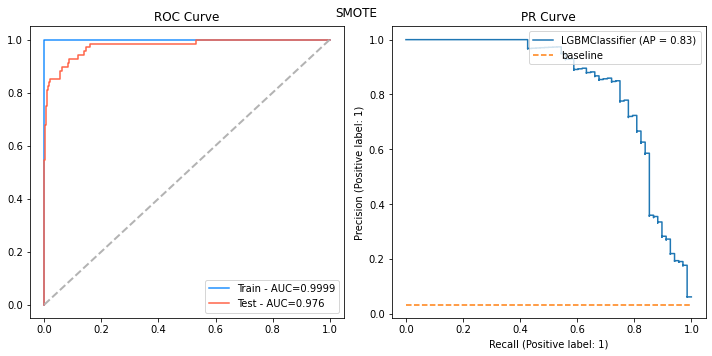

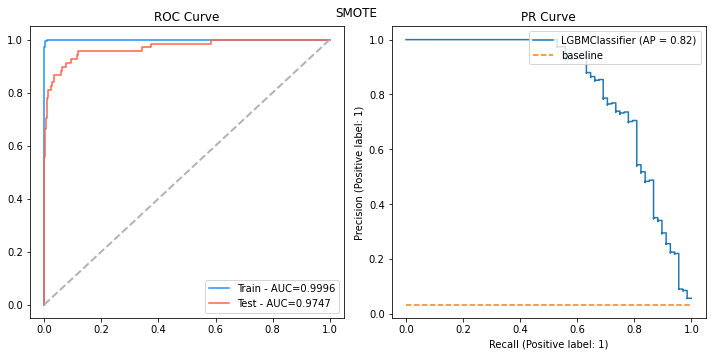

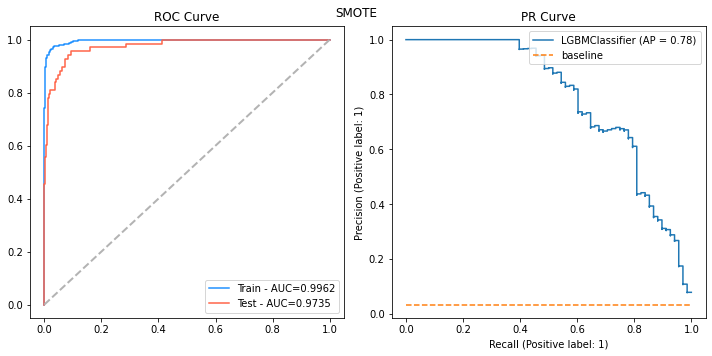

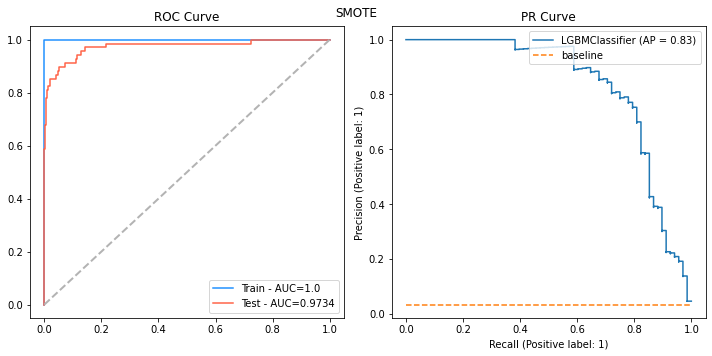

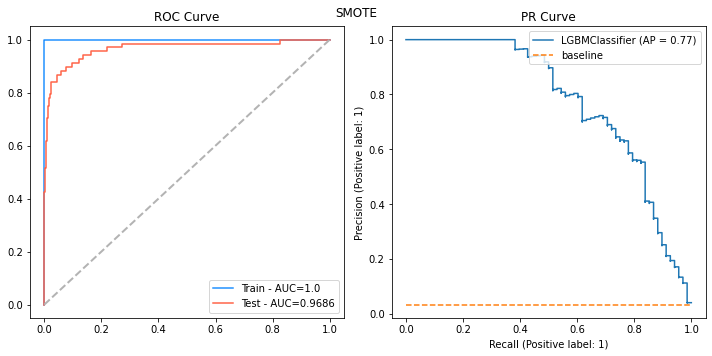

...

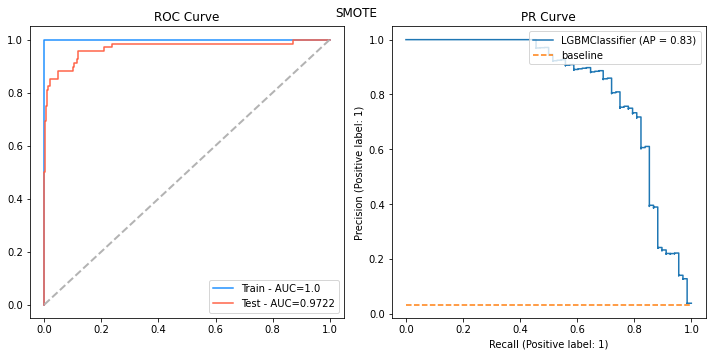

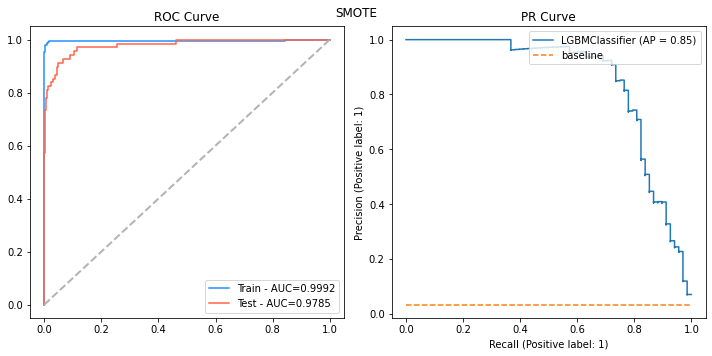

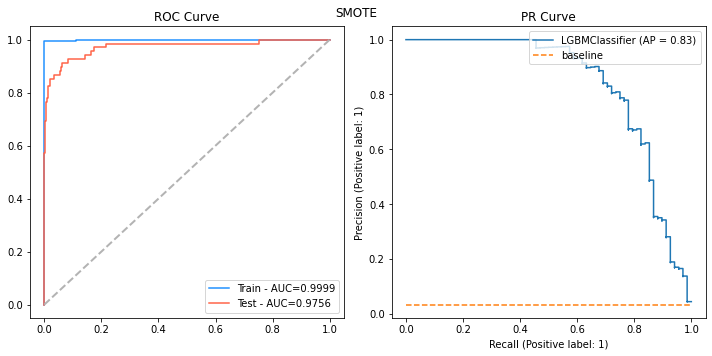

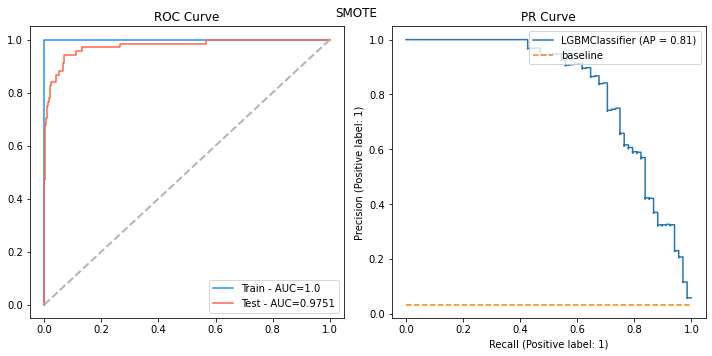

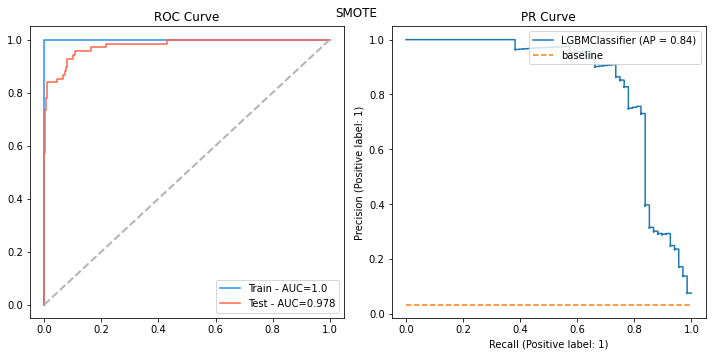

In [180]:
rs_name=str(smote)[:str(smote).find('(')]
def objective(trial: Trial, X, y,resampler=None) -> float:
    #joblib.dump(study, 'study.pkl')

    param = {
        "objective": "binary",
        "metric": "binary_logloss",
        "verbosity": -1,
        "boosting_type": "gbdt",
        "lambda_l1": trial.suggest_float("lambda_l1", 1e-8, 10.0, log=True),
        "lambda_l2": trial.suggest_float("lambda_l2", 1e-8, 10.0, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 2, 256),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.4, 1.0),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.4, 1.0),
        "bagging_freq": trial.suggest_int("bagging_freq", 1, 7),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),
    }

    train_scores, test_scores,accs, precs, recs,f1s, cfmx,model   = lgb_tune_test_score(X_fe_sub,y,param,rs_name=rs_name, resampler=None, cv=kf)
    return np.mean(test_scores)

study = optuna.create_study(direction='maximize', sampler=TPESampler())
study.optimize(lambda trial: objective(trial, X_old_sub, y,resampler=smote), n_trials=50)
print(f"Best trial: score {study.best_trial.value},\nparams {study.best_trial.params}")


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0768553	training's auc: 0.997431	valid_1's binary_logloss: 0.11932	valid_1's auc: 0.950143
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0806654	training's auc: 0.997488	valid_1's binary_logloss: 0.130645	valid_1's auc: 0.971669
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0817296	training's auc: 0.997513	valid_1's binary_logloss: 0.117073	valid_1's auc: 0.981309
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0769043	training's auc: 0.997653	valid_1's binary_logloss: 0.12051	valid_1's auc: 0.978504
Training until validation scores don't improve for

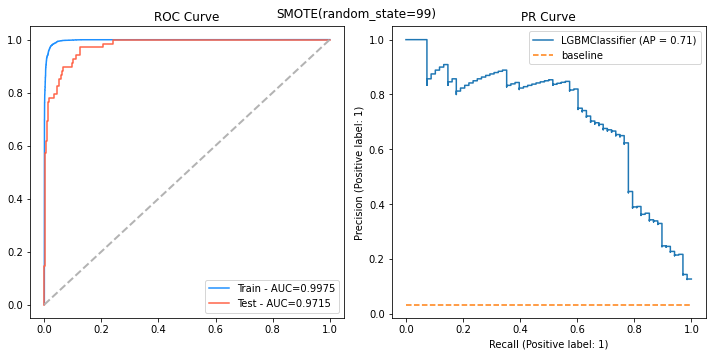

In [181]:
rs_name=str(smote)[:str(smote).find('(')]
lgb_params_tune= {  "objective": "binary",
                    "metric": "binary_logloss",
                    "verbosity": -1,
                    "boosting_type": "gbdt",
                    'lambda_l1': 8.451682023892412
                  , 'lambda_l2': 4.026759062825183e-08
                  , 'num_leaves': 131
                  , 'feature_fraction': 0.8734249277754904
                  , 'bagging_fraction': 0.9328254096458799
                  , 'bagging_freq': 7
                  , 'min_child_samples': 19}
result_lgb_tune=[]

train_scores, test_scores,accs, precs, recs,f1s, cfmx,model = lgb_tune_test_score(X_old_sub,y,lgb_params_tune,cv=kf,rs_name=smote, resampler=smote)
result_lgb_tune.append((model_name
               , rs_name
               , np.mean(accs)
               , np.std(accs)
               , np.mean(precs)
               , np.std(precs)
               , np.mean(recs)
               , np.std(recs)
               , np.mean(f1s)
               , np.std(f1s)
               , np.mean(train_scores)
               , np.std(train_scores)
               , np.mean(test_scores)
               , np.std(test_scores)
               , np.min(test_scores)
               , np.max(test_scores)                            
              )
             ) 

plt.show()

In [182]:
lgb_result_tune = pd.DataFrame(result_lgb_tune, columns=metric_cols)
display_metrics(lgb_result_tune.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
0,LightGBM,SMOTE,89.58%,0.75%,23.88%,1.12%,94.37%,4.47%,38.09%,1.51%,99.75%,0.01%,97.15%,1.12%,95.01%,98.13%


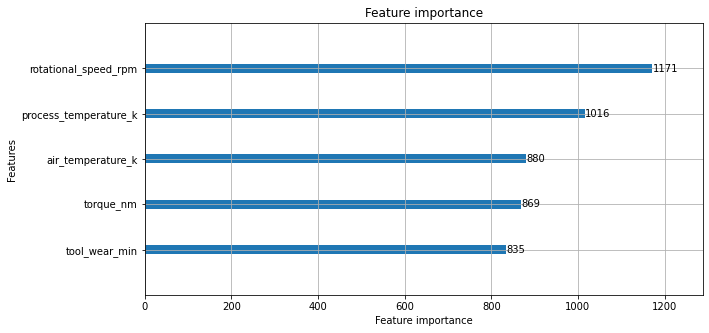

In [183]:
import lightgbm as lgb
lgb.plot_importance(model,figsize=(10,5))

### X Feature Engineer

#### kNN

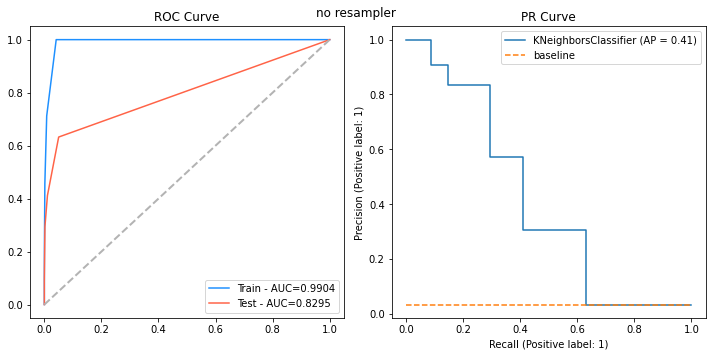

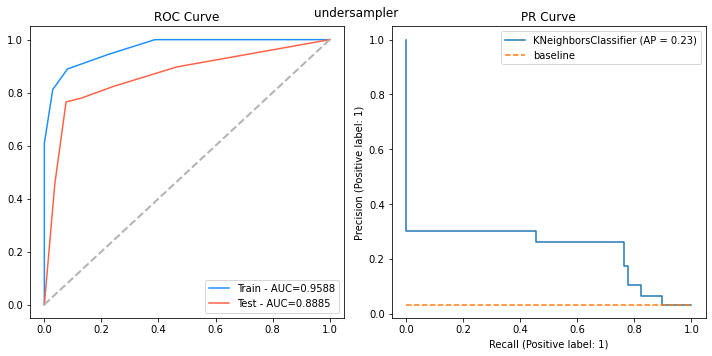

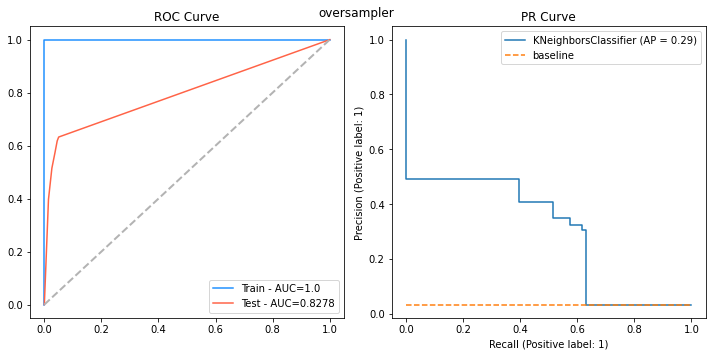

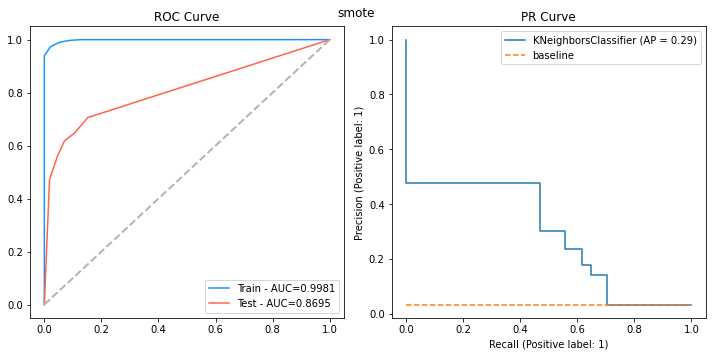

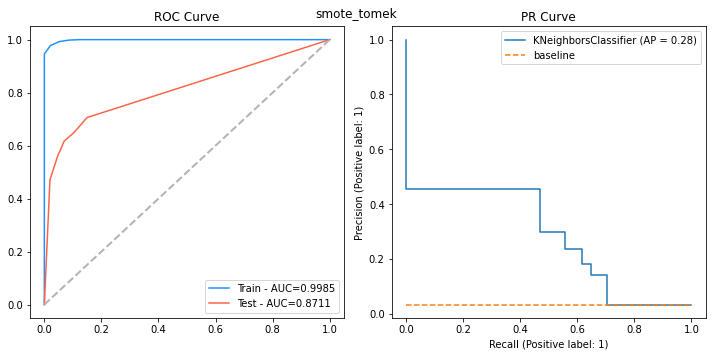

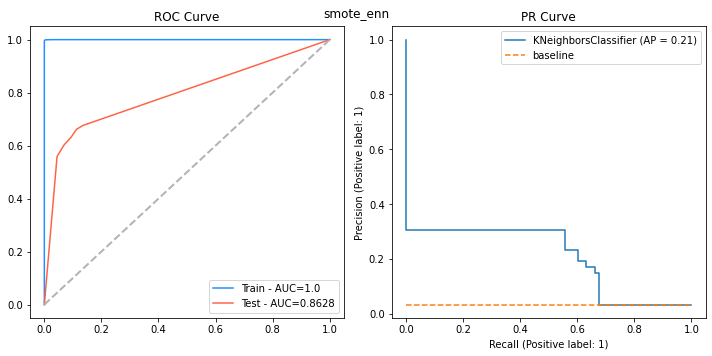

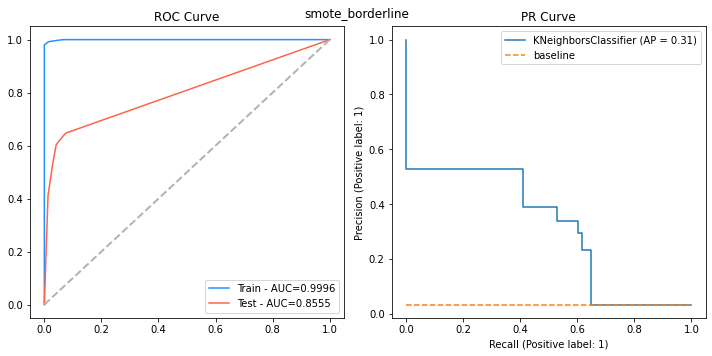

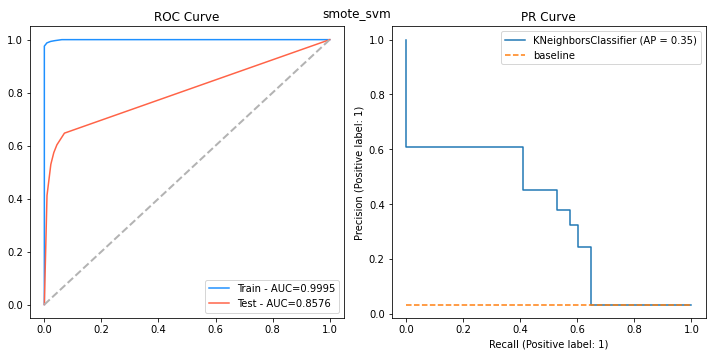

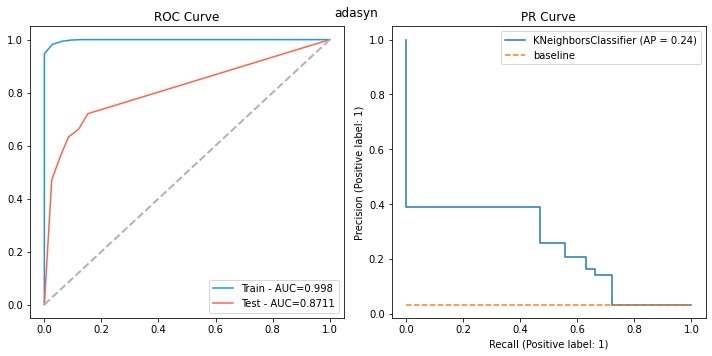

In [184]:
model_name = 'kNN'
result_kNN=[]
for rs_name, rs in resamplers:
    train_scores, test_scores,accs, precs, recs,f1s, cfmx,knn = knn_cross_val_score(X_fe_sub,y,resampler=rs, cv=kf)
    result_kNN.append((model_name
                   , rs_name
                   , np.mean(accs)
                   , np.std(accs)
                   , np.mean(precs)
                   , np.std(precs)
                   , np.mean(recs)
                   , np.std(recs)
                   , np.mean(f1s)
                   , np.std(f1s)
                   , np.mean(train_scores)
                   , np.std(train_scores)
                   , np.mean(test_scores)
                   , np.std(test_scores)
                   , np.min(test_scores)
                   , np.max(test_scores)
                  )
                 )

plt.show()

In [185]:
kNN_result = pd.DataFrame(result_kNN, columns=metric_cols)
display_metrics(kNN_result.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
1,kNN,undersampler,85.73%,1.39%,16.94%,1.40%,81.41%,2.62%,28.01%,1.89%,95.88%,1.08%,88.85%,1.59%,86.31%,90.77%
4,kNN,smote_tomek,91.81%,0.42%,25.21%,1.26%,71.97%,5.98%,37.30%,1.95%,99.85%,0.01%,87.11%,3.28%,81.01%,90.40%
8,kNN,adasyn,90.26%,0.52%,22.13%,1.49%,74.33%,6.31%,34.08%,2.29%,99.80%,0.03%,87.11%,3.00%,81.31%,89.36%
3,kNN,smote,91.85%,0.38%,25.30%,1.39%,71.97%,5.98%,37.42%,2.15%,99.81%,0.01%,86.95%,3.15%,80.99%,89.74%
5,kNN,smote_enn,90.03%,0.65%,21.67%,1.76%,74.04%,6.01%,33.51%,2.55%,100.00%,0.00%,86.28%,3.77%,79.40%,89.96%
7,kNN,smote_svm,95.73%,0.39%,41.67%,3.38%,62.84%,4.46%,49.99%,2.82%,99.95%,0.01%,85.76%,2.97%,80.24%,89.16%
6,kNN,smote_borderline,95.13%,0.42%,38.02%,2.81%,68.43%,4.82%,48.82%,3.07%,99.96%,0.01%,85.55%,2.96%,80.01%,88.85%
0,kNN,no resampler,97.34%,0.13%,77.90%,4.93%,30.07%,4.60%,43.20%,5.04%,99.04%,0.05%,82.95%,2.00%,79.92%,85.90%
2,kNN,oversampler,95.43%,0.45%,39.34%,3.77%,62.83%,5.64%,48.28%,3.78%,100.00%,0.00%,82.78%,2.05%,79.73%,85.84%


#### Logistics Regression

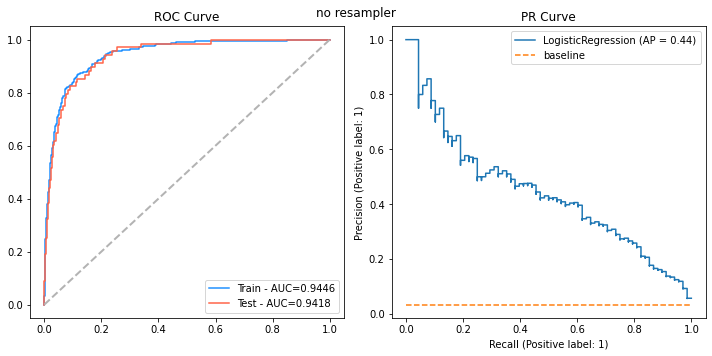

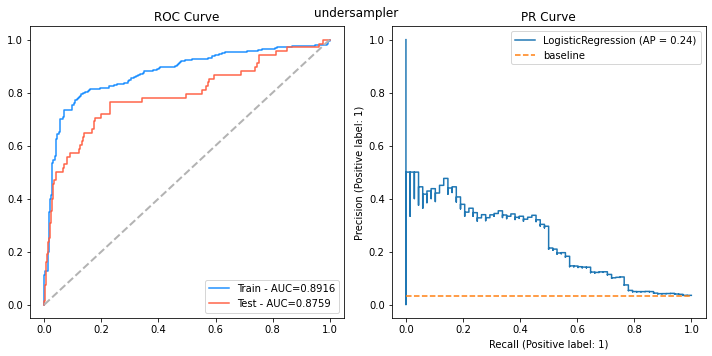

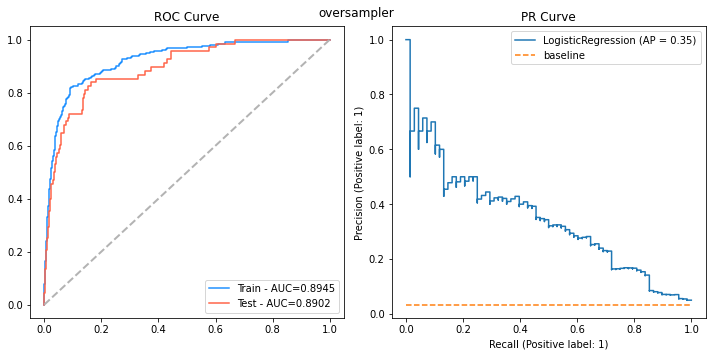

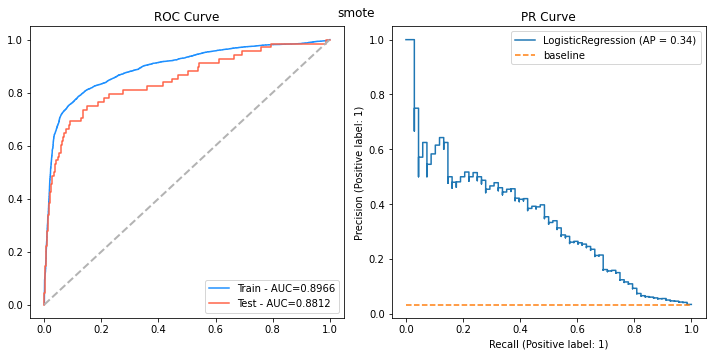

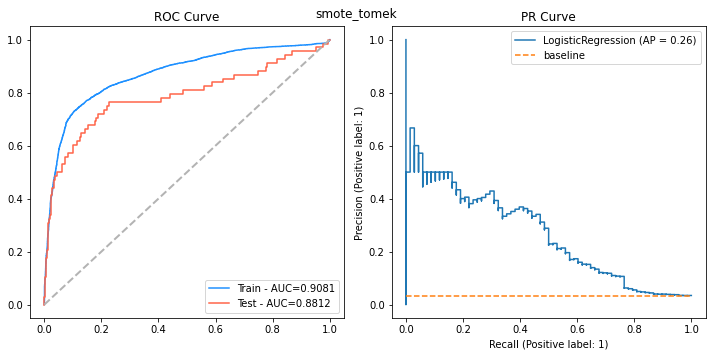

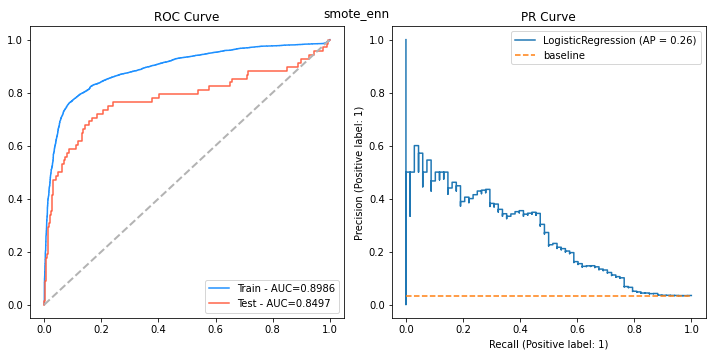

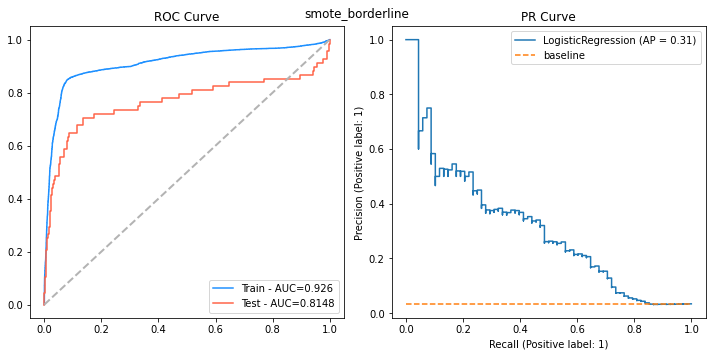

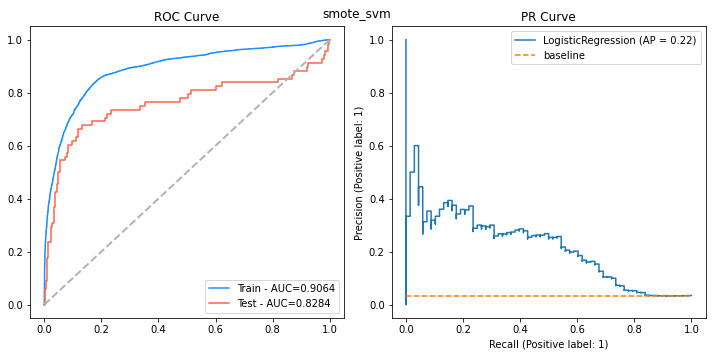

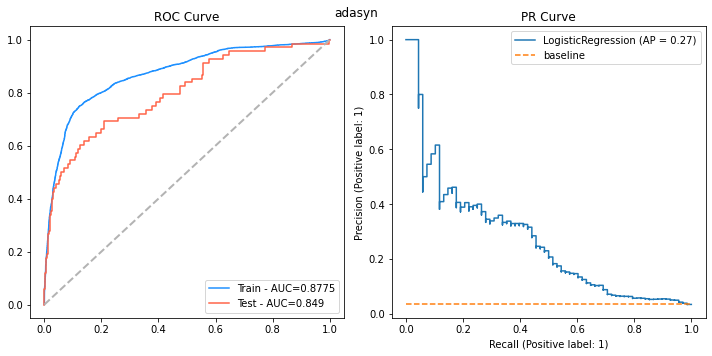

In [186]:
model_name = 'LogisticRegression'
result_logreg=[]
for rs_name, rs in resamplers:
    train_scores, test_scores,accs, precs, recs,f1s, cfmx,lg = logreg_cross_val_score(X_fe_sub,y,logreg_params, resampler=rs, cv=kf)
    result_logreg.append((model_name
                   , rs_name
                   , np.mean(accs)
                   , np.std(accs)
                   , np.mean(precs)
                   , np.std(precs)
                   , np.mean(recs)
                   , np.std(recs)
                   , np.mean(f1s)
                   , np.std(f1s)
                   , np.mean(train_scores)
                   , np.std(train_scores)
                   , np.mean(test_scores)
                   , np.std(test_scores)
                   , np.min(test_scores)
                   , np.max(test_scores)            
                  )
                 )
    
plt.show()

In [187]:
df_logreg_eval = pd.DataFrame(result_logreg, columns=metric_cols)
display_metrics(df_logreg_eval.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
0,LogisticRegression,no resampler,86.83%,0.61%,18.79%,1.18%,86.70%,4.84%,30.88%,1.87%,94.46%,0.25%,94.18%,0.93%,92.54%,95.13%
2,LogisticRegression,oversampler,82.53%,2.65%,14.32%,2.36%,81.10%,5.49%,24.29%,3.56%,89.45%,3.39%,89.02%,3.65%,83.72%,93.85%
4,LogisticRegression,smote_tomek,84.01%,2.55%,15.54%,3.13%,81.09%,7.90%,26.04%,4.80%,90.81%,3.27%,88.12%,6.59%,78.73%,94.58%
3,LogisticRegression,smote,83.31%,2.33%,14.77%,2.40%,80.23%,4.65%,24.90%,3.56%,89.66%,3.41%,88.12%,3.60%,84.71%,94.89%
1,LogisticRegression,undersampler,82.70%,4.03%,14.78%,4.12%,79.93%,6.87%,24.82%,6.18%,89.16%,3.02%,87.59%,6.01%,79.15%,94.93%
5,LogisticRegression,smote_enn,81.51%,1.63%,13.24%,2.02%,79.32%,7.60%,22.68%,3.24%,89.86%,1.70%,84.97%,4.79%,77.93%,92.50%
8,LogisticRegression,adasyn,80.02%,0.42%,11.86%,0.79%,76.11%,5.21%,20.52%,1.36%,87.75%,0.58%,84.90%,3.24%,79.99%,89.60%
7,LogisticRegression,smote_svm,84.20%,3.84%,15.34%,5.11%,73.14%,4.77%,25.04%,6.67%,90.64%,3.65%,82.84%,4.87%,75.91%,90.79%
6,LogisticRegression,smote_borderline,86.01%,1.14%,16.10%,1.42%,73.73%,4.34%,26.41%,2.03%,92.60%,1.30%,81.48%,4.87%,76.70%,89.23%


#### Decision Tree

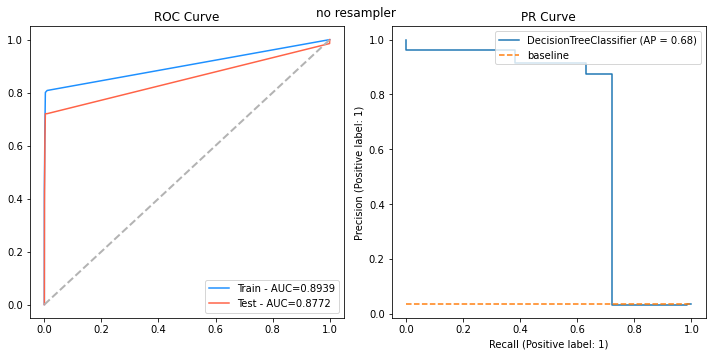

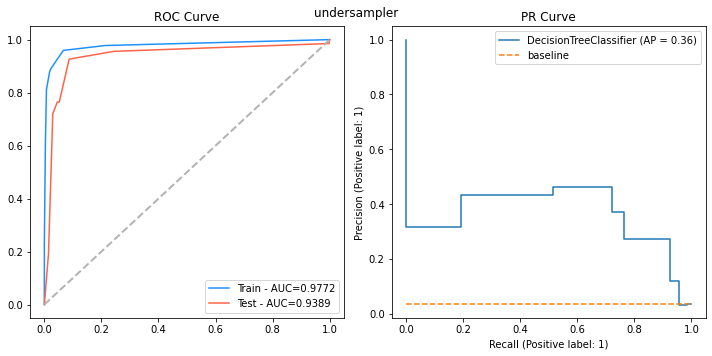

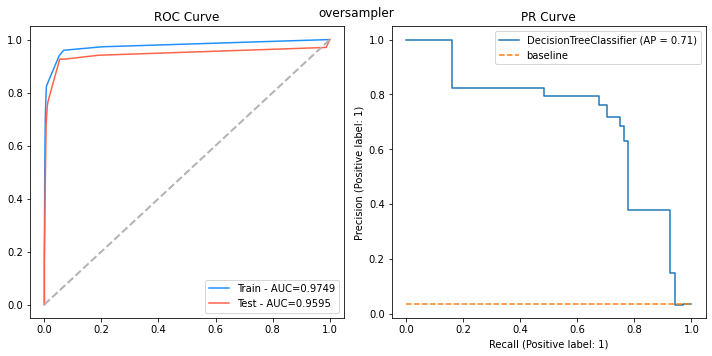

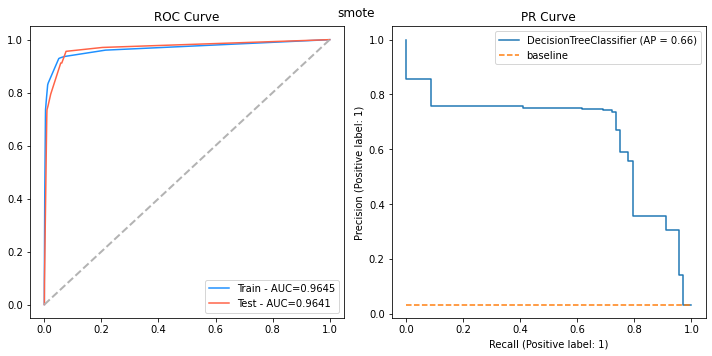

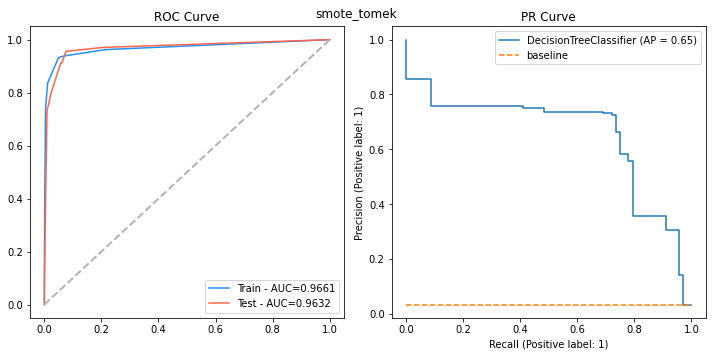

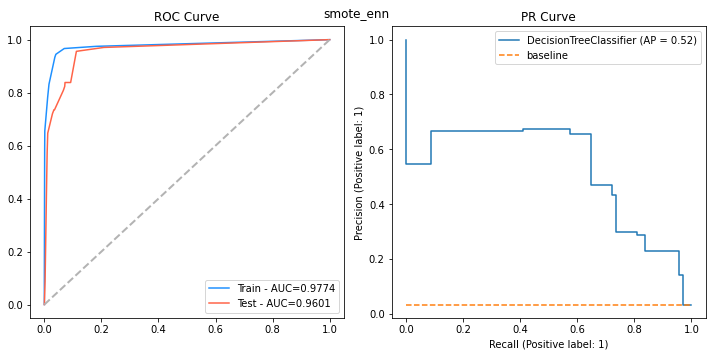

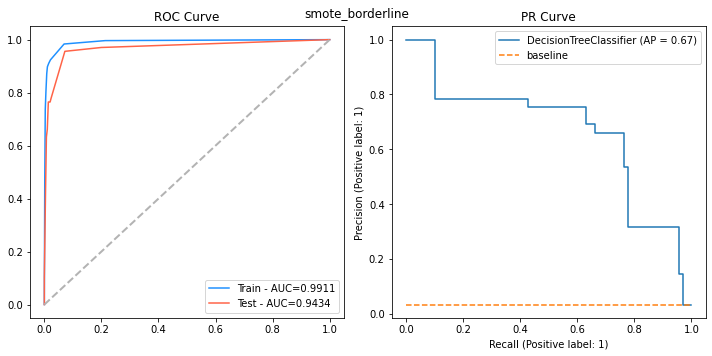

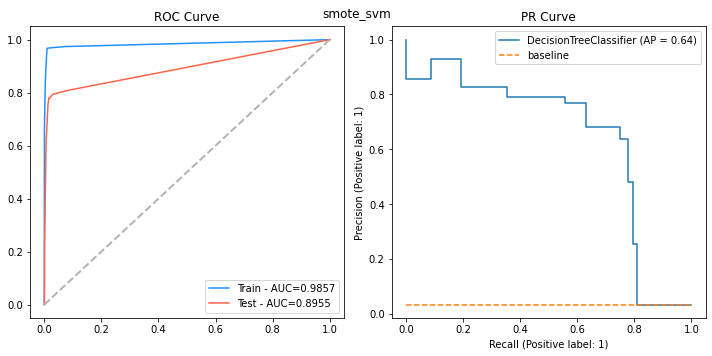

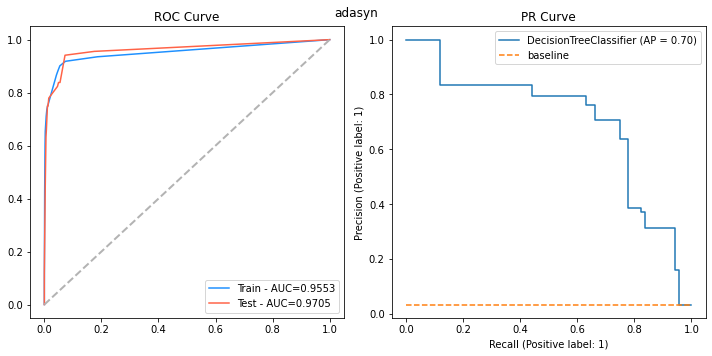

In [188]:
model_name = 'DecisionTree'
result_dct=[]

for rs_name, rs in resamplers:
    train_scores, test_scores,accs, precs, recs,f1s, cfmx,dt = dct_cross_val_score(X_fe_sub,y,dt_params ,resampler=rs, cv=kf)
    result_dct.append((model_name
                   , rs_name
                   , np.mean(accs)
                   , np.std(accs)
                   , np.mean(precs)
                   , np.std(precs)
                   , np.mean(recs)
                   , np.std(recs)
                   , np.mean(f1s)
                   , np.std(f1s)
                   , np.mean(train_scores)
                   , np.std(train_scores)
                   , np.mean(test_scores)
                   , np.std(test_scores)
                   , np.min(test_scores)
                   , np.max(test_scores)                           
                  )
                 )
plt.show()

In [189]:
dct_result = pd.DataFrame(result_dct, columns=metric_cols)
display_metrics(dct_result.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
8,DecisionTree,adasyn,93.45%,0.72%,33.54%,2.09%,93.21%,5.15%,49.22%,1.97%,95.53%,0.16%,97.05%,1.15%,95.48%,98.42%
3,DecisionTree,smote,91.18%,2.15%,27.92%,5.24%,93.78%,4.37%,42.73%,6.11%,96.45%,0.37%,96.41%,1.84%,93.00%,98.51%
4,DecisionTree,smote_tomek,90.98%,2.18%,27.45%,5.51%,93.49%,4.87%,42.14%,6.51%,96.61%,0.37%,96.32%,1.90%,92.87%,98.50%
5,DecisionTree,smote_enn,89.06%,2.09%,23.43%,3.45%,93.81%,5.21%,37.28%,4.03%,97.74%,0.27%,96.01%,1.23%,94.06%,97.78%
2,DecisionTree,oversampler,93.69%,2.15%,35.90%,7.32%,93.50%,2.44%,51.43%,7.90%,97.49%,0.31%,95.95%,1.40%,94.39%,98.53%
6,DecisionTree,smote_borderline,95.56%,1.55%,45.06%,9.43%,86.40%,7.31%,58.13%,6.48%,99.11%,0.04%,94.34%,4.01%,86.40%,96.94%
1,DecisionTree,undersampler,91.25%,3.02%,28.88%,8.43%,91.14%,2.35%,43.24%,9.58%,97.72%,0.55%,93.89%,2.08%,90.07%,96.08%
7,DecisionTree,smote_svm,97.45%,0.51%,59.60%,6.17%,81.99%,4.40%,68.78%,4.43%,98.57%,0.33%,89.55%,2.33%,85.79%,92.53%
0,DecisionTree,no resampler,98.83%,0.16%,88.56%,2.50%,75.21%,4.20%,81.28%,2.92%,89.39%,0.51%,87.72%,2.41%,84.87%,90.99%


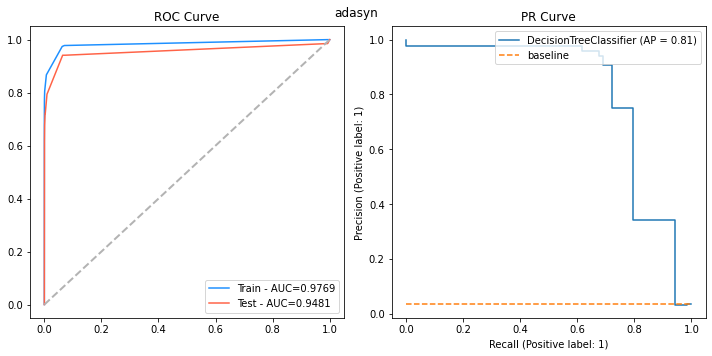

In [190]:
dt_params = {'max_depth':6,'random_state':random_state}
train_scores, test_scores,accs, precs, recs,f1s, cfmx,dt = dct_cross_val_score(X_fe_sub,y,dt_params,resampler=None, cv=kf)

In [191]:
dt

DecisionTreeClassifier(max_depth=6, random_state=99)

In [192]:
X_fe_sub.columns

Index(['rotational_speed_rpm_X_torque_nm', 'rotational_speed_rpm',
       'diff_temperature_X_rotational_speed_rpm', 'diff_temperature',
       'torque_nm_X_tool_wear_min', 'air_temperature_k_X_torque_nm',
       'process_temperature_k_X_rotational_speed_rpm', 'torque_nm',
       'diff_temperature_X_torque_nm',
       'air_temperature_k_X_rotational_speed_rpm',
       'process_temperature_k_X_torque_nm', 'diff_temperature_X_tool_wear_min',
       'tool_wear_min'],
      dtype='object')

In [193]:
feature_names=['rotational_speed_rpm_X_torque_nm', 'rotational_speed_rpm',
       'diff_temperature_X_rotational_speed_rpm', 'diff_temperature',
       'torque_nm_X_tool_wear_min', 'air_temperature_k_X_torque_nm',
       'process_temperature_k_X_rotational_speed_rpm', 'torque_nm',
       'diff_temperature_X_torque_nm',
       'air_temperature_k_X_rotational_speed_rpm',
       'process_temperature_k_X_torque_nm', 'diff_temperature_X_tool_wear_min',
       'tool_wear_min']

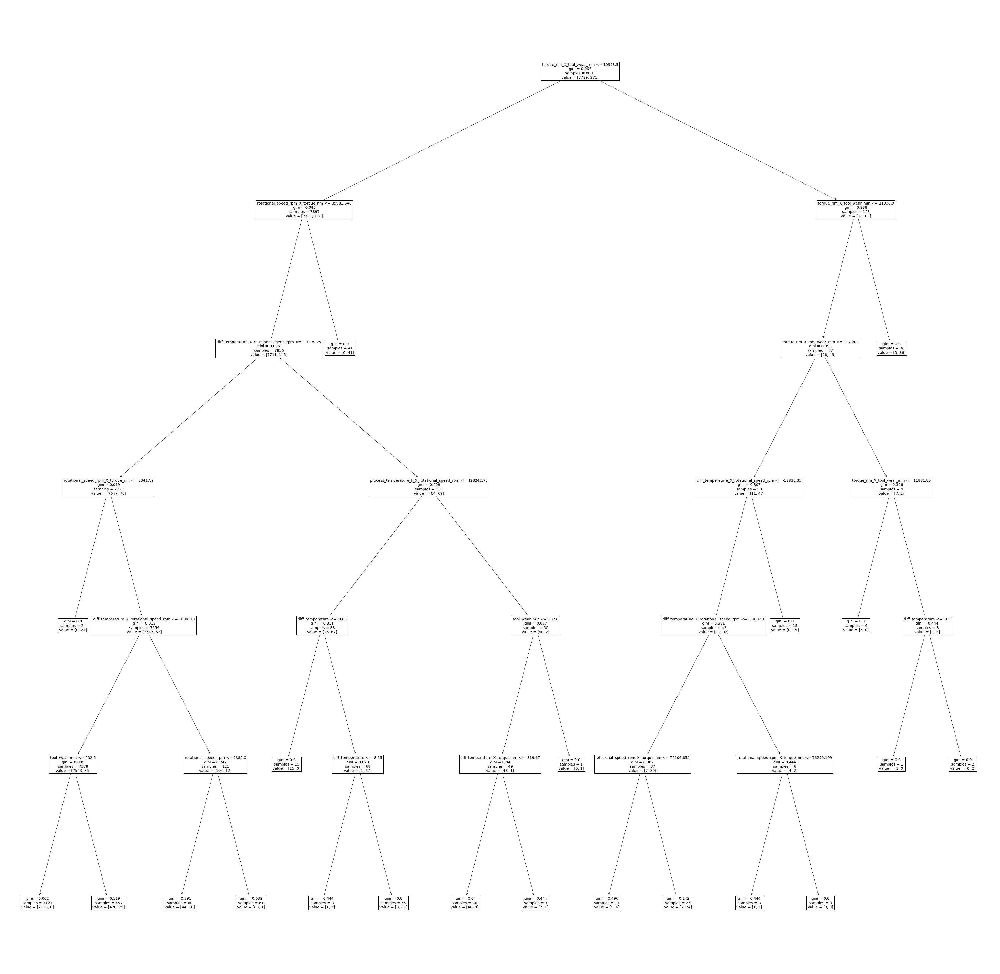

In [194]:
from sklearn import tree
plt.figure(figsize=(68,68)) 
tree.plot_tree(dt,feature_names=feature_names, fontsize = 14)
plt.show()

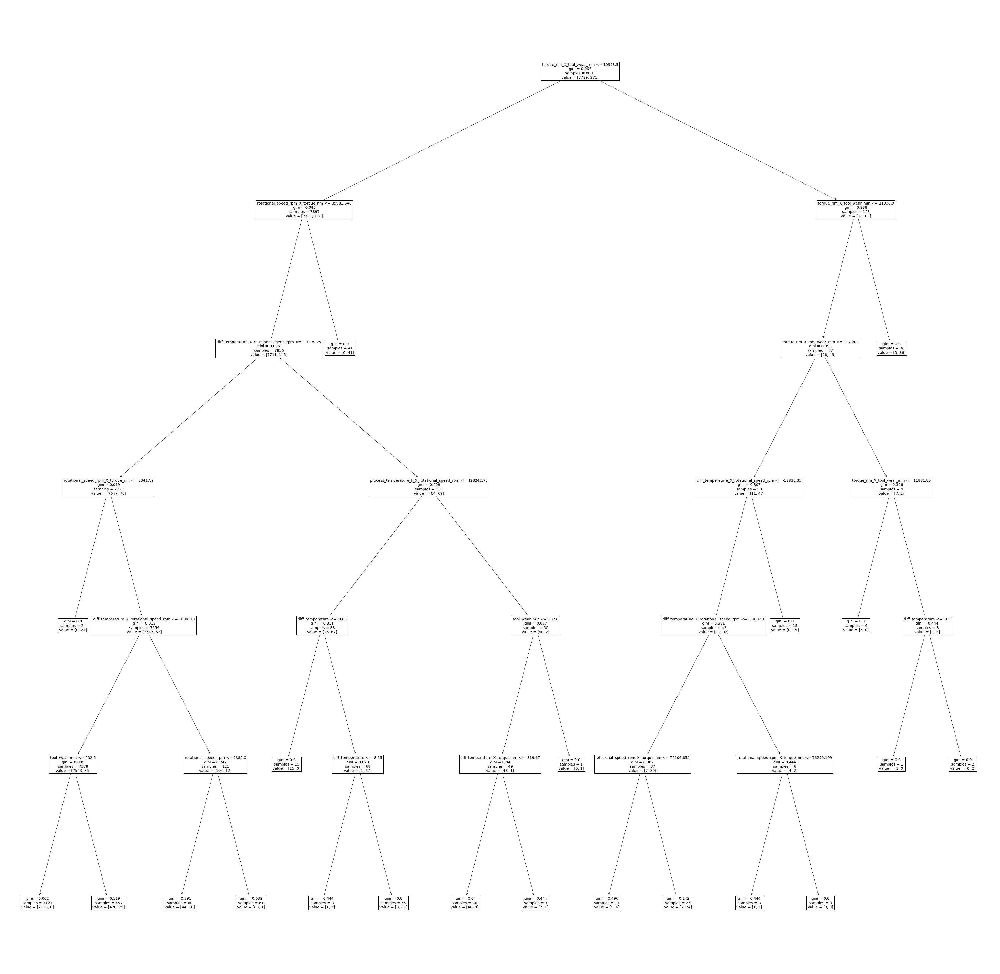

In [195]:
plt.figure(figsize=(68,68)) 
tree.plot_tree(dt,feature_names=feature_names, fontsize = 14)
plt.savefig('tree_high_dpi', dpi = 100)

#### Random Forest

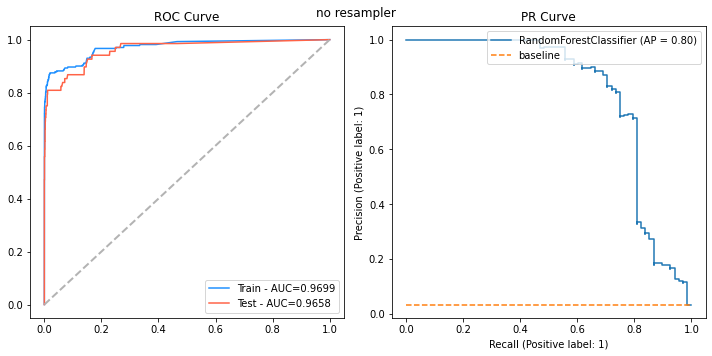

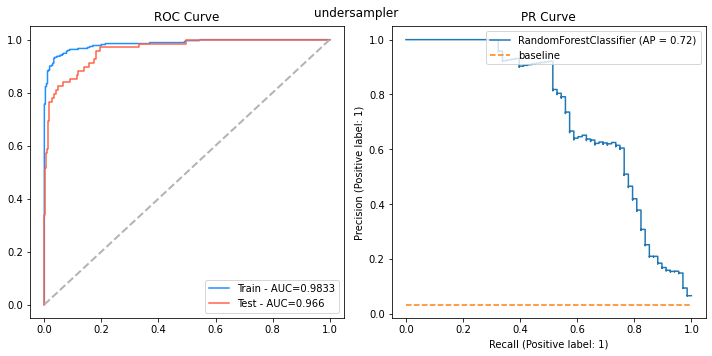

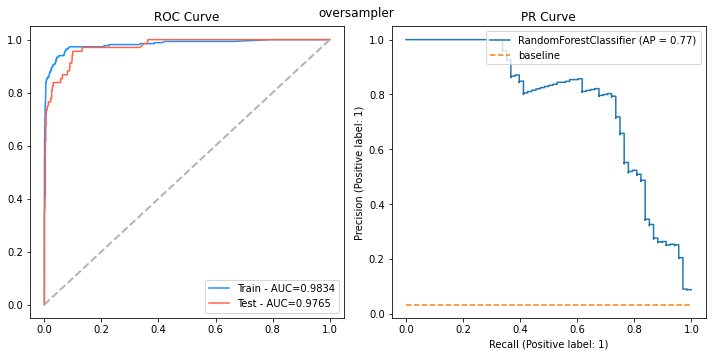

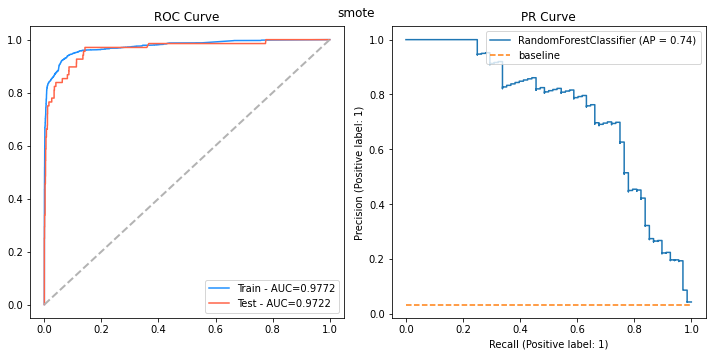

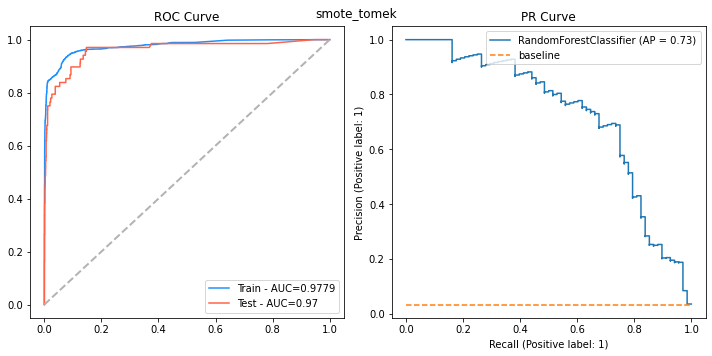

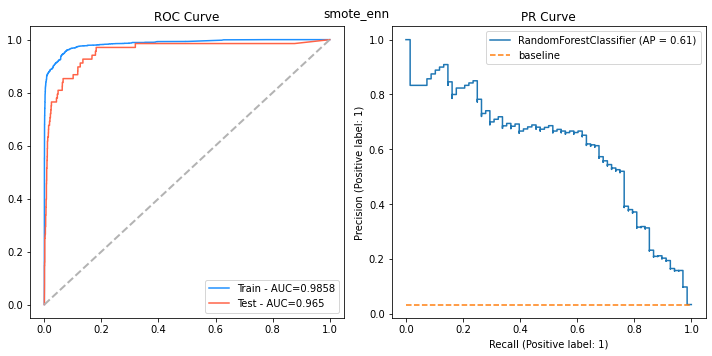

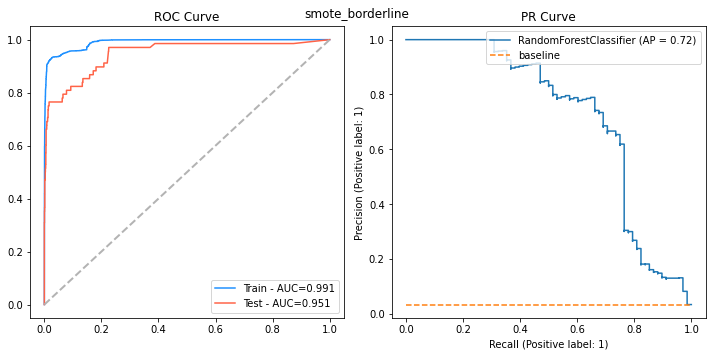

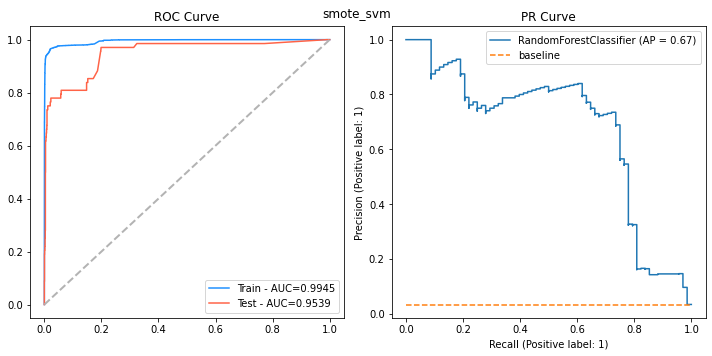

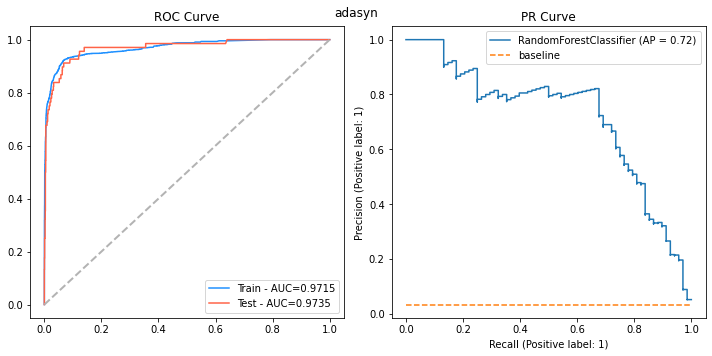

In [196]:
model_name = 'RandomForest'
result_rfc=[]

for rs_name, rs in resamplers:
    train_scores,test_scores,accs,precs,recs,f1s,cfmx,model = rfc_cross_val_score(X_fe_sub,y,resampler=rs, cv=kf)
    result_rfc.append((model_name
                   , rs_name
                   , np.mean(accs)
                   , np.std(accs)
                   , np.mean(precs)
                   , np.std(precs)
                   , np.mean(recs)
                   , np.std(recs)
                   , np.mean(f1s)
                   , np.std(f1s)
                   , np.mean(train_scores)
                   , np.std(train_scores)
                   , np.mean(test_scores)
                   , np.std(test_scores)
                   , np.min(test_scores)
                   , np.max(test_scores)                        
                  )
                 )

plt.show()

In [197]:
rfc_result = pd.DataFrame(result_rfc, columns=metric_cols)
display_metrics(rfc_result.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
2,RandomForest,oversampler,94.30%,1.23%,37.09%,5.41%,88.77%,5.63%,51.91%,4.52%,98.34%,0.13%,97.65%,0.95%,96.13%,98.89%
8,RandomForest,adasyn,91.43%,0.68%,27.53%,1.51%,92.91%,3.05%,42.44%,1.74%,97.15%,0.16%,97.35%,0.92%,95.92%,98.40%
3,RandomForest,smote,93.78%,1.62%,34.87%,6.04%,86.71%,4.14%,49.39%,6.17%,97.72%,0.12%,97.22%,0.99%,95.83%,98.56%
4,RandomForest,smote_tomek,93.74%,1.37%,34.35%,5.44%,86.12%,4.09%,48.85%,5.63%,97.79%,0.14%,97.00%,1.11%,95.41%,98.48%
1,RandomForest,undersampler,90.62%,3.16%,26.71%,6.87%,88.19%,4.21%,40.55%,8.27%,98.33%,0.30%,96.60%,1.47%,94.00%,98.15%
0,RandomForest,no resampler,98.48%,0.16%,94.37%,2.84%,58.69%,4.79%,72.25%,3.66%,96.99%,0.31%,96.58%,1.16%,94.47%,97.58%
5,RandomForest,smote_enn,91.21%,1.02%,26.31%,2.50%,87.01%,3.72%,40.34%,3.04%,98.58%,0.05%,96.50%,1.04%,95.19%,97.69%
7,RandomForest,smote_svm,96.95%,0.37%,53.76%,3.73%,76.69%,1.80%,63.14%,2.84%,99.45%,0.10%,95.39%,1.44%,92.97%,97.24%
6,RandomForest,smote_borderline,92.01%,1.11%,27.53%,2.99%,81.11%,3.07%,41.02%,3.52%,99.10%,0.16%,95.10%,1.92%,91.69%,97.31%


#### XGBoost

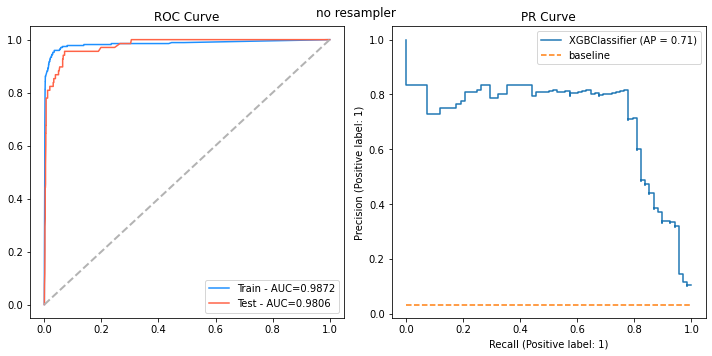

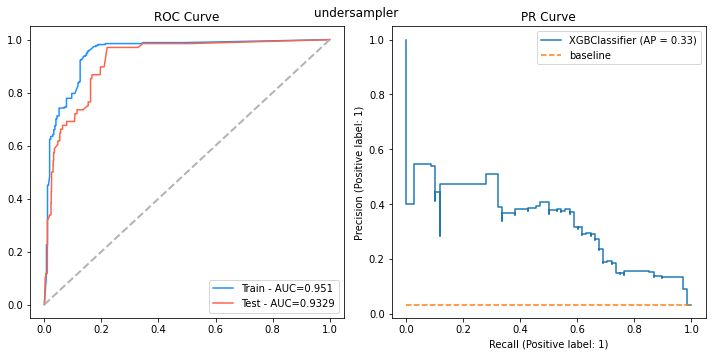

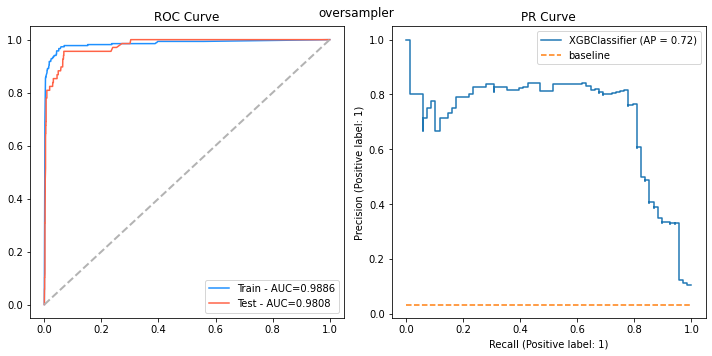

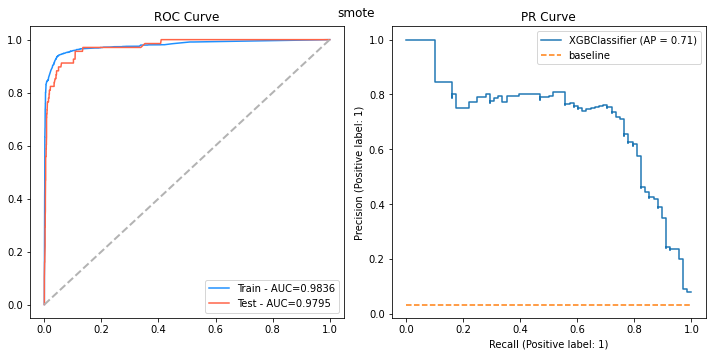

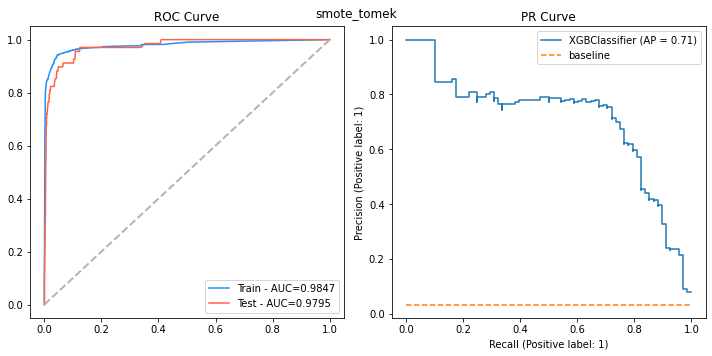

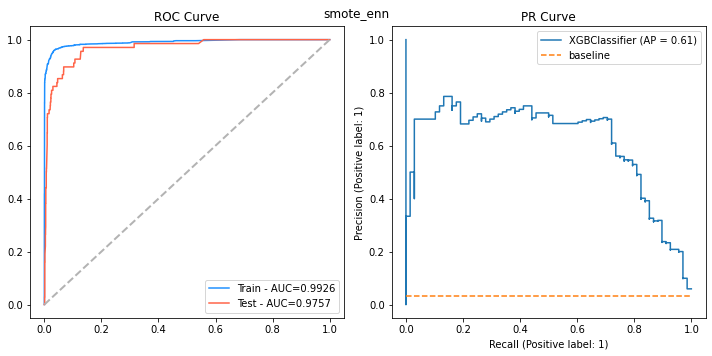

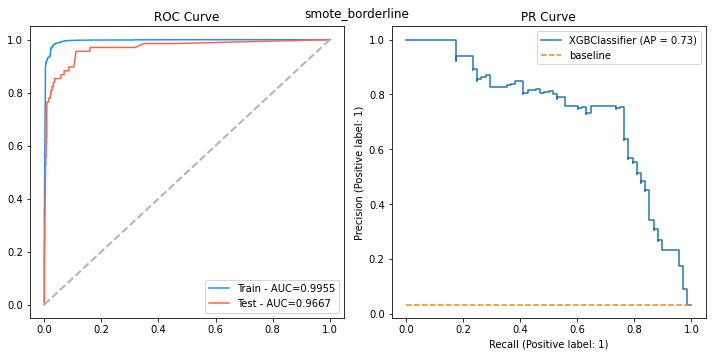

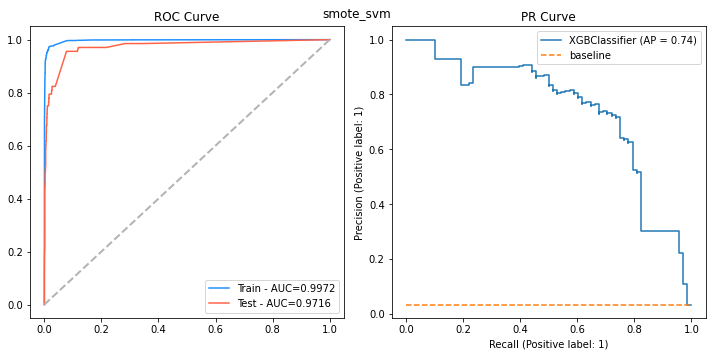

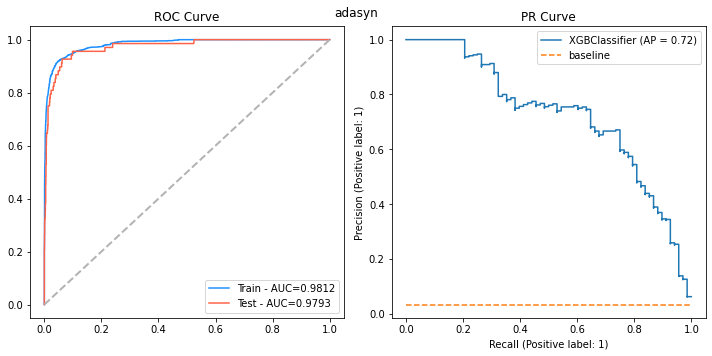

In [198]:
model_name = 'XGBoost'
result_xgb=[]
for rs_name, rs in resamplers:
    train_scores, test_scores,accs, precs, recs,f1s, cfmx,model = xgb_cross_val_score(X_fe_sub,y,xgb_params,resampler=rs, cv=kf)
    result_xgb.append((model_name
                   , rs_name
                   , np.mean(accs)
                   , np.std(accs)
                   , np.mean(precs)
                   , np.std(precs)
                   , np.mean(recs)
                   , np.std(recs)
                   , np.mean(f1s)
                   , np.std(f1s)
                   , np.mean(train_scores)
                   , np.std(train_scores)
                   , np.mean(test_scores)
                   , np.std(test_scores)
                   , np.min(test_scores)
                   , np.max(test_scores)                        
                  )
                 )

plt.show()

In [199]:
xgb_result = pd.DataFrame(result_xgb, columns=metric_cols)
display_metrics(xgb_result.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
2,XGBoost,oversampler,94.72%,0.35%,38.48%,1.24%,92.31%,4.75%,54.26%,1.10%,98.86%,0.23%,98.08%,1.00%,96.32%,99.24%
0,XGBoost,no resampler,94.85%,0.31%,39.09%,1.20%,92.31%,4.64%,54.87%,1.26%,98.72%,0.40%,98.06%,1.04%,96.19%,99.30%
3,XGBoost,smote,94.21%,0.77%,36.42%,2.66%,92.31%,4.57%,52.12%,2.55%,98.36%,0.39%,97.95%,1.04%,96.30%,99.36%
4,XGBoost,smote_tomek,94.10%,0.89%,36.06%,3.05%,92.31%,4.57%,51.71%,2.94%,98.47%,0.34%,97.95%,1.07%,96.23%,99.35%
8,XGBoost,adasyn,92.95%,0.69%,31.81%,2.10%,93.20%,2.94%,47.38%,2.28%,98.12%,0.32%,97.93%,0.94%,96.50%,99.02%
5,XGBoost,smote_enn,92.70%,0.69%,30.98%,1.70%,92.90%,4.26%,46.41%,1.77%,99.26%,0.14%,97.57%,0.99%,96.09%,98.69%
7,XGBoost,smote_svm,97.75%,0.35%,63.26%,4.42%,81.11%,4.35%,71.02%,3.93%,99.72%,0.03%,97.16%,1.84%,93.63%,98.85%
6,XGBoost,smote_borderline,96.47%,0.51%,49.18%,4.62%,82.29%,3.41%,61.42%,3.72%,99.55%,0.06%,96.67%,2.04%,92.85%,98.72%
1,XGBoost,undersampler,85.86%,2.48%,17.11%,3.04%,79.33%,5.59%,28.03%,4.19%,95.10%,0.52%,93.29%,2.36%,89.60%,96.10%


#### LightGBM

Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's auc: 0.984581	valid_1's auc: 0.948039
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's auc: 0.980072	valid_1's auc: 0.967604
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's auc: 0.982058	valid_1's auc: 0.976659
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's auc: 0.983493	valid_1's auc: 0.970299
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's auc: 0.984058	valid_1's auc: 0.965599
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[59]	training's auc: 0.841662	valid_1's auc: 0.774158
Train

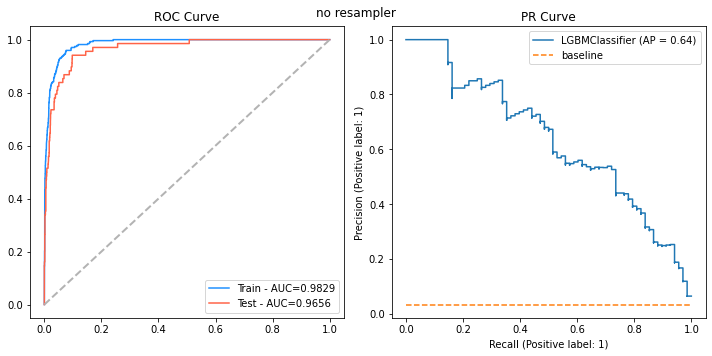

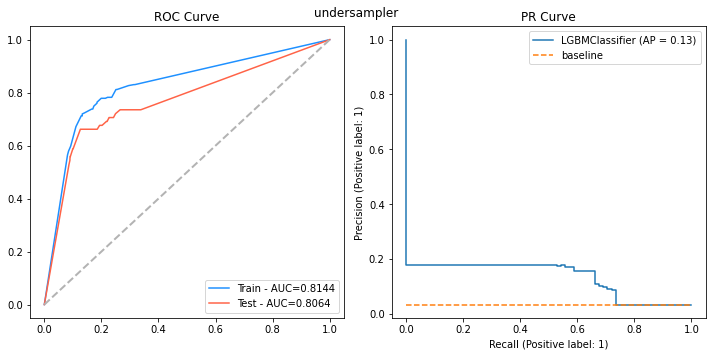

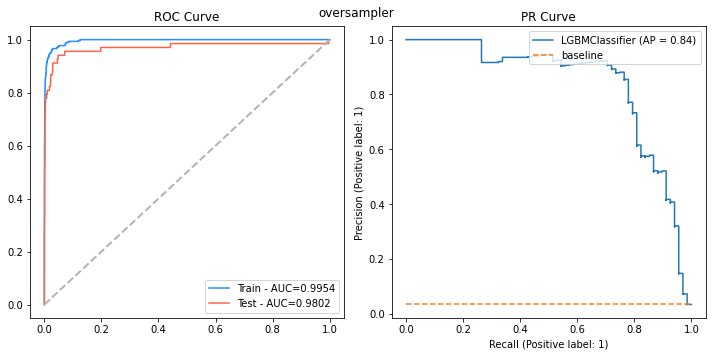

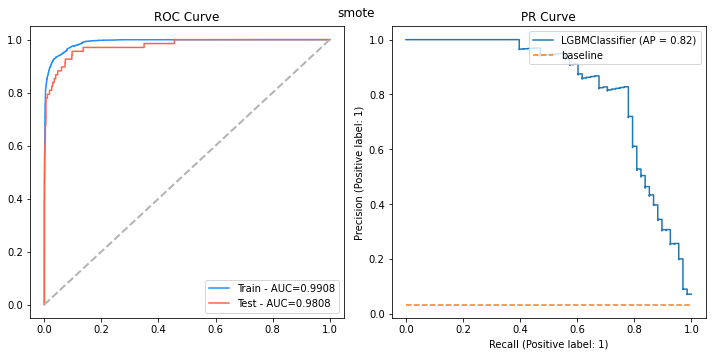

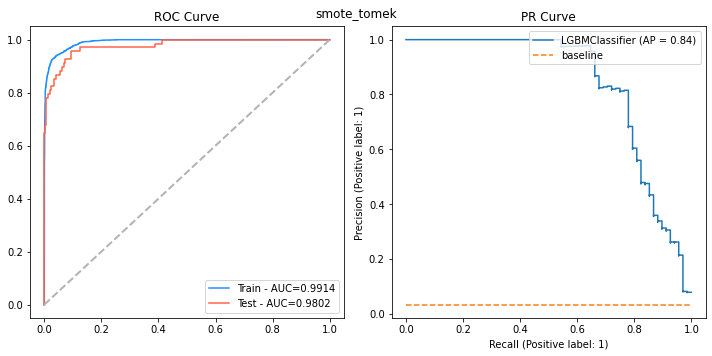

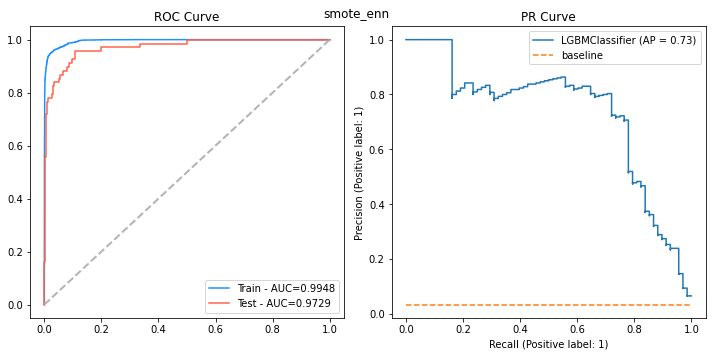

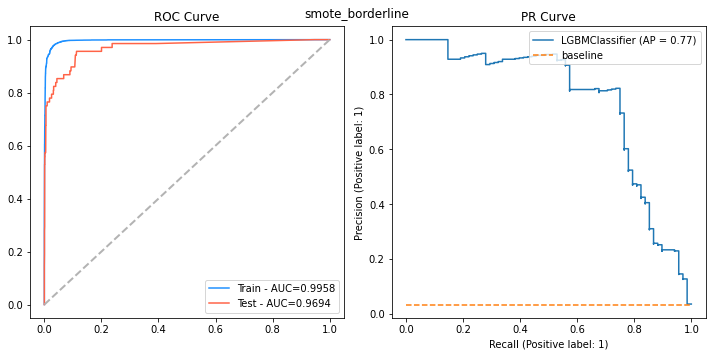

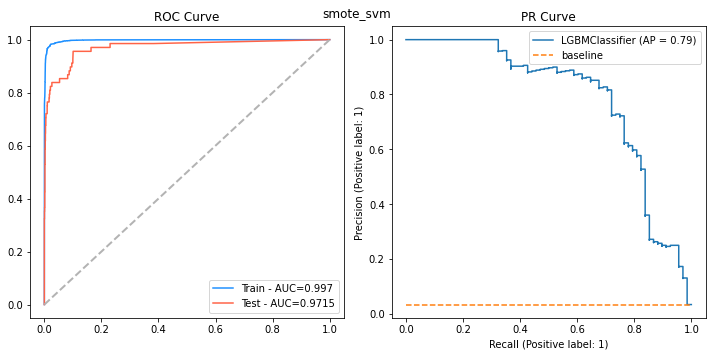

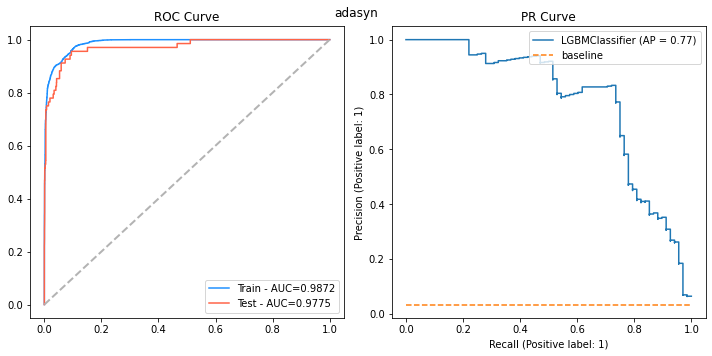

In [200]:
model_name = 'LightGBM'
result_lgb=[]
for rs_name, rs in resamplers:
    train_scores, test_scores,accs, precs, recs,f1s, cfmx,model = lgb_cross_val_score(X_fe_sub,y,lgb_params, resampler=rs, cv=kf)
    result_lgb.append((model_name
                   , rs_name
                   , np.mean(accs)
                   , np.std(accs)
                   , np.mean(precs)
                   , np.std(precs)
                   , np.mean(recs)
                   , np.std(recs)
                   , np.mean(f1s)
                   , np.std(f1s)
                   , np.mean(train_scores)
                   , np.std(train_scores)
                   , np.mean(test_scores)
                   , np.std(test_scores)
                   , np.min(test_scores)
                   , np.max(test_scores)                         
                  )
                 ) 

plt.show()

In [201]:
lgb_result = pd.DataFrame(result_lgb, columns=metric_cols)
display_metrics(lgb_result.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
3,LightGBM,smote,93.90%,0.65%,35.11%,2.10%,92.60%,4.72%,50.83%,2.02%,99.08%,0.05%,98.08%,0.81%,96.91%,99.22%
4,LightGBM,smote_tomek,93.79%,0.65%,34.62%,2.06%,92.01%,4.77%,50.22%,1.97%,99.14%,0.05%,98.02%,0.87%,96.71%,99.29%
2,LightGBM,oversampler,95.20%,0.55%,41.06%,2.81%,92.61%,3.02%,56.80%,2.51%,99.54%,0.02%,98.02%,1.00%,96.65%,99.15%
8,LightGBM,adasyn,92.32%,0.74%,30.11%,1.76%,94.68%,3.22%,45.63%,1.87%,98.72%,0.02%,97.75%,0.99%,96.30%,98.99%
5,LightGBM,smote_enn,91.68%,0.59%,28.03%,1.05%,92.31%,4.35%,42.97%,1.14%,99.48%,0.04%,97.29%,1.01%,95.56%,98.31%
7,LightGBM,smote_svm,97.37%,0.29%,58.15%,3.65%,83.47%,3.60%,68.36%,1.42%,99.70%,0.04%,97.15%,1.48%,94.48%,98.96%
6,LightGBM,smote_borderline,95.80%,0.09%,43.72%,0.58%,83.17%,3.24%,57.30%,1.00%,99.58%,0.03%,96.94%,1.39%,94.39%,98.51%
0,LightGBM,no resampler,96.90%,0.09%,100.00%,0.00%,8.56%,2.53%,15.66%,4.35%,98.29%,0.16%,96.56%,0.96%,94.80%,97.67%
1,LightGBM,undersampler,82.39%,2.61%,12.71%,1.82%,69.61%,3.05%,21.43%,2.53%,81.44%,2.21%,80.64%,2.91%,76.97%,83.64%


#### Combine Result

In [202]:
summary_fe_sub = pd.concat([kNN_result, df_logreg_eval, dct_result, rfc_result, xgb_result,lgb_result]).reset_index(drop=True)
display_metrics(summary_fe_sub.sort_values(['auc_test_mean','recall_mean'], ascending=False)) #svm_result

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
38,XGBoost,oversampler,94.72%,0.35%,38.48%,1.24%,92.31%,4.75%,54.26%,1.10%,98.86%,0.23%,98.08%,1.00%,96.32%,99.24%
48,LightGBM,smote,93.90%,0.65%,35.11%,2.10%,92.60%,4.72%,50.83%,2.02%,99.08%,0.05%,98.08%,0.81%,96.91%,99.22%
36,XGBoost,no resampler,94.85%,0.31%,39.09%,1.20%,92.31%,4.64%,54.87%,1.26%,98.72%,0.40%,98.06%,1.04%,96.19%,99.30%
49,LightGBM,smote_tomek,93.79%,0.65%,34.62%,2.06%,92.01%,4.77%,50.22%,1.97%,99.14%,0.05%,98.02%,0.87%,96.71%,99.29%
47,LightGBM,oversampler,95.20%,0.55%,41.06%,2.81%,92.61%,3.02%,56.80%,2.51%,99.54%,0.02%,98.02%,1.00%,96.65%,99.15%
39,XGBoost,smote,94.21%,0.77%,36.42%,2.66%,92.31%,4.57%,52.12%,2.55%,98.36%,0.39%,97.95%,1.04%,96.30%,99.36%
40,XGBoost,smote_tomek,94.10%,0.89%,36.06%,3.05%,92.31%,4.57%,51.71%,2.94%,98.47%,0.34%,97.95%,1.07%,96.23%,99.35%
44,XGBoost,adasyn,92.95%,0.69%,31.81%,2.10%,93.20%,2.94%,47.38%,2.28%,98.12%,0.32%,97.93%,0.94%,96.50%,99.02%
53,LightGBM,adasyn,92.32%,0.74%,30.11%,1.76%,94.68%,3.22%,45.63%,1.87%,98.72%,0.02%,97.75%,0.99%,96.30%,98.99%
29,RandomForest,oversampler,94.30%,1.23%,37.09%,5.41%,88.77%,5.63%,51.91%,4.52%,98.34%,0.13%,97.65%,0.95%,96.13%,98.89%


In [204]:
#import numpy as np
#import pandas as pd
#import dataframe_image as dfi
#dfi.export(display_metrics(summary_fe_sub.sort_values(['auc_test_mean','recall_mean'], ascending=False)), 'summary_fe_sub.png')

#### Model Tuning

[I 2021-12-25 17:24:06,514] A new study created in memory with name: no-name-8e77e461-e1e1-4c32-9e38-4e1c0cede691


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00413755	training's auc: 0.999999	valid_1's binary_logloss: 0.068164	valid_1's auc: 0.946244
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00392863	training's auc: 0.999995	valid_1's binary_logloss: 0.0519419	valid_1's auc: 0.977294
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00454587	training's auc: 0.999396	valid_1's binary_logloss: 0.0469275	valid_1's auc: 0.985979
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00430642	training's auc: 0.999978	valid_1's binary_logloss: 0.0477369	valid_1's auc: 0.985774
Training until validation scores don't im

[I 2021-12-25 17:24:10,911] Trial 0 finished with value: 0.9729672770730551 and parameters: {'lambda_l1': 0.02223275942162938, 'lambda_l2': 0.007328499701990155, 'num_leaves': 256, 'feature_fraction': 0.5271785486468714, 'bagging_fraction': 0.6516392392435104, 'bagging_freq': 5, 'min_child_samples': 32}. Best is trial 0 with value: 0.9729672770730551.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[99]	training's binary_logloss: 0.0233049	training's auc: 0.998761	valid_1's binary_logloss: 0.0658198	valid_1's auc: 0.941966
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0241638	training's auc: 0.998548	valid_1's binary_logloss: 0.0547402	valid_1's auc: 0.974927
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0239187	training's auc: 0.998585	valid_1's binary_logloss: 0.053446	valid_1's auc: 0.973519
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0238026	training's auc: 0.998592	valid_1's binary_logloss: 0.0566129	valid_1's auc: 0.978847
Training until validation scores don't improve

[I 2021-12-25 17:24:13,632] Trial 1 finished with value: 0.9673635476583226 and parameters: {'lambda_l1': 0.03205502368228756, 'lambda_l2': 0.001872202855105702, 'num_leaves': 28, 'feature_fraction': 0.812445263385752, 'bagging_fraction': 0.5184391126779186, 'bagging_freq': 5, 'min_child_samples': 100}. Best is trial 0 with value: 0.9729672770730551.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0145632	training's auc: 0.999318	valid_1's binary_logloss: 0.0464256	valid_1's auc: 0.95832
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.01515	training's auc: 0.999547	valid_1's binary_logloss: 0.0381235	valid_1's auc: 0.979646
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0156584	training's auc: 0.999472	valid_1's binary_logloss: 0.0341612	valid_1's auc: 0.986641
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0161206	training's auc: 0.999082	valid_1's binary_logloss: 0.0380875	valid_1's auc: 0.990333
Training until validation scores don't improve 

[I 2021-12-25 17:24:16,000] Trial 2 finished with value: 0.9790802993942849 and parameters: {'lambda_l1': 1.2407682781792295, 'lambda_l2': 0.002164637623335406, 'num_leaves': 178, 'feature_fraction': 0.4513598673640513, 'bagging_fraction': 0.6907289371383538, 'bagging_freq': 7, 'min_child_samples': 22}. Best is trial 2 with value: 0.9790802993942849.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0229424	training's auc: 0.998683	valid_1's binary_logloss: 0.0722554	valid_1's auc: 0.942484
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0232853	training's auc: 0.997838	valid_1's binary_logloss: 0.0528805	valid_1's auc: 0.976891
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0245084	training's auc: 0.996316	valid_1's binary_logloss: 0.0500358	valid_1's auc: 0.975962
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0230477	training's auc: 0.998551	valid_1's binary_logloss: 0.0575706	valid_1's auc: 0.976343
Training until validation scores don't impro

[I 2021-12-25 17:24:18,587] Trial 3 finished with value: 0.9677851845197294 and parameters: {'lambda_l1': 0.07800512111869136, 'lambda_l2': 1.577464796595897e-05, 'num_leaves': 44, 'feature_fraction': 0.9322617976705426, 'bagging_fraction': 0.40033163523317244, 'bagging_freq': 3, 'min_child_samples': 70}. Best is trial 2 with value: 0.9790802993942849.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00654631	training's auc: 0.999997	valid_1's binary_logloss: 0.0707574	valid_1's auc: 0.944862
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00621542	training's auc: 1	valid_1's binary_logloss: 0.0514308	valid_1's auc: 0.972765
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00674153	training's auc: 0.999998	valid_1's binary_logloss: 0.0472146	valid_1's auc: 0.986801
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00695178	training's auc: 0.999994	valid_1's binary_logloss: 0.0493043	valid_1's auc: 0.984792
Training until validation scores don't improve 

[I 2021-12-25 17:24:22,692] Trial 4 finished with value: 0.9726177799693276 and parameters: {'lambda_l1': 5.45637125810952e-07, 'lambda_l2': 7.776779660853854e-08, 'num_leaves': 88, 'feature_fraction': 0.95069104008223, 'bagging_fraction': 0.590645474381792, 'bagging_freq': 2, 'min_child_samples': 48}. Best is trial 2 with value: 0.9790802993942849.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00154668	training's auc: 0.999884	valid_1's binary_logloss: 0.0700341	valid_1's auc: 0.945981
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000830202	training's auc: 1	valid_1's binary_logloss: 0.0573995	valid_1's auc: 0.977081
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000826883	training's auc: 1	valid_1's binary_logloss: 0.0518558	valid_1's auc: 0.976731
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000832962	training's auc: 1	valid_1's binary_logloss: 0.0539384	valid_1's auc: 0.989854
Training until validation scores don't improve for 200 rou

[I 2021-12-25 17:24:26,908] Trial 5 finished with value: 0.9712767253574887 and parameters: {'lambda_l1': 2.2912393764125007e-06, 'lambda_l2': 0.02154485190893428, 'num_leaves': 183, 'feature_fraction': 0.727797769575881, 'bagging_fraction': 0.8311436300342847, 'bagging_freq': 7, 'min_child_samples': 17}. Best is trial 2 with value: 0.9790802993942849.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0167901	training's auc: 0.999775	valid_1's binary_logloss: 0.0684055	valid_1's auc: 0.94409
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0165851	training's auc: 0.999757	valid_1's binary_logloss: 0.0502368	valid_1's auc: 0.977424
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0168045	training's auc: 0.999283	valid_1's binary_logloss: 0.0522914	valid_1's auc: 0.975916
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0163976	training's auc: 0.999755	valid_1's binary_logloss: 0.0567575	valid_1's auc: 0.97718
Training until validation scores don't improve

[I 2021-12-25 17:24:29,850] Trial 6 finished with value: 0.9688782232281865 and parameters: {'lambda_l1': 0.010517368370307336, 'lambda_l2': 4.264914899106007e-08, 'num_leaves': 185, 'feature_fraction': 0.7661920979015631, 'bagging_fraction': 0.670539879167637, 'bagging_freq': 5, 'min_child_samples': 100}. Best is trial 2 with value: 0.9790802993942849.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0100733	training's auc: 0.99995	valid_1's binary_logloss: 0.0671237	valid_1's auc: 0.94951
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.010009	training's auc: 0.999996	valid_1's binary_logloss: 0.0486535	valid_1's auc: 0.979935
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0101459	training's auc: 0.999996	valid_1's binary_logloss: 0.0483112	valid_1's auc: 0.979699
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0100594	training's auc: 0.999996	valid_1's binary_logloss: 0.0470287	valid_1's auc: 0.984754
Training until validation scores don't improve 

[I 2021-12-25 17:24:33,038] Trial 7 finished with value: 0.9734834921136576 and parameters: {'lambda_l1': 0.11927301842507254, 'lambda_l2': 0.008858835602259505, 'num_leaves': 126, 'feature_fraction': 0.7966668358210067, 'bagging_fraction': 0.8425638062652976, 'bagging_freq': 3, 'min_child_samples': 86}. Best is trial 2 with value: 0.9790802993942849.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0221251	training's auc: 0.998614	valid_1's binary_logloss: 0.0567361	valid_1's auc: 0.954429
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0230767	training's auc: 0.998294	valid_1's binary_logloss: 0.0451748	valid_1's auc: 0.980057
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.024134	training's auc: 0.998028	valid_1's binary_logloss: 0.043019	valid_1's auc: 0.984031
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0231978	training's auc: 0.998437	valid_1's binary_logloss: 0.0460334	valid_1's auc: 0.985895
Training until validation scores don't improve

[I 2021-12-25 17:24:35,606] Trial 8 finished with value: 0.9760763142495266 and parameters: {'lambda_l1': 0.01140682724892761, 'lambda_l2': 2.4339137516755063, 'num_leaves': 171, 'feature_fraction': 0.5289554129523257, 'bagging_fraction': 0.7149427144513485, 'bagging_freq': 2, 'min_child_samples': 71}. Best is trial 2 with value: 0.9790802993942849.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00539447	training's auc: 0.999993	valid_1's binary_logloss: 0.0658276	valid_1's auc: 0.951224
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0053377	training's auc: 0.999996	valid_1's binary_logloss: 0.0506266	valid_1's auc: 0.979821
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00558236	training's auc: 0.999968	valid_1's binary_logloss: 0.0427587	valid_1's auc: 0.985507
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00563136	training's auc: 0.999995	valid_1's binary_logloss: 0.0484193	valid_1's auc: 0.987235
Training until validation scores don't im

[I 2021-12-25 17:24:38,622] Trial 9 finished with value: 0.9760306801408593 and parameters: {'lambda_l1': 0.029917639145206325, 'lambda_l2': 1.283399277015277e-08, 'num_leaves': 249, 'feature_fraction': 0.5929316945790128, 'bagging_fraction': 0.4775296115360612, 'bagging_freq': 2, 'min_child_samples': 26}. Best is trial 2 with value: 0.9790802993942849.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0246383	training's auc: 0.996085	valid_1's binary_logloss: 0.0459141	valid_1's auc: 0.962204
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0258368	training's auc: 0.994564	valid_1's binary_logloss: 0.0380312	valid_1's auc: 0.983056
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0261271	training's auc: 0.99407	valid_1's binary_logloss: 0.0341991	valid_1's auc: 0.98792
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0266153	training's auc: 0.994917	valid_1's binary_logloss: 0.0390816	valid_1's auc: 0.990767
Training until validation scores don't improve

[I 2021-12-25 17:24:40,803] Trial 10 finished with value: 0.9809516356529133 and parameters: {'lambda_l1': 3.6126032720013495, 'lambda_l2': 9.545808936074732e-06, 'num_leaves': 121, 'feature_fraction': 0.47124413187597847, 'bagging_fraction': 0.9424464842608696, 'bagging_freq': 7, 'min_child_samples': 5}. Best is trial 10 with value: 0.9809516356529133.


Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.024828	training's auc: 0.994883	valid_1's binary_logloss: 0.0445159	valid_1's auc: 0.980811
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0304746	training's auc: 0.992847	valid_1's binary_logloss: 0.045557	valid_1's auc: 0.956726
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0326491	training's auc: 0.989436	valid_1's binary_logloss: 0.037115	valid_1's auc: 0.985454
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.033388	training's auc: 0.988178	valid_1's binary_logloss: 0.0362496	valid_1's auc: 0.986048
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:


[I 2021-12-25 17:24:42,700] Trial 11 finished with value: 0.980233518146067 and parameters: {'lambda_l1': 5.935851244889547, 'lambda_l2': 1.7021217359526027e-05, 'num_leaves': 124, 'feature_fraction': 0.40256842549983657, 'bagging_fraction': 0.9525794134083728, 'bagging_freq': 7, 'min_child_samples': 11}. Best is trial 10 with value: 0.9809516356529133.


Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0321126	training's auc: 0.98841	valid_1's binary_logloss: 0.0445052	valid_1's auc: 0.982006
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0303741	training's auc: 0.9928	valid_1's binary_logloss: 0.045235	valid_1's auc: 0.959891
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0323253	training's auc: 0.989137	valid_1's binary_logloss: 0.0372387	valid_1's auc: 0.985176
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0332422	training's auc: 0.98817	valid_1's binary_logloss: 0.0358301	valid_1's auc: 0.986679
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[

[I 2021-12-25 17:24:44,609] Trial 12 finished with value: 0.9807958798128787 and parameters: {'lambda_l1': 5.948451172679261, 'lambda_l2': 9.195484679856245e-06, 'num_leaves': 110, 'feature_fraction': 0.4062273314798148, 'bagging_fraction': 0.9851658330440853, 'bagging_freq': 7, 'min_child_samples': 7}. Best is trial 10 with value: 0.9809516356529133.


Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0320101	training's auc: 0.989	valid_1's binary_logloss: 0.0453114	valid_1's auc: 0.980582
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 5.26366e-05	training's auc: 1	valid_1's binary_logloss: 0.0762378	valid_1's auc: 0.951549
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 5.76057e-05	training's auc: 1	valid_1's binary_logloss: 0.065214	valid_1's auc: 0.97766
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 6.00726e-05	training's auc: 1	valid_1's binary_logloss: 0.0610931	valid_1's auc: 0.982881
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's

[I 2021-12-25 17:24:48,577] Trial 13 finished with value: 0.9756753714292083 and parameters: {'lambda_l1': 0.00010829410716796224, 'lambda_l2': 3.5045163490014806e-06, 'num_leaves': 69, 'feature_fraction': 0.6379136456571792, 'bagging_fraction': 0.9939265020075307, 'bagging_freq': 6, 'min_child_samples': 5}. Best is trial 10 with value: 0.9809516356529133.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00222792	training's auc: 1	valid_1's binary_logloss: 0.0713369	valid_1's auc: 0.948097
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00264256	training's auc: 0.99994	valid_1's binary_logloss: 0.0556472	valid_1's auc: 0.980354
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0021215	training's auc: 1	valid_1's binary_logloss: 0.0492831	valid_1's auc: 0.983285
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00218769	training's auc: 1	valid_1's binary_logloss: 0.0470456	valid_1's auc: 0.988118
Training until validation scores don't improve for 200 rounds.


[I 2021-12-25 17:24:52,244] Trial 14 finished with value: 0.9755909771051611 and parameters: {'lambda_l1': 0.00022785978434446786, 'lambda_l2': 1.4021314337399704e-06, 'num_leaves': 101, 'feature_fraction': 0.483097685488805, 'bagging_fraction': 0.8980900856891478, 'bagging_freq': 6, 'min_child_samples': 39}. Best is trial 10 with value: 0.9809516356529133.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000396295	training's auc: 1	valid_1's binary_logloss: 0.0684121	valid_1's auc: 0.952853
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000958319	training's auc: 0.999997	valid_1's binary_logloss: 0.0556105	valid_1's auc: 0.981435
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000364165	training's auc: 1	valid_1's binary_logloss: 0.0595621	valid_1's auc: 0.976137
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000319126	training's auc: 1	valid_1's binary_logloss: 0.0577166	valid_1's auc: 0.988483
Training until validation scores don't improve for 200 ro

[I 2021-12-25 17:24:55,673] Trial 15 finished with value: 0.9722477037490904 and parameters: {'lambda_l1': 1.485024388102848e-08, 'lambda_l2': 0.00010326880767973975, 'num_leaves': 67, 'feature_fraction': 0.40708280189043244, 'bagging_fraction': 0.8016608146913279, 'bagging_freq': 6, 'min_child_samples': 7}. Best is trial 10 with value: 0.9809516356529133.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0238572	training's auc: 0.99729	valid_1's binary_logloss: 0.0524254	valid_1's auc: 0.956691
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0256232	training's auc: 0.996431	valid_1's binary_logloss: 0.0398455	valid_1's auc: 0.982082
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0254942	training's auc: 0.996288	valid_1's binary_logloss: 0.0348003	valid_1's auc: 0.98746
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0262019	training's auc: 0.99666	valid_1's binary_logloss: 0.0374128	valid_1's auc: 0.990813
Training until validation scores don't improve 

[I 2021-12-25 17:24:57,728] Trial 16 finished with value: 0.9792005063304454 and parameters: {'lambda_l1': 1.9331500355599673, 'lambda_l2': 6.290512906462968e-07, 'num_leaves': 10, 'feature_fraction': 0.6304788829438714, 'bagging_fraction': 0.9151569661164609, 'bagging_freq': 4, 'min_child_samples': 54}. Best is trial 10 with value: 0.9809516356529133.


Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0241731	training's auc: 0.997139	valid_1's binary_logloss: 0.0452324	valid_1's auc: 0.978957
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0367535	training's auc: 0.990783	valid_1's binary_logloss: 0.0501648	valid_1's auc: 0.956641
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0394	training's auc: 0.98642	valid_1's binary_logloss: 0.0429472	valid_1's auc: 0.984236
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0399699	training's auc: 0.985463	valid_1's binary_logloss: 0.0395563	valid_1's auc: 0.9876
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1

[I 2021-12-25 17:24:59,441] Trial 17 finished with value: 0.9785663058644731 and parameters: {'lambda_l1': 9.738373285081552, 'lambda_l2': 0.00013379126551154766, 'num_leaves': 144, 'feature_fraction': 0.5521329926426426, 'bagging_fraction': 0.9939264605595197, 'bagging_freq': 7, 'min_child_samples': 37}. Best is trial 10 with value: 0.9809516356529133.


Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0383657	training's auc: 0.986323	valid_1's binary_logloss: 0.0508336	valid_1's auc: 0.975285
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00885328	training's auc: 0.999938	valid_1's binary_logloss: 0.0502772	valid_1's auc: 0.958158
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0100401	training's auc: 0.999545	valid_1's binary_logloss: 0.0385213	valid_1's auc: 0.981496
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00920736	training's auc: 0.999954	valid_1's binary_logloss: 0.0344012	valid_1's auc: 0.985941
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteratio

[I 2021-12-25 17:25:02,195] Trial 18 finished with value: 0.9782775615932477 and parameters: {'lambda_l1': 0.6552607671144193, 'lambda_l2': 0.4668360956612144, 'num_leaves': 217, 'feature_fraction': 0.47242279964681533, 'bagging_fraction': 0.7876336955059609, 'bagging_freq': 6, 'min_child_samples': 16}. Best is trial 10 with value: 0.9809516356529133.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00257955	training's auc: 1	valid_1's binary_logloss: 0.0704784	valid_1's auc: 0.948398
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00274537	training's auc: 0.99998	valid_1's binary_logloss: 0.0543053	valid_1's auc: 0.975924
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00277561	training's auc: 1	valid_1's binary_logloss: 0.0458777	valid_1's auc: 0.985096
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00287584	training's auc: 1	valid_1's binary_logloss: 0.0502042	valid_1's auc: 0.985583
Training until validation scores don't improve for 200 rounds.

[I 2021-12-25 17:25:05,901] Trial 19 finished with value: 0.9738959363253036 and parameters: {'lambda_l1': 0.001033314494032199, 'lambda_l2': 3.584089631736597e-07, 'num_leaves': 148, 'feature_fraction': 0.676587064759843, 'bagging_fraction': 0.891000010529712, 'bagging_freq': 4, 'min_child_samples': 48}. Best is trial 10 with value: 0.9809516356529133.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00638492	training's auc: 1	valid_1's binary_logloss: 0.0554295	valid_1's auc: 0.951579
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00642008	training's auc: 0.999994	valid_1's binary_logloss: 0.0425557	valid_1's auc: 0.978862
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00667686	training's auc: 1	valid_1's binary_logloss: 0.0383052	valid_1's auc: 0.984031
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00672174	training's auc: 1	valid_1's binary_logloss: 0.0379522	valid_1's auc: 0.990645
Training until validation scores don't improve for 200 rounds

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:08,805] Trial 20 finished with value: 0.9755932523226513 and parameters: {'lambda_l1': 0.5111191400683888, 'lambda_l2': 1.4197827605428233e-05, 'num_leaves': 89, 'feature_fraction': 0.8496947063855508, 'bagging_fraction': 0.7542344931514817, 'bagging_freq': 1, 'min_child_samples': 26}. Best is trial 10 with value: 0.9809516356529133.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0323639	training's auc: 0.992361	valid_1's binary_logloss: 0.0460208	valid_1's auc: 0.958814
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0344253	training's auc: 0.988462	valid_1's binary_logloss: 0.0376035	valid_1's auc: 0.985766
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0353152	training's auc: 0.986439	valid_1's binary_logloss: 0.0365432	valid_1's auc: 0.986756
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0363176	training's auc: 0.986177	valid_1's binary_logloss: 0.0414376	valid_1's auc: 0.989382
Training until validation scores don't impro

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:10,614] Trial 21 finished with value: 0.980189210642241 and parameters: {'lambda_l1': 6.969056552745, 'lambda_l2': 1.9506050573330987e-05, 'num_leaves': 123, 'feature_fraction': 0.41793855739056296, 'bagging_fraction': 0.9340227405228857, 'bagging_freq': 7, 'min_child_samples': 12}. Best is trial 10 with value: 0.9809516356529133.


Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0341295	training's auc: 0.987299	valid_1's binary_logloss: 0.0461909	valid_1's auc: 0.980229
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0340504	training's auc: 0.991671	valid_1's binary_logloss: 0.0466935	valid_1's auc: 0.959027
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0363163	training's auc: 0.986902	valid_1's binary_logloss: 0.0389624	valid_1's auc: 0.986112
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.036779	training's auc: 0.985471	valid_1's binary_logloss: 0.0383784	valid_1's auc: 0.985001
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration i

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:12,383] Trial 22 finished with value: 0.9800977114473092 and parameters: {'lambda_l1': 8.460979729482675, 'lambda_l2': 0.0005069668864084695, 'num_leaves': 116, 'feature_fraction': 0.4053743925983276, 'bagging_fraction': 0.9550656392285154, 'bagging_freq': 7, 'min_child_samples': 7}. Best is trial 10 with value: 0.9809516356529133.


Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0358732	training's auc: 0.986146	valid_1's binary_logloss: 0.0473444	valid_1's auc: 0.979365
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00270081	training's auc: 1	valid_1's binary_logloss: 0.0584024	valid_1's auc: 0.946043
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00308511	training's auc: 0.999992	valid_1's binary_logloss: 0.0454887	valid_1's auc: 0.978862
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00280397	training's auc: 1	valid_1's binary_logloss: 0.0417374	valid_1's auc: 0.984373
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	t

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:15,572] Trial 23 finished with value: 0.9748665974841627 and parameters: {'lambda_l1': 0.2023980967190202, 'lambda_l2': 3.712683560486602e-06, 'num_leaves': 148, 'feature_fraction': 0.4768554524969391, 'bagging_fraction': 0.8733945457884964, 'bagging_freq': 6, 'min_child_samples': 16}. Best is trial 10 with value: 0.9809516356529133.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000677372	training's auc: 1	valid_1's binary_logloss: 0.0682594	valid_1's auc: 0.953502
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000714112	training's auc: 1	valid_1's binary_logloss: 0.0535474	valid_1's auc: 0.980925
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000741407	training's auc: 1	valid_1's binary_logloss: 0.0465975	valid_1's auc: 0.981869
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00068722	training's auc: 1	valid_1's binary_logloss: 0.051781	valid_1's auc: 0.99047
Training until validation scores don't improve for 200 rounds.
Did 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:19,707] Trial 24 finished with value: 0.9763583626624103 and parameters: {'lambda_l1': 0.002110487593434058, 'lambda_l2': 4.234592803185087e-05, 'num_leaves': 68, 'feature_fraction': 0.5685031085413474, 'bagging_fraction': 0.9650768540611528, 'bagging_freq': 7, 'min_child_samples': 24}. Best is trial 10 with value: 0.9809516356529133.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0120924	training's auc: 0.999784	valid_1's binary_logloss: 0.0464257	valid_1's auc: 0.964767
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0123133	training's auc: 0.999803	valid_1's binary_logloss: 0.0370248	valid_1's auc: 0.984936
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0123098	training's auc: 0.999824	valid_1's binary_logloss: 0.0363806	valid_1's auc: 0.985576
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0127063	training's auc: 0.9998	valid_1's binary_logloss: 0.0381333	valid_1's auc: 0.989785
Training until validation scores don't improve

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:22,248] Trial 25 finished with value: 0.9814354088027141 and parameters: {'lambda_l1': 1.4529070549903875, 'lambda_l2': 0.00040394856776865566, 'num_leaves': 158, 'feature_fraction': 0.4506346848652113, 'bagging_fraction': 0.9516930524735687, 'bagging_freq': 5, 'min_child_samples': 5}. Best is trial 25 with value: 0.9814354088027141.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.000153945	training's auc: 1	valid_1's binary_logloss: 0.0829461	valid_1's auc: 0.934392
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 8.00857e-05	training's auc: 1	valid_1's binary_logloss: 0.0722518	valid_1's auc: 0.982957
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 6.27852e-05	training's auc: 1	valid_1's binary_logloss: 0.062689	valid_1's auc: 0.982729
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 6.12114e-05	training's auc: 1	valid_1's binary_logloss: 0.0661676	valid_1's auc: 0.989869
Training until validation scores don't improve for 200 rounds.
Di

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:26,726] Trial 26 finished with value: 0.9706714171092035 and parameters: {'lambda_l1': 4.111988026383244e-05, 'lambda_l2': 1.995111930287164e-07, 'num_leaves': 206, 'feature_fraction': 0.4861699262678144, 'bagging_fraction': 0.861068822328531, 'bagging_freq': 5, 'min_child_samples': 5}. Best is trial 25 with value: 0.9814354088027141.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0155422	training's auc: 0.999444	valid_1's binary_logloss: 0.0525281	valid_1's auc: 0.956374
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0166527	training's auc: 0.999091	valid_1's binary_logloss: 0.0409135	valid_1's auc: 0.980362
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0161776	training's auc: 0.999512	valid_1's binary_logloss: 0.0354643	valid_1's auc: 0.984244
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0168193	training's auc: 0.99944	valid_1's binary_logloss: 0.0382019	valid_1's auc: 0.989793
Training until validation scores don't improv

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:29,246] Trial 27 finished with value: 0.9779208351375799 and parameters: {'lambda_l1': 1.474768451400029, 'lambda_l2': 0.0003992922567640708, 'num_leaves': 161, 'feature_fraction': 0.5081798065438436, 'bagging_fraction': 0.9263526087607035, 'bagging_freq': 6, 'min_child_samples': 34}. Best is trial 25 with value: 0.9814354088027141.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00456169	training's auc: 0.999994	valid_1's binary_logloss: 0.0533259	valid_1's auc: 0.953819
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00450358	training's auc: 0.999997	valid_1's binary_logloss: 0.0467672	valid_1's auc: 0.976168
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00447225	training's auc: 1	valid_1's binary_logloss: 0.0392425	valid_1's auc: 0.981488
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.004463	training's auc: 1	valid_1's binary_logloss: 0.0416388	valid_1's auc: 0.991726
Training until validation scores don't improve for 200 r

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:32,239] Trial 28 finished with value: 0.9753743022756873 and parameters: {'lambda_l1': 0.26517943732902455, 'lambda_l2': 0.10867260000136676, 'num_leaves': 102, 'feature_fraction': 0.614640631550423, 'bagging_fraction': 0.7669932699081774, 'bagging_freq': 5, 'min_child_samples': 19}. Best is trial 25 with value: 0.9814354088027141.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0132784	training's auc: 0.999654	valid_1's binary_logloss: 0.0459326	valid_1's auc: 0.964096
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0135689	training's auc: 0.999645	valid_1's binary_logloss: 0.0379625	valid_1's auc: 0.985332
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0139752	training's auc: 0.999694	valid_1's binary_logloss: 0.0346159	valid_1's auc: 0.986992
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0139298	training's auc: 0.999704	valid_1's binary_logloss: 0.0372265	valid_1's auc: 0.989983
Training until validation scores don't impro

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:34,772] Trial 29 finished with value: 0.9820226502654696 and parameters: {'lambda_l1': 1.5502526068144016, 'lambda_l2': 3.285482847930457e-06, 'num_leaves': 200, 'feature_fraction': 0.4460215679283689, 'bagging_fraction': 0.9874472576625005, 'bagging_freq': 5, 'min_child_samples': 12}. Best is trial 29 with value: 0.9820226502654696.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00148135	training's auc: 1	valid_1's binary_logloss: 0.0684258	valid_1's auc: 0.948568
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00146884	training's auc: 0.999999	valid_1's binary_logloss: 0.0514583	valid_1's auc: 0.980362
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00139358	training's auc: 1	valid_1's binary_logloss: 0.0479582	valid_1's auc: 0.98107
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00165982	training's auc: 0.999993	valid_1's binary_logloss: 0.0530171	valid_1's auc: 0.987852
Training until validation scores don't improve for 200 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:38,259] Trial 30 finished with value: 0.9735889043058579 and parameters: {'lambda_l1': 0.004547055618553534, 'lambda_l2': 0.0007879718393712756, 'num_leaves': 220, 'feature_fraction': 0.5252043210283481, 'bagging_fraction': 0.6162861917174297, 'bagging_freq': 4, 'min_child_samples': 13}. Best is trial 29 with value: 0.9820226502654696.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0189489	training's auc: 0.9985	valid_1's binary_logloss: 0.0454206	valid_1's auc: 0.965787
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0190306	training's auc: 0.9987	valid_1's binary_logloss: 0.0369748	valid_1's auc: 0.983406
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0193754	training's auc: 0.998715	valid_1's binary_logloss: 0.0338438	valid_1's auc: 0.98848
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0192477	training's auc: 0.998737	valid_1's binary_logloss: 0.0378379	valid_1's auc: 0.9898
Training until validation scores don't improve for 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:40,646] Trial 31 finished with value: 0.9821644625757008 and parameters: {'lambda_l1': 2.030034749556477, 'lambda_l2': 1.6183595453919204e-06, 'num_leaves': 242, 'feature_fraction': 0.44194001833155616, 'bagging_fraction': 0.9856124592770829, 'bagging_freq': 5, 'min_child_samples': 28}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0145204	training's auc: 0.99951	valid_1's binary_logloss: 0.0451577	valid_1's auc: 0.966814
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0145299	training's auc: 0.999605	valid_1's binary_logloss: 0.0375345	valid_1's auc: 0.983833
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0146697	training's auc: 0.99963	valid_1's binary_logloss: 0.0340244	valid_1's auc: 0.987859
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0148054	training's auc: 0.999632	valid_1's binary_logloss: 0.0372624	valid_1's auc: 0.990067
Training until validation scores don't improve

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:43,183] Trial 32 finished with value: 0.9819892635176091 and parameters: {'lambda_l1': 1.4658827938672288, 'lambda_l2': 1.7244225641950828e-06, 'num_leaves': 256, 'feature_fraction': 0.4531351371576202, 'bagging_fraction': 0.9974186963815201, 'bagging_freq': 5, 'min_child_samples': 29}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.001823	training's auc: 1	valid_1's binary_logloss: 0.0611024	valid_1's auc: 0.945881
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00178585	training's auc: 1	valid_1's binary_logloss: 0.0469698	valid_1's auc: 0.982204
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00193737	training's auc: 1	valid_1's binary_logloss: 0.0431257	valid_1's auc: 0.984206
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00179997	training's auc: 1	valid_1's binary_logloss: 0.0460909	valid_1's auc: 0.988042
Training until validation scores don't improve for 200 rounds.
Did not

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:46,687] Trial 33 finished with value: 0.9749224639944153 and parameters: {'lambda_l1': 0.06319966193542267, 'lambda_l2': 9.618221465565425e-07, 'num_leaves': 251, 'feature_fraction': 0.4472701663406159, 'bagging_fraction': 0.9965686991602838, 'bagging_freq': 5, 'min_child_samples': 29}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00860367	training's auc: 0.999953	valid_1's binary_logloss: 0.0512258	valid_1's auc: 0.95788
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00894723	training's auc: 0.99997	valid_1's binary_logloss: 0.0423399	valid_1's auc: 0.981724
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00899697	training's auc: 0.999978	valid_1's binary_logloss: 0.0378506	valid_1's auc: 0.984647
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0096065	training's auc: 0.999953	valid_1's binary_logloss: 0.0384262	valid_1's auc: 0.989047
Training until validation scores don't impr

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:49,463] Trial 34 finished with value: 0.9785203480815508 and parameters: {'lambda_l1': 0.6761442569739284, 'lambda_l2': 2.5360109502264044e-06, 'num_leaves': 235, 'feature_fraction': 0.449084067741954, 'bagging_fraction': 0.909107298688754, 'bagging_freq': 5, 'min_child_samples': 31}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0155992	training's auc: 0.999375	valid_1's binary_logloss: 0.054268	valid_1's auc: 0.954444
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0157376	training's auc: 0.999452	valid_1's binary_logloss: 0.0420235	valid_1's auc: 0.978451
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0159238	training's auc: 0.999523	valid_1's binary_logloss: 0.0352678	valid_1's auc: 0.986801
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0166275	training's auc: 0.999476	valid_1's binary_logloss: 0.0392782	valid_1's auc: 0.988788
Training until validation scores don't improv

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:52,033] Trial 35 finished with value: 0.976861889698075 and parameters: {'lambda_l1': 1.464954557229061, 'lambda_l2': 1.1235688764105344e-07, 'num_leaves': 195, 'feature_fraction': 0.5633760768893609, 'bagging_fraction': 0.9632008621111389, 'bagging_freq': 4, 'min_child_samples': 43}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00397405	training's auc: 1	valid_1's binary_logloss: 0.0537606	valid_1's auc: 0.955247
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00411835	training's auc: 1	valid_1's binary_logloss: 0.0425722	valid_1's auc: 0.984
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00421186	training's auc: 1	valid_1's binary_logloss: 0.0391748	valid_1's auc: 0.982356
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00393373	training's auc: 1	valid_1's binary_logloss: 0.0412111	valid_1's auc: 0.989884
Training until validation scores don't improve for 200 rounds.
Did not 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:55,067] Trial 36 finished with value: 0.9778887098682821 and parameters: {'lambda_l1': 0.25293075636023843, 'lambda_l2': 0.0017717519945171787, 'num_leaves': 226, 'feature_fraction': 0.44132774144098447, 'bagging_fraction': 0.8297465682194303, 'bagging_freq': 3, 'min_child_samples': 21}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00627674	training's auc: 1	valid_1's binary_logloss: 0.0698311	valid_1's auc: 0.946885
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00610756	training's auc: 0.999999	valid_1's binary_logloss: 0.0505521	valid_1's auc: 0.979007
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00612694	training's auc: 1	valid_1's binary_logloss: 0.0465647	valid_1's auc: 0.98126
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00631276	training's auc: 1	valid_1's binary_logloss: 0.0516376	valid_1's auc: 0.982135
Training until validation scores don't improve for 200 rounds.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:25:58,425] Trial 37 finished with value: 0.9719887044671912 and parameters: {'lambda_l1': 0.02924492359909392, 'lambda_l2': 5.89698539749358e-05, 'num_leaves': 234, 'feature_fraction': 0.5223329262072933, 'bagging_fraction': 0.8686155902854201, 'bagging_freq': 5, 'min_child_samples': 67}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00549194	training's auc: 0.999988	valid_1's binary_logloss: 0.0658995	valid_1's auc: 0.945765
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0056597	training's auc: 0.999984	valid_1's binary_logloss: 0.0474864	valid_1's auc: 0.976274
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00570499	training's auc: 0.999957	valid_1's binary_logloss: 0.043597	valid_1's auc: 0.981161
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00619999	training's auc: 0.999978	valid_1's binary_logloss: 0.0431816	valid_1's auc: 0.98843
Training until validation scores don't impr

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:26:01,352] Trial 38 finished with value: 0.9728319512602503 and parameters: {'lambda_l1': 0.08165338193842414, 'lambda_l2': 2.949540625681955e-08, 'num_leaves': 202, 'feature_fraction': 0.4378050252106547, 'bagging_fraction': 0.5188275291047098, 'bagging_freq': 4, 'min_child_samples': 22}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00345723	training's auc: 0.999996	valid_1's binary_logloss: 0.0725723	valid_1's auc: 0.947101
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00308769	training's auc: 1	valid_1's binary_logloss: 0.0506074	valid_1's auc: 0.977911
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00305969	training's auc: 1	valid_1's binary_logloss: 0.0475571	valid_1's auc: 0.985873
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00372065	training's auc: 1	valid_1's binary_logloss: 0.0476394	valid_1's auc: 0.986116
Training until validation scores don't improve for 200 rounds

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:26:05,472] Trial 39 finished with value: 0.9748239303973365 and parameters: {'lambda_l1': 1.701175121389982e-06, 'lambda_l2': 0.004278992639499614, 'num_leaves': 253, 'feature_fraction': 0.9780549411423862, 'bagging_fraction': 0.9669433328344886, 'bagging_freq': 5, 'min_child_samples': 60}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00258296	training's auc: 1	valid_1's binary_logloss: 0.0680278	valid_1's auc: 0.950274
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00269924	training's auc: 0.999978	valid_1's binary_logloss: 0.0541534	valid_1's auc: 0.978345
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00254316	training's auc: 0.999999	valid_1's binary_logloss: 0.049527	valid_1's auc: 0.983323
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00247052	training's auc: 1	valid_1's binary_logloss: 0.0498429	valid_1's auc: 0.987585
Training until validation scores don't improve for 200 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:26:09,134] Trial 40 finished with value: 0.9754768936965945 and parameters: {'lambda_l1': 1.5028768495819709e-05, 'lambda_l2': 0.023075251670115315, 'num_leaves': 238, 'feature_fraction': 0.6674560977990834, 'bagging_fraction': 0.7170563427576028, 'bagging_freq': 4, 'min_child_samples': 29}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0172022	training's auc: 0.998624	valid_1's binary_logloss: 0.0478647	valid_1's auc: 0.961609
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0179264	training's auc: 0.998769	valid_1's binary_logloss: 0.0355654	valid_1's auc: 0.986816
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0176215	training's auc: 0.999129	valid_1's binary_logloss: 0.033588	valid_1's auc: 0.986105
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0178666	training's auc: 0.999122	valid_1's binary_logloss: 0.0384617	valid_1's auc: 0.990402
Training until validation scores don't improv

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:26:11,565] Trial 41 finished with value: 0.980784772870163 and parameters: {'lambda_l1': 2.127574019986442, 'lambda_l2': 4.6329382673568916e-06, 'num_leaves': 169, 'feature_fraction': 0.47842361766511005, 'bagging_fraction': 0.935121868207361, 'bagging_freq': 3, 'min_child_samples': 11}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0213839	training's auc: 0.997412	valid_1's binary_logloss: 0.047524	valid_1's auc: 0.961362
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0227462	training's auc: 0.996504	valid_1's binary_logloss: 0.0364473	valid_1's auc: 0.984053
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0226159	training's auc: 0.996923	valid_1's binary_logloss: 0.0344674	valid_1's auc: 0.98604
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0219027	training's auc: 0.997802	valid_1's binary_logloss: 0.0389901	valid_1's auc: 0.990394
Training until validation scores don't improve

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:26:13,850] Trial 42 finished with value: 0.9808122347958136 and parameters: {'lambda_l1': 2.6435941702515104, 'lambda_l2': 3.78621850619596e-07, 'num_leaves': 138, 'feature_fraction': 0.5034847484882655, 'bagging_fraction': 0.9316451234600871, 'bagging_freq': 6, 'min_child_samples': 16}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00523453	training's auc: 0.999998	valid_1's binary_logloss: 0.052523	valid_1's auc: 0.954799
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00515704	training's auc: 1	valid_1's binary_logloss: 0.042309	valid_1's auc: 0.984388
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00546335	training's auc: 0.999998	valid_1's binary_logloss: 0.0355781	valid_1's auc: 0.9847
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00547668	training's auc: 1	valid_1's binary_logloss: 0.0384536	valid_1's auc: 0.989648
Training until validation scores don't improve for 200 rou

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:26:16,816] Trial 43 finished with value: 0.977759561136961 and parameters: {'lambda_l1': 0.6210822806132509, 'lambda_l2': 1.7056489370823299e-06, 'num_leaves': 185, 'feature_fraction': 0.5452644462277828, 'bagging_fraction': 0.9708779924802846, 'bagging_freq': 5, 'min_child_samples': 11}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00501048	training's auc: 0.999997	valid_1's binary_logloss: 0.0626914	valid_1's auc: 0.944151
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00482481	training's auc: 1	valid_1's binary_logloss: 0.0467711	valid_1's auc: 0.978839
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00498761	training's auc: 1	valid_1's binary_logloss: 0.0436248	valid_1's auc: 0.984434
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00536445	training's auc: 1	valid_1's binary_logloss: 0.0447119	valid_1's auc: 0.986345
Training until validation scores don't improve for 200 rounds

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:26:19,995] Trial 44 finished with value: 0.9734317416829571 and parameters: {'lambda_l1': 0.15735683382136748, 'lambda_l2': 3.924445111512262e-05, 'num_leaves': 212, 'feature_fraction': 0.4596341419860796, 'bagging_fraction': 0.8914268624647885, 'bagging_freq': 5, 'min_child_samples': 43}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0224383	training's auc: 0.997157	valid_1's binary_logloss: 0.0460835	valid_1's auc: 0.964026
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0238029	training's auc: 0.996325	valid_1's binary_logloss: 0.0376322	valid_1's auc: 0.984091
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0242689	training's auc: 0.996001	valid_1's binary_logloss: 0.0333889	valid_1's auc: 0.988575
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0239207	training's auc: 0.996635	valid_1's binary_logloss: 0.0371903	valid_1's auc: 0.99149
Training until validation scores don't improv

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:26:22,301] Trial 45 finished with value: 0.98170123752206 and parameters: {'lambda_l1': 3.0887711632706987, 'lambda_l2': 0.0002184744093373801, 'num_leaves': 163, 'feature_fraction': 0.5915878114958423, 'bagging_fraction': 0.9982277414200416, 'bagging_freq': 3, 'min_child_samples': 19}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00570556	training's auc: 1	valid_1's binary_logloss: 0.0600616	valid_1's auc: 0.948205
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00571361	training's auc: 1	valid_1's binary_logloss: 0.0472179	valid_1's auc: 0.980133
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00585476	training's auc: 1	valid_1's binary_logloss: 0.0415567	valid_1's auc: 0.984853
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00629268	training's auc: 1	valid_1's binary_logloss: 0.0398805	valid_1's auc: 0.989351
Training until validation scores don't improve for 200 rounds.
Did n

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:26:25,432] Trial 46 finished with value: 0.9753248731051869 and parameters: {'lambda_l1': 0.4172077875500828, 'lambda_l2': 0.0002730496789685688, 'num_leaves': 191, 'feature_fraction': 0.5907373126718769, 'bagging_fraction': 0.9979009392319619, 'bagging_freq': 3, 'min_child_samples': 34}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00627034	training's auc: 0.999956	valid_1's binary_logloss: 0.0661452	valid_1's auc: 0.952954
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00694307	training's auc: 0.999949	valid_1's binary_logloss: 0.0492861	valid_1's auc: 0.980072
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[96]	training's binary_logloss: 0.00942612	training's auc: 0.995998	valid_1's binary_logloss: 0.0472021	valid_1's auc: 0.981481
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.00692425	training's auc: 0.999933	valid_1's binary_logloss: 0.0499764	valid_1's auc: 0.98384
Training until validation scores don't imp

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:26:28,718] Trial 47 finished with value: 0.9731081153983652 and parameters: {'lambda_l1': 0.011046657966084209, 'lambda_l2': 0.0016453262212068472, 'num_leaves': 160, 'feature_fraction': 0.748072749514733, 'bagging_fraction': 0.42194370710002893, 'bagging_freq': 3, 'min_child_samples': 25}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0204776	training's auc: 0.997872	valid_1's binary_logloss: 0.0477448	valid_1's auc: 0.963733
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0211918	training's auc: 0.997225	valid_1's binary_logloss: 0.0374714	valid_1's auc: 0.982287
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0218561	training's auc: 0.997376	valid_1's binary_logloss: 0.0343989	valid_1's auc: 0.986596
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0215225	training's auc: 0.997553	valid_1's binary_logloss: 0.0373267	valid_1's auc: 0.990196
Training until validation scores don't impro

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:26:31,425] Trial 48 finished with value: 0.9813426526782439 and parameters: {'lambda_l1': 0.0543988195423578, 'lambda_l2': 8.669045570567688, 'num_leaves': 244, 'feature_fraction': 0.42546718899877334, 'bagging_fraction': 0.9718927914777201, 'bagging_freq': 2, 'min_child_samples': 19}. Best is trial 31 with value: 0.9821644625757008.


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0344467	training's auc: 0.993726	valid_1's binary_logloss: 0.0581577	valid_1's auc: 0.954459
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0374828	training's auc: 0.989448	valid_1's binary_logloss: 0.0445742	valid_1's auc: 0.981907
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0373767	training's auc: 0.990593	valid_1's binary_logloss: 0.0436681	valid_1's auc: 0.983635
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0381505	training's auc: 0.990373	valid_1's binary_logloss: 0.0458899	valid_1's auc: 0.986915
Training until validation scores don't impro

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

[I 2021-12-25 17:26:33,623] Trial 49 finished with value: 0.9765498521883964 and parameters: {'lambda_l1': 3.8577468889447624, 'lambda_l2': 0.00018743498984099592, 'num_leaves': 174, 'feature_fraction': 0.9053725000369579, 'bagging_fraction': 0.8417345342559035, 'bagging_freq': 4, 'min_child_samples': 94}. Best is trial 31 with value: 0.9821644625757008.


Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0358284	training's auc: 0.987833	valid_1's binary_logloss: 0.0545331	valid_1's auc: 0.975833
Best trial: score 0.9821644625757008,
params {'lambda_l1': 2.030034749556477, 'lambda_l2': 1.6183595453919204e-06, 'num_leaves': 242, 'feature_fraction': 0.44194001833155616, 'bagging_fraction': 0.9856124592770829, 'bagging_freq': 5, 'min_child_samples': 28}


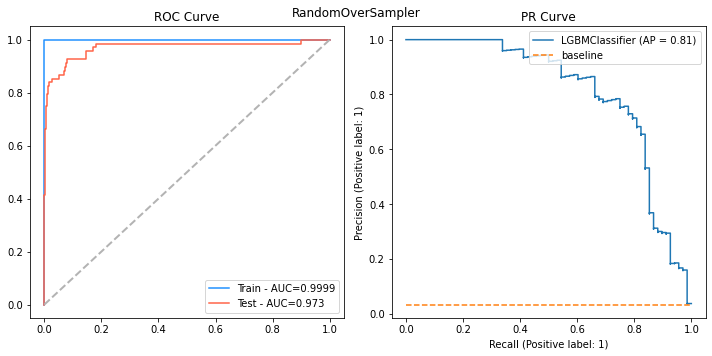

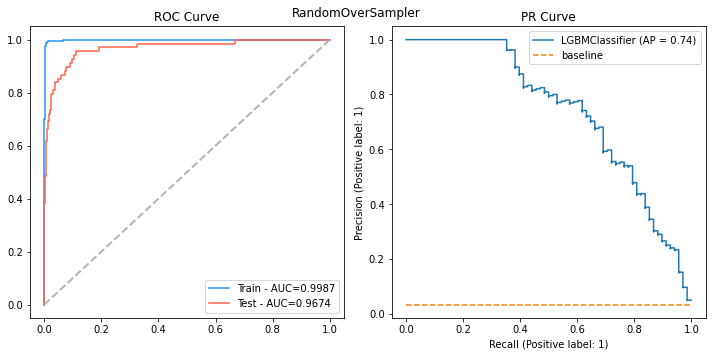

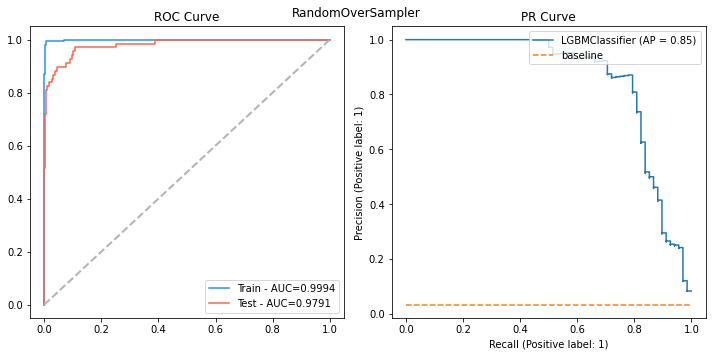

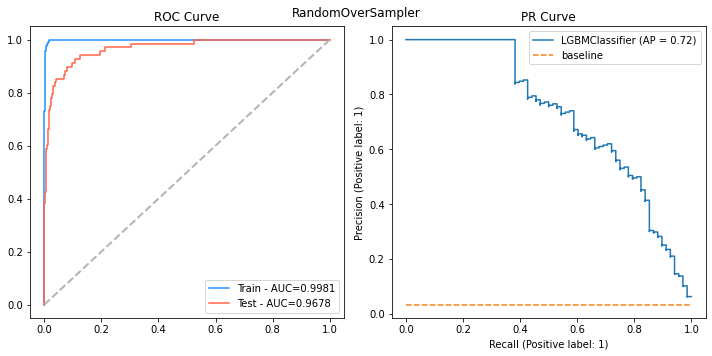

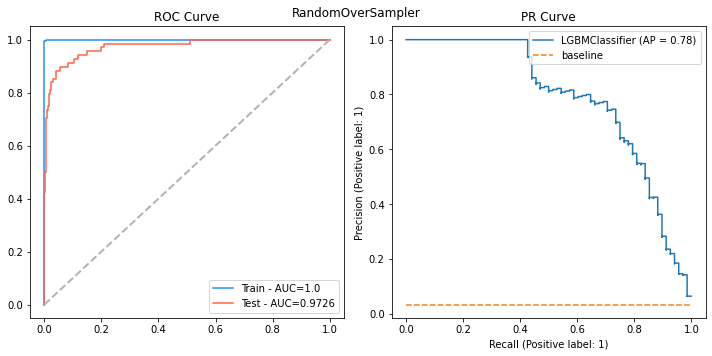

...

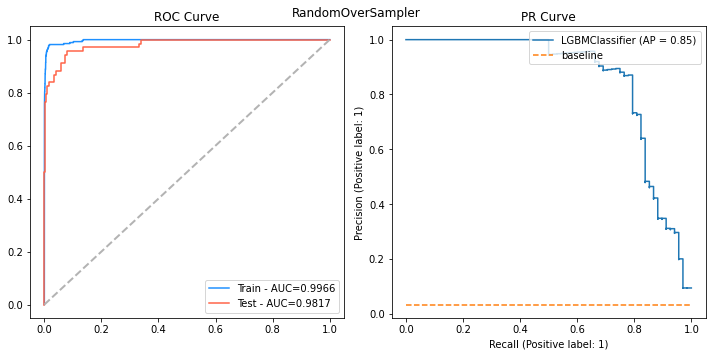

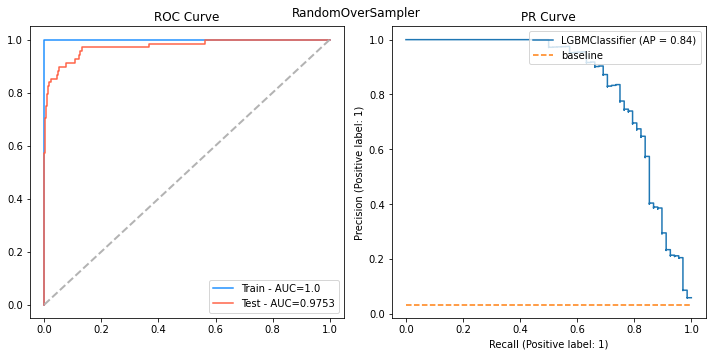

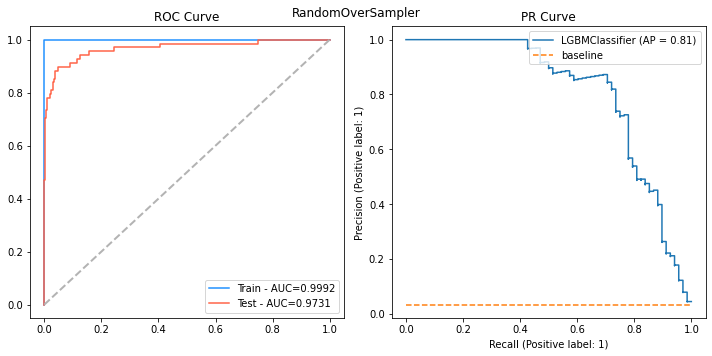

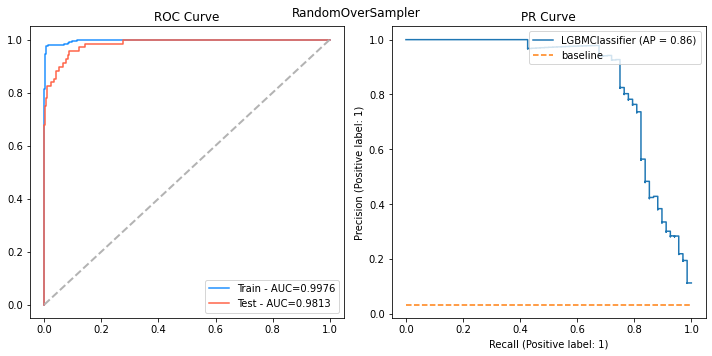

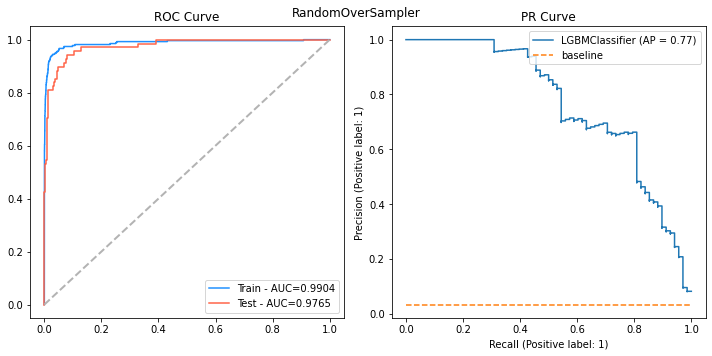

In [205]:
rs_name=str(oversampler)[:str(oversampler).find('(')]
def objective(trial: Trial, X, y,resampler=None) -> float:
    #joblib.dump(study, 'study.pkl')

    param = {
        "objective": "binary",
        "metric": "binary_logloss",
        "verbosity": -1,
        "boosting_type": "gbdt",
        "lambda_l1": trial.suggest_float("lambda_l1", 1e-8, 10.0, log=True),
        "lambda_l2": trial.suggest_float("lambda_l2", 1e-8, 10.0, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 2, 256),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.4, 1.0),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.4, 1.0),
        "bagging_freq": trial.suggest_int("bagging_freq", 1, 7),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),
    }

    train_scores, test_scores,accs, precs, recs,f1s, cfmx,model = lgb_tune_test_score(X_fe_sub,y,param,rs_name=rs_name, resampler=None, cv=kf)
    return np.mean(test_scores)

study = optuna.create_study(direction='maximize', sampler=TPESampler())
study.optimize(lambda trial: objective(trial, X_fe_sub, y,resampler=smote), n_trials=50)
print(f"Best trial: score {study.best_trial.value},\nparams {study.best_trial.params}")


Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0155395	training's auc: 0.999914	valid_1's binary_logloss: 0.0549576	valid_1's auc: 0.958312
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0173734	training's auc: 0.99992	valid_1's binary_logloss: 0.0460226	valid_1's auc: 0.986497
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.0161479	training's auc: 0.999934	valid_1's binary_logloss: 0.0403849	valid_1's auc: 0.986379
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's binary_logloss: 0.016996	training's auc: 0.999941	valid_1's binary_logloss: 0.0427498	valid_1's auc: 0.991201
Training until validation scores don't improve

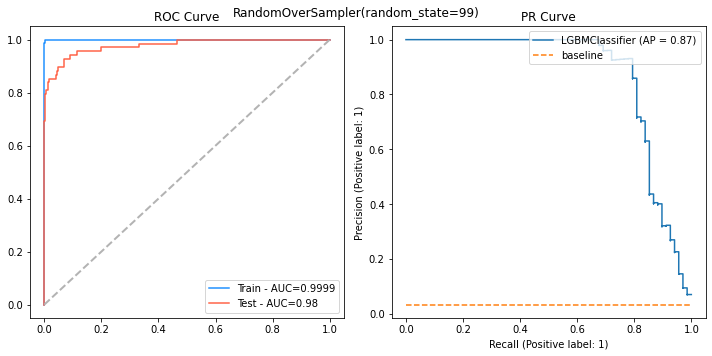

In [206]:
lgb_params_tune= {  "objective": "binary",
                    "metric": "binary_logloss",
                    "verbosity": -1,
                    "boosting_type": "gbdt",
                    'lambda_l1': 5.628699804684373e-07
                  , 'lambda_l2': 9.729721682845446
                  , 'num_leaves': 227
                  , 'feature_fraction': 0.6865389181895569
                  , 'bagging_fraction': 0.9566117965642437
                  , 'bagging_freq': 3
                  , 'min_child_samples': 98}
result_lgb_tune=[]

train_scores, test_scores,accs, precs, recs,f1s, cfmx,model = lgb_tune_test_score(X_fe_sub,y,lgb_params_tune,cv=kf,rs_name=oversampler, resampler=oversampler)
result_lgb_tune.append((model_name
               , rs_name
               , np.mean(accs)
               , np.std(accs)
               , np.mean(precs)
               , np.std(precs)
               , np.mean(recs)
               , np.std(recs)
               , np.mean(f1s)
               , np.std(f1s)
               , np.mean(train_scores)
               , np.std(train_scores)
               , np.mean(test_scores)
               , np.std(test_scores)
               , np.min(test_scores)
               , np.max(test_scores)                            
              )
             ) 

plt.show()

In [207]:
lgb_result_tune = pd.DataFrame(result_lgb_tune, columns=metric_cols)
display_metrics(lgb_result_tune.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
0,LightGBM,RandomOverSampler,92.32%,0.74%,30.11%,1.76%,94.68%,3.22%,45.63%,1.87%,99.99%,0.00%,98.00%,1.17%,95.83%,99.12%


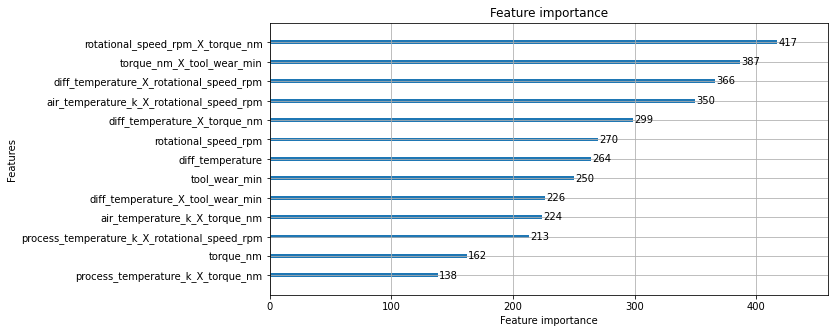

In [208]:
import lightgbm as lgb
lgb.plot_importance(model,figsize=(10,5))

## Divide Failure

In [209]:
'''
df_TWF = df_raw_ma[['Product ID','TWF']]
df_HDF = df_raw_ma[['Product ID','HDF']]
df_PWF = df_raw_ma[['Product ID','PWF']]
df_OSF = df_raw_ma[['Product ID','OSF']]
df_RNF = df_raw_ma[['Product ID','RNF']]
df_MF = df_raw_ma[['Product ID','Machine failure']]
'''

"\ndf_TWF = df_raw_ma[['Product ID','TWF']]\ndf_HDF = df_raw_ma[['Product ID','HDF']]\ndf_PWF = df_raw_ma[['Product ID','PWF']]\ndf_OSF = df_raw_ma[['Product ID','OSF']]\ndf_RNF = df_raw_ma[['Product ID','RNF']]\ndf_MF = df_raw_ma[['Product ID','Machine failure']]\n"

In [210]:
X_fe_sub.head()

,rotational_speed_rpm_X_torque_nm,rotational_speed_rpm,diff_temperature_X_rotational_speed_rpm,diff_temperature,torque_nm_X_tool_wear_min,air_temperature_k_X_torque_nm,process_temperature_k_X_rotational_speed_rpm,torque_nm,diff_temperature_X_torque_nm,air_temperature_k_X_rotational_speed_rpm,process_temperature_k_X_torque_nm,diff_temperature_X_tool_wear_min,tool_wear_min
Product ID,,,,,,,,,,,,,
M14860,66382.8,1551,-16285.5,-10.5,0.0,12758.68,478638.6,42.8,-449.40,462353.1,13208.08,-0.0,0
L47181,65190.4,1408,-14784.0,-10.5,138.9,13806.66,434649.6,46.3,-486.15,419865.6,14292.81,-31.5,3
L47182,74001.2,1498,-15579.2,-10.4,247.0,14726.14,462133.0,49.4,-513.76,446553.8,15239.90,-52.0,5
L47183,56603.5,1433,-14903.2,-10.4,276.5,11778.90,442223.8,39.5,-410.80,427320.6,12189.70,-72.8,7
L47184,56320.0,1408,-14784.0,-10.5,360.0,11928.00,434649.6,40.0,-420.00,419865.6,12348.00,-94.5,9


### TWF

In [211]:
y_TWF=df_TWF
y_TWF=y_TWF['TWF']
y_TWF.head()

0    0
1    0
2    0
3    0
4    0
Name: TWF, dtype: int64

In [212]:
## X Feature Engineer
feature_df=all_feature_selection(X,y_TWF,20)
feature_df[feature_df['Total']>0].sort_values('Total', ascending=False)   
fieldset = feature_df[feature_df.Total > 4].feature.values
fieldset

Fitting estimator with 22 features.
Fitting estimator with 21 features.
Fitting estimator with 22 features.
Fitting estimator with 21 features.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



RFE-XGBoost :  20 features
RFE-LightGBM 20 features
TreeBased-AdaBoost :  11 features
TreeBased-ExtraTrees :  13 features
TreeBased-GradientBoosting :  6 features
TreeBased-RandomForest :  13 features
TreeBased-XGBoost :  2 features
TreeBased-LightGBM :  11 features
Lasso :  12 features


array(['tool_wear_min', 'air_temperature_k_X_process_temperature_k',
       'air_temperature_k_X_rotational_speed_rpm',
       'air_temperature_k_X_tool_wear_min',
       'process_temperature_k_X_rotational_speed_rpm',
       'process_temperature_k_X_tool_wear_min',
       'rotational_speed_rpm_X_torque_nm',
       'rotational_speed_rpm_X_tool_wear_min',
       'torque_nm_X_tool_wear_min',
       'diff_temperature_X_rotational_speed_rpm',
       'diff_temperature_X_torque_nm', 'diff_temperature_X_tool_wear_min'],
      dtype=object)

In [213]:
X_TWF_sub = X[['tool_wear_min', 'air_temperature_k_X_tool_wear_min',
               'process_temperature_k_X_tool_wear_min',
               'diff_temperature_X_torque_nm', 'torque_nm_X_tool_wear_min',
               'rotational_speed_rpm_X_tool_wear_min',
               'diff_temperature_X_tool_wear_min',
               'air_temperature_k_X_process_temperature_k',
               'air_temperature_k_X_rotational_speed_rpm',
               'rotational_speed_rpm_X_torque_nm',
               'diff_temperature_X_rotational_speed_rpm', 'process_temperature_k'
              ]]

Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[76]	training's auc: 0.978704	valid_1's auc: 0.969669
Training until validation scores don't improve for 200 rounds.


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Did not meet early stopping. Best iteration is:
[80]	training's auc: 0.977716	valid_1's auc: 0.978459
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's auc: 0.978135	valid_1's auc: 0.96607
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's auc: 0.973998	valid_1's auc: 0.970701


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[78]	training's auc: 0.97819	valid_1's auc: 0.961131
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's auc: 0.992928	valid_1's auc: 0.964451
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's auc: 0.993271	valid_1's auc: 0.979017
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's auc: 0.993614	valid_1's auc: 0.96992
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[99]	training's auc: 0.992787	valid_1's auc: 0.91922
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[99]	training's auc: 0.993453	valid_1's auc: 0.96696
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[100]	training's auc: 0.988525	valid_1's auc: 0.965735
Training 

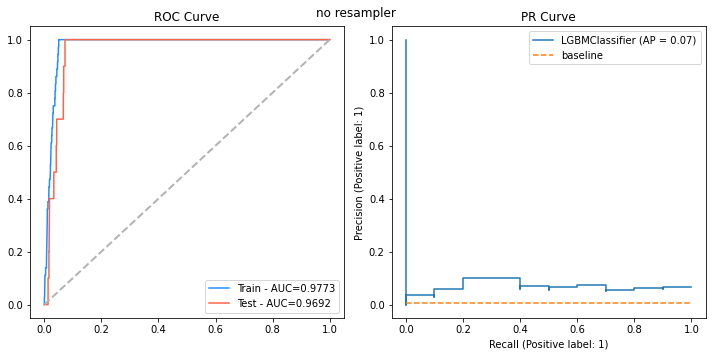

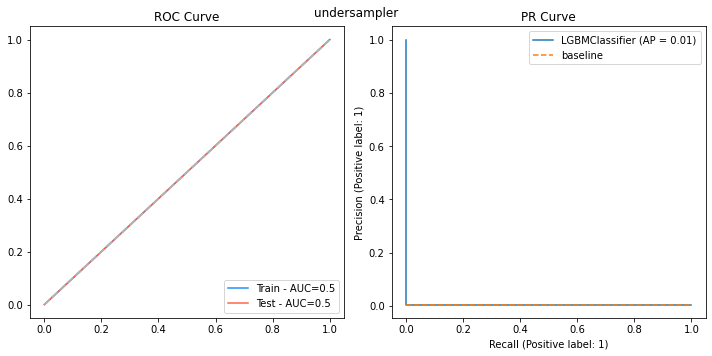

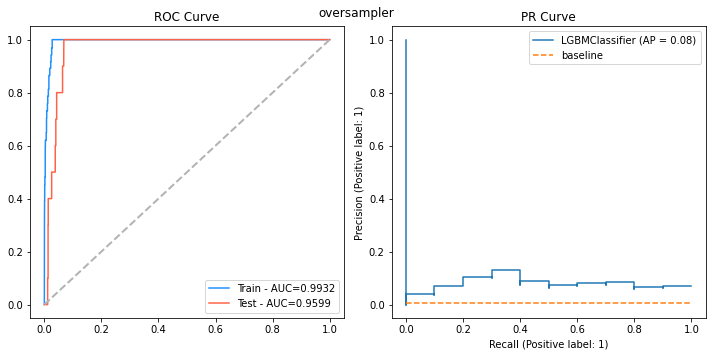

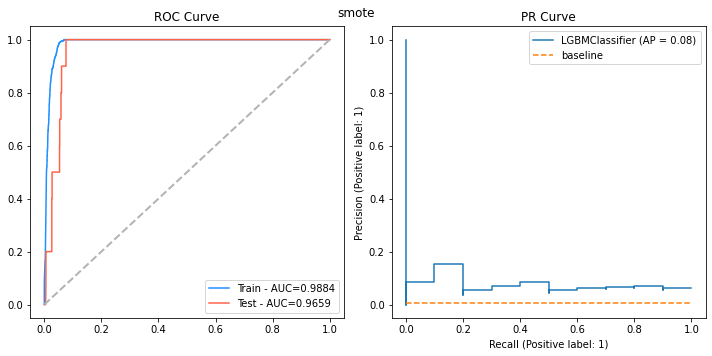

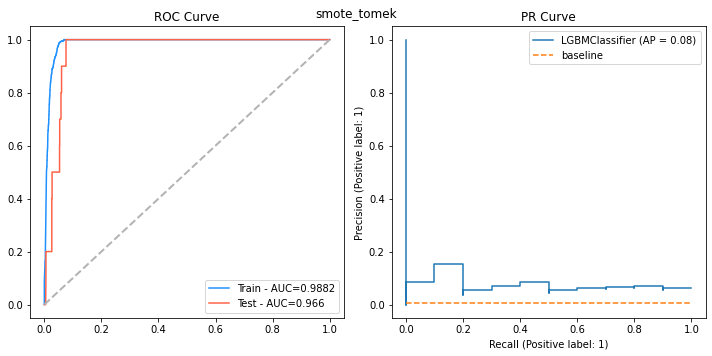

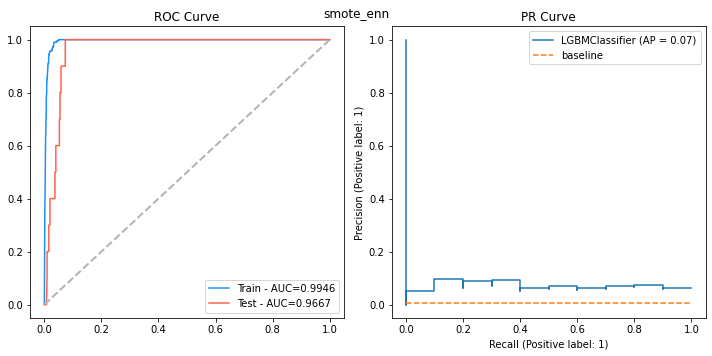

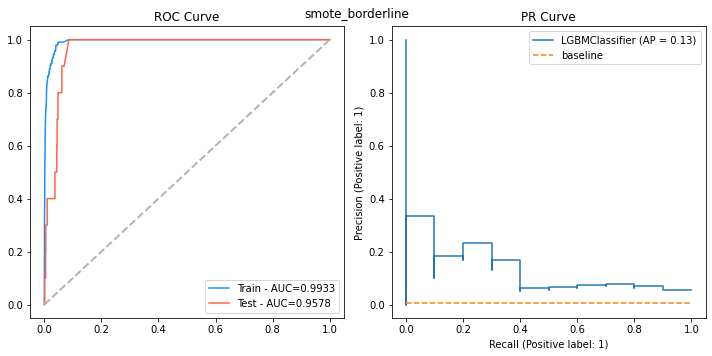

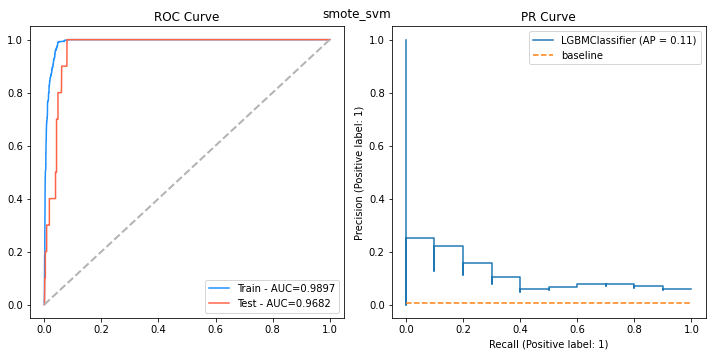

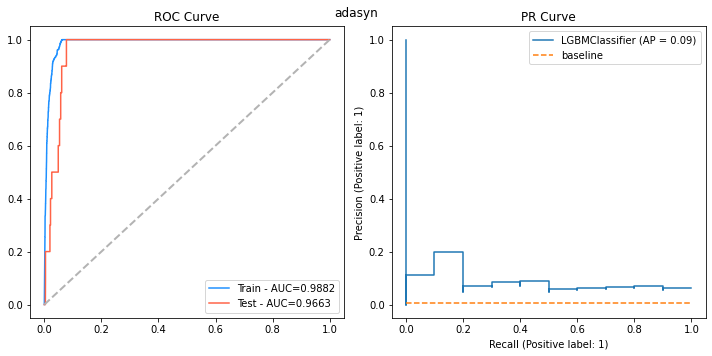

In [214]:
model_name = 'LightGBM'
result_lgb_twf=[]
for rs_name, rs in resamplers:
    train_scores, test_scores,accs, precs, recs,f1s, cfmx,model = lgb_cross_val_score(X_TWF_sub,y_TWF,lgb_params, resampler=rs, cv=kf)
    result_lgb_twf.append((model_name
                   , rs_name
                   , np.mean(accs)
                   , np.std(accs)
                   , np.mean(precs)
                   , np.std(precs)
                   , np.mean(recs)
                   , np.std(recs)
                   , np.mean(f1s)
                   , np.std(f1s)
                   , np.mean(train_scores)
                   , np.std(train_scores)
                   , np.mean(test_scores)
                   , np.std(test_scores)
                   , np.min(test_scores)
                   , np.max(test_scores)                         
                  )
                 ) 

plt.show()

In [215]:
lgb_result_twf = pd.DataFrame(result_lgb_twf, columns=metric_cols)
display_metrics(lgb_result_twf.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
0,LightGBM,no resampler,99.50%,0.08%,3.33%,6.67%,2.22%,4.44%,2.67%,5.33%,97.73%,0.17%,96.92%,0.57%,96.11%,97.85%
7,LightGBM,smote_svm,95.59%,0.35%,6.69%,1.20%,68.00%,19.04%,12.17%,2.30%,98.97%,0.06%,96.82%,0.38%,96.29%,97.26%
5,LightGBM,smote_enn,92.21%,0.63%,5.49%,0.39%,97.78%,4.44%,10.39%,0.71%,99.46%,0.03%,96.67%,0.37%,96.23%,97.22%
8,LightGBM,adasyn,92.62%,0.65%,5.67%,0.44%,95.78%,5.18%,10.70%,0.80%,98.82%,0.13%,96.63%,0.32%,96.27%,97.19%
4,LightGBM,smote_tomek,92.71%,0.77%,5.75%,0.49%,95.78%,5.18%,10.84%,0.88%,98.82%,0.13%,96.60%,0.34%,96.09%,97.05%
3,LightGBM,smote,92.73%,0.77%,5.77%,0.49%,95.78%,5.18%,10.87%,0.88%,98.84%,0.11%,96.59%,0.31%,96.09%,96.96%
2,LightGBM,oversampler,92.69%,0.66%,5.52%,0.82%,91.33%,8.27%,10.40%,1.50%,99.32%,0.03%,95.99%,2.09%,91.92%,97.90%
6,LightGBM,smote_borderline,94.56%,0.39%,6.65%,0.83%,82.67%,8.71%,12.30%,1.47%,99.33%,0.10%,95.78%,1.91%,92.07%,97.34%
1,LightGBM,undersampler,99.54%,0.02%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,50.00%,0.00%,50.00%,0.00%,50.00%,50.00%


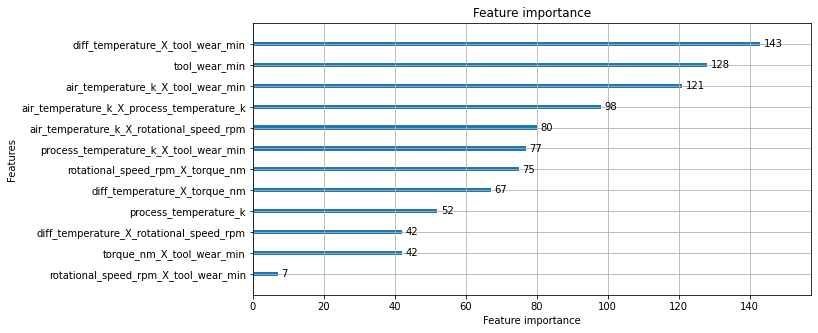

In [216]:
import lightgbm as lgb
lgb.plot_importance(model,figsize=(10,5))

### HDF

In [217]:
y_HDF=df_HDF
y_HDF=y_HDF['HDF']
y_HDF.head()

0    0
1    0
2    0
3    0
4    0
Name: HDF, dtype: int64

In [218]:
## X Feature Engineer
feature_df=all_feature_selection(X,y_HDF,20)
feature_df[feature_df['Total']>0].sort_values('Total', ascending=False)   
fieldset = feature_df[feature_df.Total > 4].feature.values
fieldset

Fitting estimator with 22 features.
Fitting estimator with 21 features.
Fitting estimator with 22 features.
Fitting estimator with 21 features.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



RFE-XGBoost :  20 features
RFE-LightGBM 20 features
TreeBased-AdaBoost :  10 features
TreeBased-ExtraTrees :  7 features
TreeBased-GradientBoosting :  4 features
TreeBased-RandomForest :  6 features
TreeBased-XGBoost :  2 features
TreeBased-LightGBM :  5 features
Lasso :  10 features


array(['air_temperature_k', 'process_temperature_k',
       'rotational_speed_rpm', 'air_temperature_k_X_rotational_speed_rpm',
       'process_temperature_k_X_rotational_speed_rpm', 'diff_temperature',
       'diff_temperature_X_rotational_speed_rpm',
       'diff_temperature_X_torque_nm'], dtype=object)

In [219]:
X_HDF_sub = X[['diff_temperature_X_rotational_speed_rpm', 'rotational_speed_rpm',
               'diff_temperature', 'process_temperature_k_X_rotational_speed_rpm',
               'air_temperature_k_X_rotational_speed_rpm',
               'diff_temperature_X_torque_nm', 'air_temperature_k',
               'process_temperature_k', 'rotational_speed_rpm_X_torque_nm'
              ]]

Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[43]	training's auc: 1	valid_1's auc: 0.999318
Training until validation scores don't improve for 200 rounds.


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Did not meet early stopping. Best iteration is:
[81]	training's auc: 1	valid_1's auc: 1
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[58]	training's auc: 1	valid_1's auc: 1
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[23]	training's auc: 1	valid_1's auc: 1
Training until validation scores don't improve for 200 rounds.


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Did not meet early stopping. Best iteration is:
[14]	training's auc: 1	valid_1's auc: 1
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5
Training until validation scores don't improve for 200 rounds.


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Did not meet early stopping. Best iteration is:
[7]	training's auc: 1	valid_1's auc: 0.999692
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[6]	training's auc: 1	valid_1's auc: 0.999516
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[6]	training's auc: 1	valid_1's auc: 1
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[7]	training's auc: 1	valid_1's auc: 1
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[7]	training's auc: 1	valid_1's auc: 1
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[7]	training's auc: 1	valid_1's auc: 1
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[7]	training's auc: 1	valid_1's auc: 1

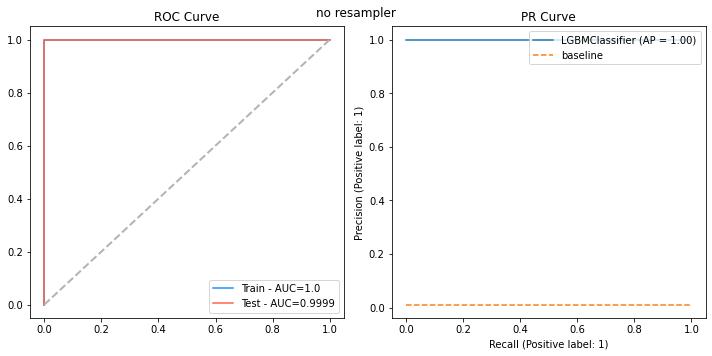

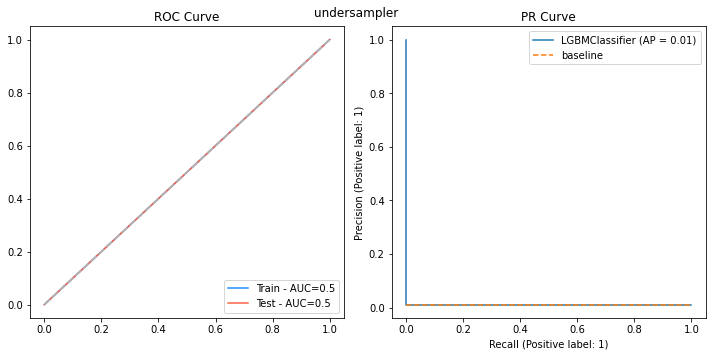

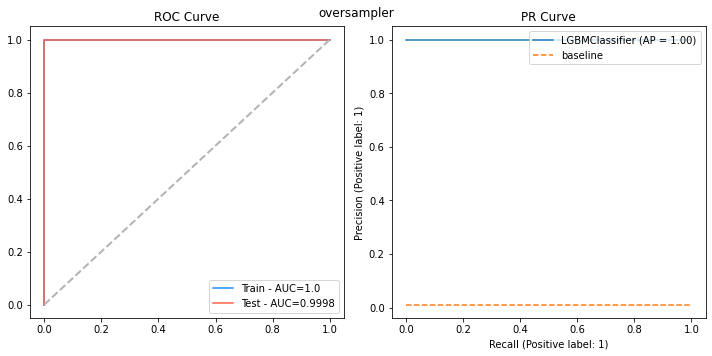

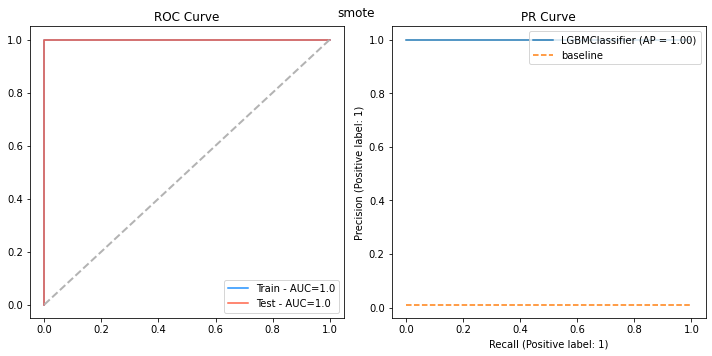

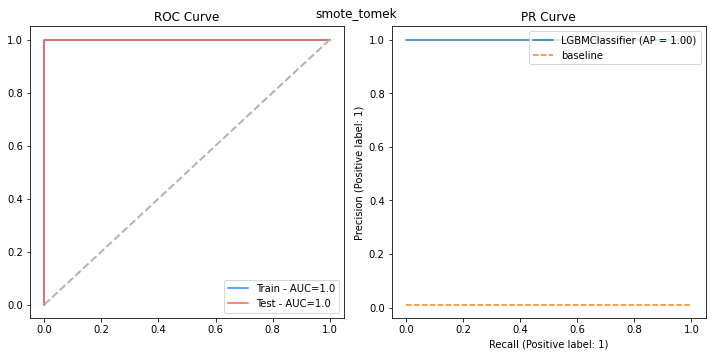

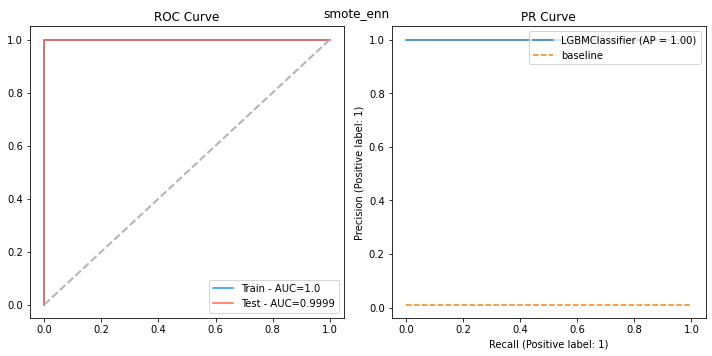

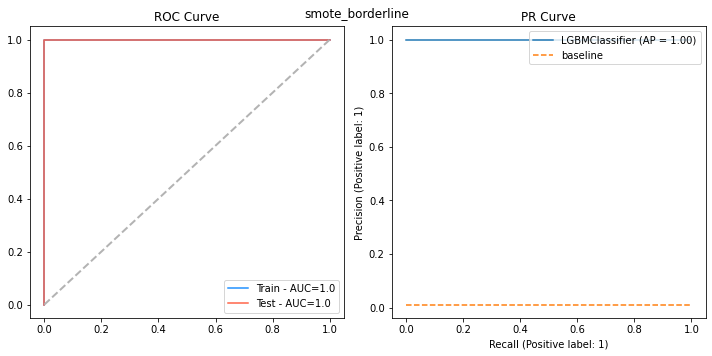

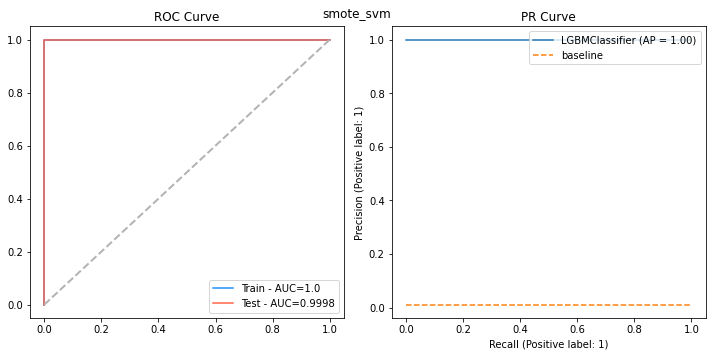

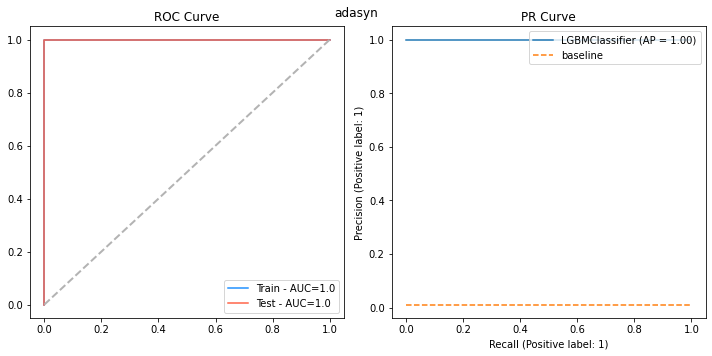

In [220]:
model_name = 'LightGBM'
result_lgb_hdf=[]
for rs_name, rs in resamplers:
    train_scores, test_scores,accs, precs, recs,f1s, cfmx,model = lgb_cross_val_score(X_HDF_sub,y_HDF,lgb_params, resampler=rs, cv=kf)
    result_lgb_hdf.append((model_name
                   , rs_name
                   , np.mean(accs)
                   , np.std(accs)
                   , np.mean(precs)
                   , np.std(precs)
                   , np.mean(recs)
                   , np.std(recs)
                   , np.mean(f1s)
                   , np.std(f1s)
                   , np.mean(train_scores)
                   , np.std(train_scores)
                   , np.mean(test_scores)
                   , np.std(test_scores)
                   , np.min(test_scores)
                   , np.max(test_scores)                         
                  )
                 ) 

plt.show()

In [221]:
lgb_result_hdf = pd.DataFrame(result_lgb_hdf, columns=metric_cols)
display_metrics(lgb_result_hdf.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
3,LightGBM,smote,99.81%,0.31%,89.49%,15.90%,100.00%,0.00%,93.61%,10.00%,100.00%,0.00%,100.00%,0.00%,100.00%,100.00%
4,LightGBM,smote_tomek,99.87%,0.19%,91.63%,11.84%,100.00%,0.00%,95.20%,6.95%,100.00%,0.00%,100.00%,0.00%,100.00%,100.00%
6,LightGBM,smote_borderline,99.98%,0.04%,98.40%,3.20%,100.00%,0.00%,99.17%,1.67%,100.00%,0.00%,100.00%,0.00%,100.00%,100.00%
8,LightGBM,adasyn,99.54%,0.46%,77.23%,20.58%,100.00%,0.00%,85.58%,13.53%,100.00%,0.00%,100.00%,0.00%,100.00%,100.00%
5,LightGBM,smote_enn,99.14%,0.12%,57.40%,3.26%,100.00%,0.00%,72.88%,2.64%,100.00%,0.00%,99.99%,0.02%,99.96%,100.00%
0,LightGBM,no resampler,98.85%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,100.00%,0.00%,99.99%,0.03%,99.93%,100.00%
2,LightGBM,oversampler,99.11%,0.27%,57.78%,8.84%,98.26%,2.13%,72.34%,6.51%,100.00%,0.00%,99.98%,0.02%,99.95%,100.00%
7,LightGBM,smote_svm,99.72%,0.19%,83.00%,11.66%,98.26%,2.13%,89.50%,6.72%,100.00%,0.00%,99.98%,0.04%,99.91%,100.00%
1,LightGBM,undersampler,98.85%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,50.00%,0.00%,50.00%,0.00%,50.00%,50.00%


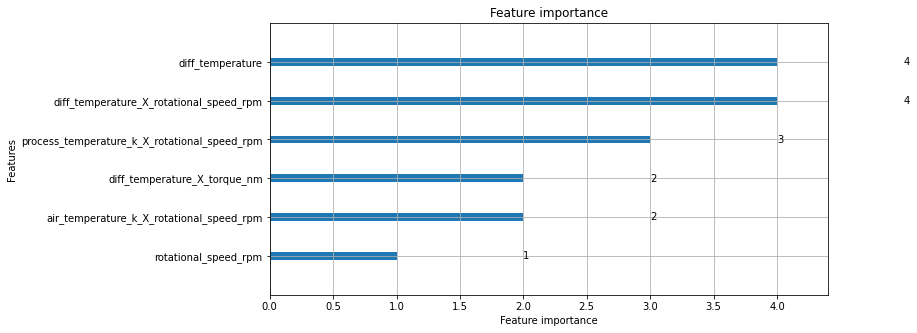

In [222]:
import lightgbm as lgb
lgb.plot_importance(model,figsize=(10,5))

### PWF

In [223]:
y_PWF=df_PWF
y_PWF=y_PWF['PWF']
y_PWF.head()

0    0
1    0
2    0
3    0
4    0
Name: PWF, dtype: int64

In [224]:
## X Feature Engineer
feature_df=all_feature_selection(X,y_PWF,20)
feature_df[feature_df['Total']>0].sort_values('Total', ascending=False)   
fieldset = feature_df[feature_df.Total > 4].feature.values
fieldset

Fitting estimator with 22 features.
Fitting estimator with 21 features.
Fitting estimator with 22 features.
Fitting estimator with 21 features.


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



RFE-XGBoost :  20 features
RFE-LightGBM 20 features
TreeBased-AdaBoost :  1 features
TreeBased-ExtraTrees :  8 features
TreeBased-GradientBoosting :  1 features
TreeBased-RandomForest :  7 features
TreeBased-XGBoost :  1 features
TreeBased-LightGBM :  12 features
Lasso :  13 features


array(['rotational_speed_rpm', 'torque_nm',
       'air_temperature_k_X_torque_nm',
       'process_temperature_k_X_torque_nm',
       'rotational_speed_rpm_X_torque_nm', 'diff_temperature_X_torque_nm'],
      dtype=object)

In [225]:
X_PWF_sub = X[['rotational_speed_rpm_X_torque_nm', 'rotational_speed_rpm',
               'torque_nm', 'diff_temperature_X_torque_nm',
               'air_temperature_k_X_torque_nm',
               'process_temperature_k_X_torque_nm']]

Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[71]	training's auc: 0.988728	valid_1's auc: 0.99195
Training until validation scores don't improve for 200 rounds.


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Did not meet early stopping. Best iteration is:
[42]	training's auc: 0.99074	valid_1's auc: 0.990289
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[77]	training's auc: 0.989477	valid_1's auc: 0.992534
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[81]	training's auc: 0.990803	valid_1's auc: 0.988018


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[89]	training's auc: 0.990923	valid_1's auc: 0.985441
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.




Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 1	valid_1's auc: 1
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 1	valid_1's auc: 1
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 1	valid_1's auc: 1
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 1	valid_1's auc: 1
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 1	valid_1's auc: 1
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[99]	training's auc: 0.999978	valid_1's auc: 0.999628
Training until validation scores don't improve for 200 rounds.
Did not meet early sto

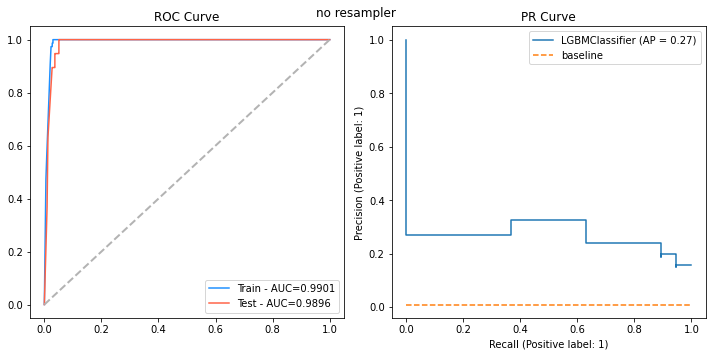

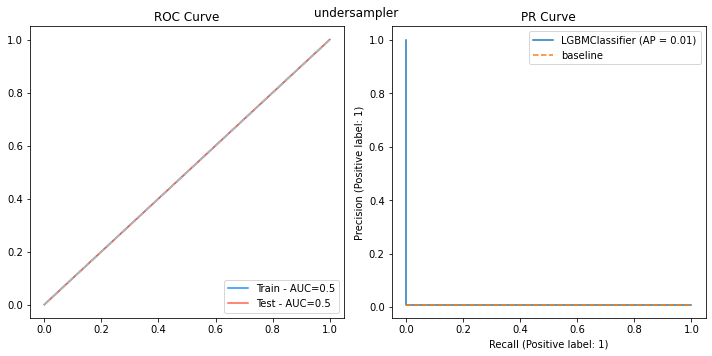

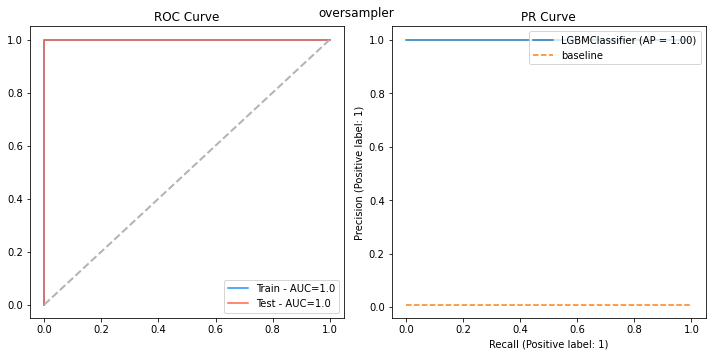

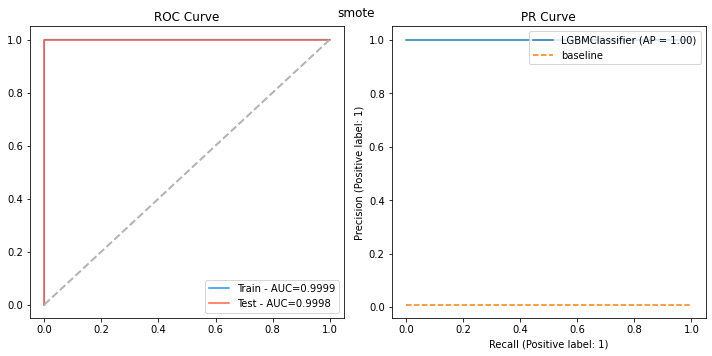

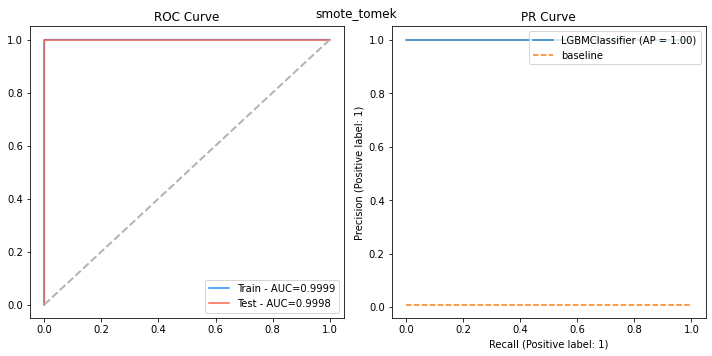

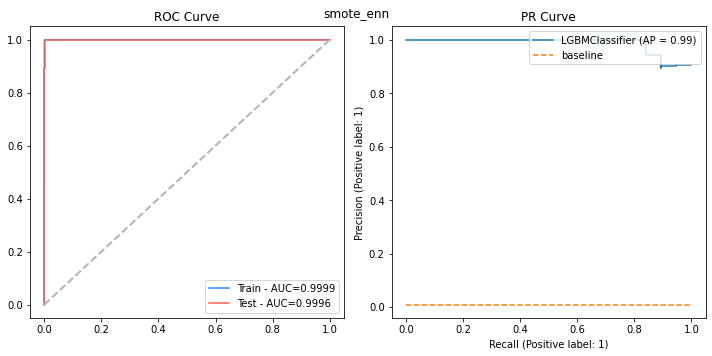

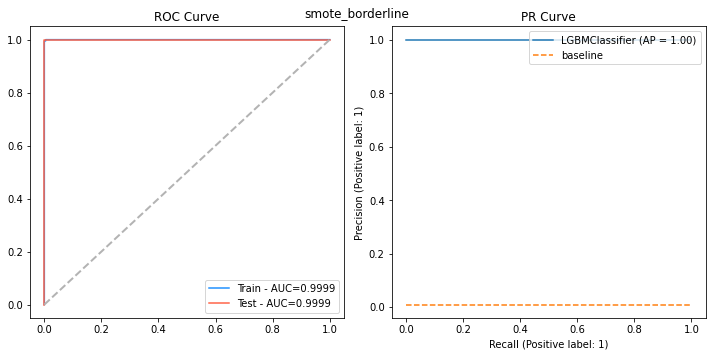

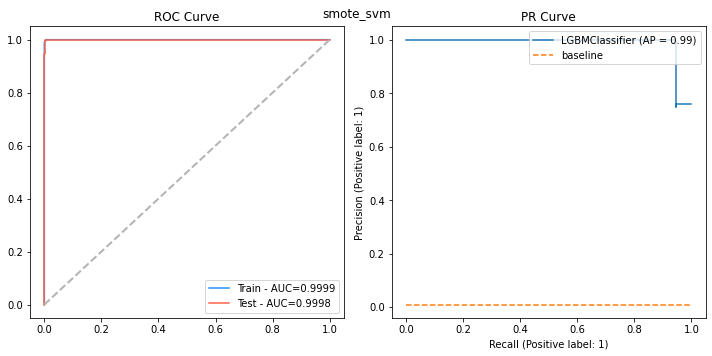

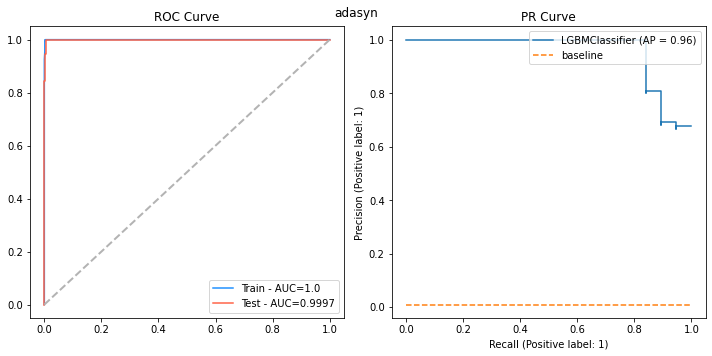

In [226]:
model_name = 'LightGBM'
result_lgb_pwf=[]
for rs_name, rs in resamplers:
    train_scores, test_scores,accs, precs, recs,f1s, cfmx,model = lgb_cross_val_score(X_PWF_sub,y_PWF,lgb_params, resampler=rs, cv=kf)
    result_lgb_pwf.append((model_name
                   , rs_name
                   , np.mean(accs)
                   , np.std(accs)
                   , np.mean(precs)
                   , np.std(precs)
                   , np.mean(recs)
                   , np.std(recs)
                   , np.mean(f1s)
                   , np.std(f1s)
                   , np.mean(train_scores)
                   , np.std(train_scores)
                   , np.mean(test_scores)
                   , np.std(test_scores)
                   , np.min(test_scores)
                   , np.max(test_scores)                         
                  )
                 ) 

plt.show()

In [227]:
lgb_result_pwf = pd.DataFrame(result_lgb_pwf, columns=metric_cols)
display_metrics(lgb_result_pwf.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
2,LightGBM,oversampler,100.00%,0.00%,100.00%,0.00%,100.00%,0.00%,100.00%,0.00%,100.00%,0.00%,100.00%,0.00%,100.00%,100.00%
6,LightGBM,smote_borderline,99.77%,0.09%,82.63%,8.35%,97.89%,4.21%,89.21%,3.80%,99.99%,0.01%,99.99%,0.01%,99.98%,100.00%
7,LightGBM,smote_svm,99.77%,0.24%,85.22%,16.22%,97.89%,4.21%,90.10%,9.53%,99.99%,0.00%,99.98%,0.03%,99.92%,100.00%
3,LightGBM,smote,99.74%,0.19%,81.11%,12.10%,97.89%,2.58%,88.31%,7.85%,99.99%,0.01%,99.98%,0.02%,99.94%,100.00%
4,LightGBM,smote_tomek,99.74%,0.19%,81.11%,12.10%,97.89%,2.58%,88.31%,7.85%,99.99%,0.01%,99.98%,0.02%,99.94%,100.00%
8,LightGBM,adasyn,99.81%,0.18%,88.19%,14.56%,96.84%,6.32%,91.34%,7.84%,100.00%,0.00%,99.97%,0.03%,99.92%,100.00%
5,LightGBM,smote_enn,99.67%,0.30%,78.00%,14.47%,97.89%,2.58%,86.17%,10.59%,99.99%,0.00%,99.96%,0.03%,99.92%,99.99%
0,LightGBM,no resampler,99.05%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,99.01%,0.09%,98.96%,0.26%,98.54%,99.25%
1,LightGBM,undersampler,99.05%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,50.00%,0.00%,50.00%,0.00%,50.00%,50.00%


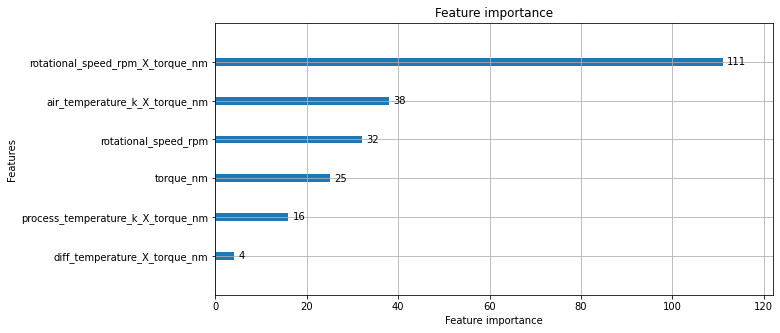

In [228]:
import lightgbm as lgb
lgb.plot_importance(model,figsize=(10,5))

### OSF

In [229]:
y_OSF=df_OSF
y_OSF=y_OSF['OSF']
y_OSF.head()

0    0
1    0
2    0
3    0
4    0
Name: OSF, dtype: int64

In [230]:
## X Feature Engineer
feature_df=all_feature_selection(X,y_OSF,20)
feature_df[feature_df['Total']>0].sort_values('Total', ascending=False)   
fieldset = feature_df[feature_df.Total > 4].feature.values
fieldset

Fitting estimator with 22 features.
Fitting estimator with 21 features.
Fitting estimator with 22 features.
Fitting estimator with 21 features.
RFE-XGBoost :  20 features
RFE-LightGBM 20 features
TreeBased-AdaBoost :  2 features
TreeBased-ExtraTrees :  9 features
TreeBased-GradientBoosting :  2 features
TreeBased-RandomForest :  8 features
TreeBased-XGBoost :  1 features
TreeBased-LightGBM :  11 features
Lasso :  7 features


array(['torque_nm', 'tool_wear_min', 'L', 'air_temperature_k_X_torque_nm',
       'rotational_speed_rpm_X_torque_nm', 'torque_nm_X_tool_wear_min'],
      dtype=object)

In [231]:
X_OSF_sub = X[['torque_nm_X_tool_wear_min', 'torque_nm', 'tool_wear_min',
               'air_temperature_k_X_torque_nm',
               'rotational_speed_rpm_X_torque_nm']]

Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[99]	training's auc: 0.995885	valid_1's auc: 0.9947
Training until validation scores don't improve for 200 rounds.


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Did not meet early stopping. Best iteration is:
[100]	training's auc: 0.995943	valid_1's auc: 0.995842
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[99]	training's auc: 0.995616	valid_1's auc: 0.995657
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[92]	training's auc: 0.995379	valid_1's auc: 0.997071
Training until validation scores don't improve for 200 rounds.


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Did not meet early stopping. Best iteration is:
[99]	training's auc: 0.994532	valid_1's auc: 0.992727
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[1]	training's auc: 0.5	valid_1's auc: 0.5


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[68]	training's auc: 0.998823	valid_1's auc: 0.999575
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[24]	training's auc: 0.998969	valid_1's auc: 0.998539
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[30]	training's auc: 0.998986	valid_1's auc: 0.998775
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[37]	training's auc: 0.999176	valid_1's auc: 0.998851
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[28]	training's auc: 0.999169	valid_1's auc: 0.998763
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[37]	training's auc: 0.998842	valid_1's auc: 0.999615
Training u

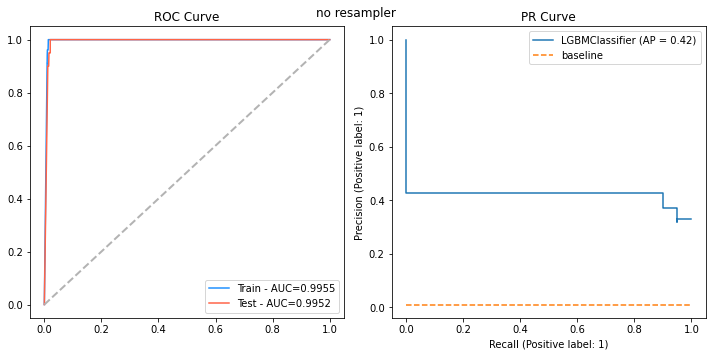

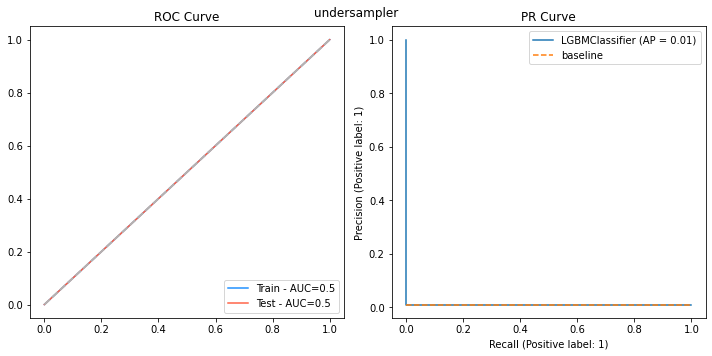

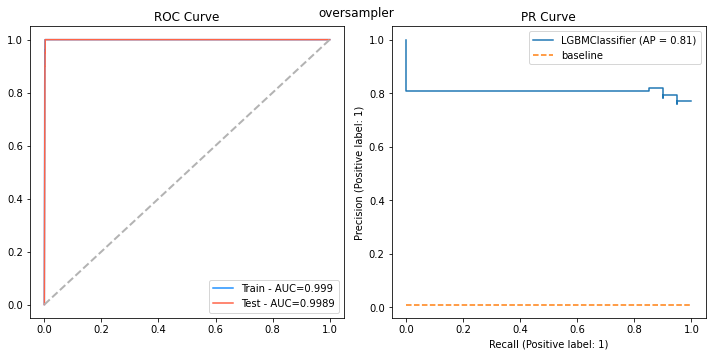

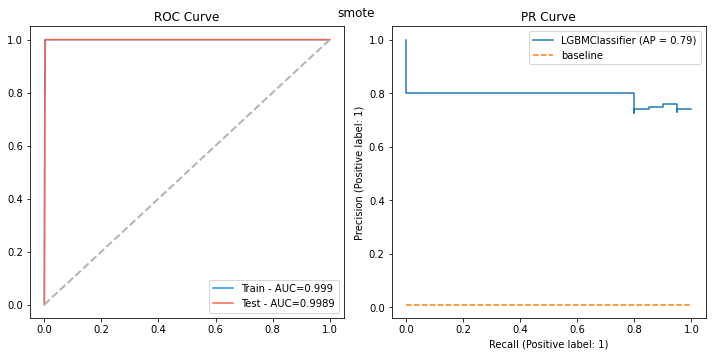

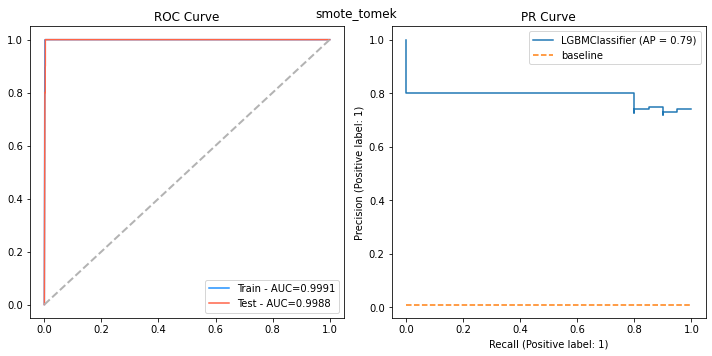

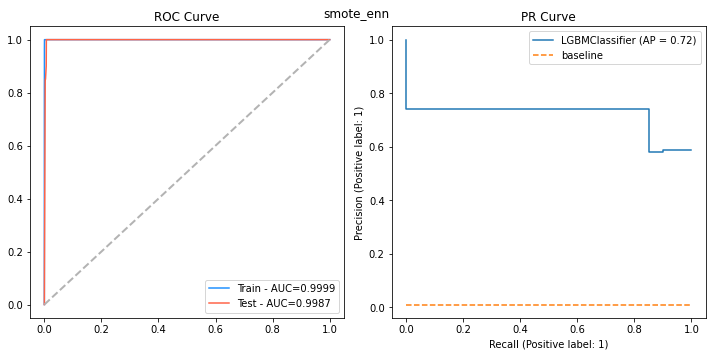

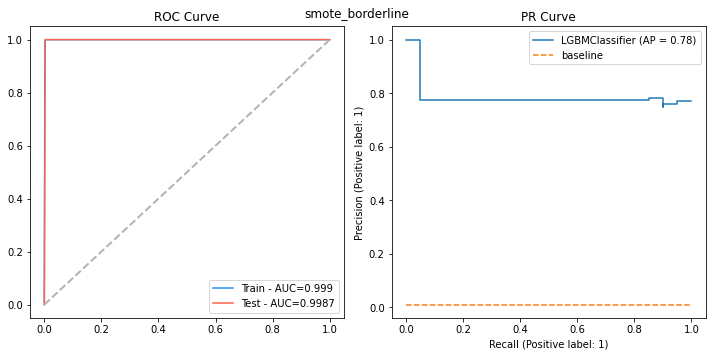

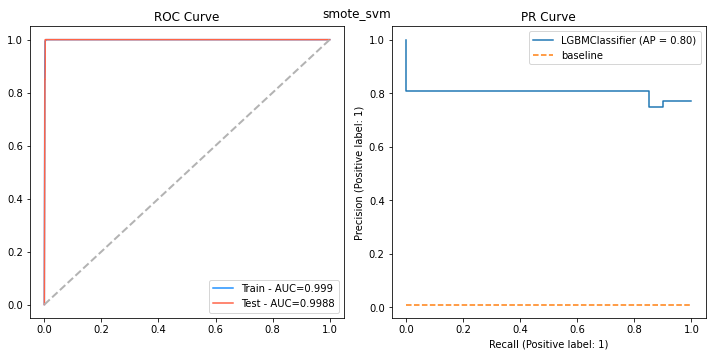

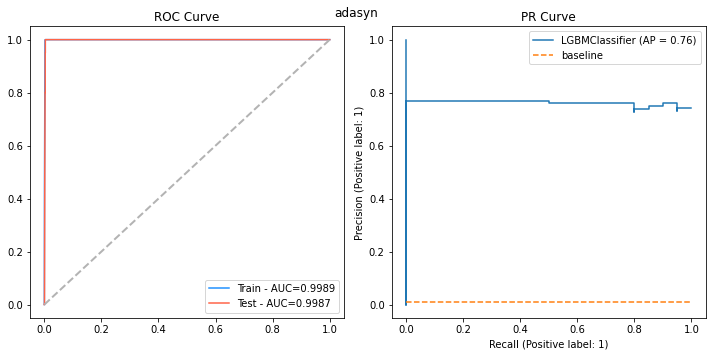

In [232]:
model_name = 'LightGBM'
result_lgb_osf=[]
for rs_name, rs in resamplers:
    train_scores, test_scores,accs, precs, recs,f1s, cfmx,model = lgb_cross_val_score(X_OSF_sub,y_OSF,lgb_params, resampler=rs, cv=kf)
    result_lgb_osf.append((model_name
                   , rs_name
                   , np.mean(accs)
                   , np.std(accs)
                   , np.mean(precs)
                   , np.std(precs)
                   , np.mean(recs)
                   , np.std(recs)
                   , np.mean(f1s)
                   , np.std(f1s)
                   , np.mean(train_scores)
                   , np.std(train_scores)
                   , np.mean(test_scores)
                   , np.std(test_scores)
                   , np.min(test_scores)
                   , np.max(test_scores)                         
                  )
                 ) 

plt.show()

In [233]:
lgb_result_osf = pd.DataFrame(result_lgb_osf, columns=metric_cols)
display_metrics(lgb_result_osf.sort_values(['auc_test_mean'], ascending=False))

,model,resampler,accuracy_mean,accuracy_std,precision_mean,precision_std,recall_mean,recall_std,f1-score_mean,f1-score_std,auc_train_mean,auc_train_std,auc_test_mean,auc_test_std,auc_test_min,auc_test_max
2,LightGBM,oversampler,99.62%,0.07%,72.30%,4.05%,100.00%,0.00%,83.86%,2.69%,99.90%,0.01%,99.89%,0.04%,99.85%,99.96%
3,LightGBM,smote,99.49%,0.11%,66.40%,4.90%,99.00%,2.00%,79.35%,3.31%,99.90%,0.01%,99.89%,0.04%,99.85%,99.96%
4,LightGBM,smote_tomek,99.55%,0.09%,69.10%,4.67%,99.00%,2.00%,81.28%,3.30%,99.91%,0.01%,99.88%,0.03%,99.85%,99.94%
7,LightGBM,smote_svm,99.34%,0.36%,63.63%,14.34%,98.00%,4.00%,75.95%,9.41%,99.90%,0.01%,99.88%,0.04%,99.83%,99.94%
8,LightGBM,adasyn,99.53%,0.12%,68.11%,5.96%,100.00%,0.00%,80.88%,4.20%,99.89%,0.01%,99.87%,0.04%,99.83%,99.94%
5,LightGBM,smote_enn,99.59%,0.26%,73.30%,11.66%,98.95%,2.11%,83.57%,7.87%,99.99%,0.01%,99.87%,0.06%,99.78%,99.95%
6,LightGBM,smote_borderline,99.64%,0.14%,75.64%,9.26%,96.95%,4.03%,84.45%,4.80%,99.90%,0.01%,99.87%,0.04%,99.82%,99.94%
0,LightGBM,no resampler,99.02%,0.02%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,99.55%,0.05%,99.52%,0.14%,99.27%,99.71%
1,LightGBM,undersampler,99.02%,0.02%,0.00%,0.00%,0.00%,0.00%,0.00%,0.00%,50.00%,0.00%,50.00%,0.00%,50.00%,50.00%


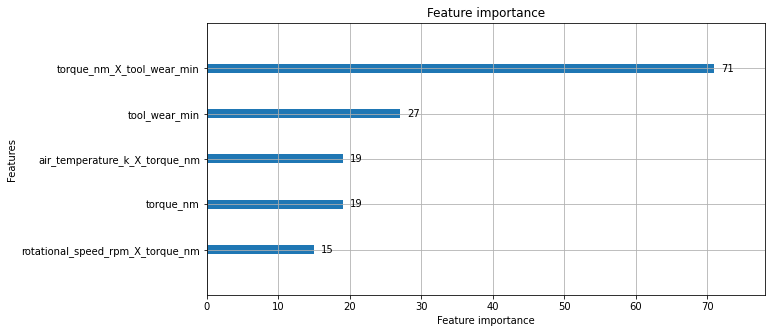

In [234]:
import lightgbm as lgb
lgb.plot_importance(model,figsize=(10,5))